# Full Evaluation Report — Multi-Seed

Comprehensive evaluation notebook that **aggregates results across multiple independent runs** (different seeds).

## Structure

| Experiment | Section | Research Question |
|-----------|---------|-------------------|
| **8.1** Training Dynamics & Convergence | Learning curves, stability, volunteer emergence, entropy | Do the MARL agents actually learn, and how stable is training? |
| **8.2** Baseline Comparison | Process performance, operational behaviour (final eval) | How do learned policies compare to heuristic baselines? |
| **8.3** Effect of Communication | Process metrics over training episodes | Why does communication help, and how do metrics evolve? |
| **8.4** Qualitative Analysis | Assignment distribution, workload, queues, gate activation | What does the learned behaviour look like at agent/case level? |

Add experiment directories to `EXPERIMENT_DIRS` and run all cells.

In [1]:
# ============================================================
# CONFIGURATION — edit these before running
# ============================================================

# List of experiment directories (one per seed/run)
# Each should point to a run folder containing method subdirs
# (e.g. baseline_random, mappo_collab, mappo_collab_comm, ...)
EXPERIMENT_DIRS = [
    "/Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_42",
    "/Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_41",
    "/Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_73",
    "/Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_53",
    "/Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_36",
]

# Working hours for waiting-time calculations
USE_WORKING_TIME = True
WORK_START_HOUR = 7
WORK_END_HOUR = 15

# Which log set to use for process performance metrics
LOG_TYPE = "final_eval"

# Smoothing window for learning curves
SMOOTH_WINDOW = 5

# Overload threshold: queue length above which a resource is "overloaded"
OVERLOAD_THRESHOLD = 5

# Convergence criterion: coefficient of variation below this = converged
CONVERGENCE_CV_THRESHOLD = 0.10

In [2]:
# ============================================================
# IMPORTS & SETUP
# ============================================================
import os, sys, re, glob, json, warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.font_manager as fm
from pathlib import Path
from collections import defaultdict

warnings.filterwarnings("ignore", category=FutureWarning)
pd.set_option("display.float_format", lambda x: f"{x:.2f}")

# ── Find project root (directory containing src/ and results/) ──
def _find_project_root():
    candidates = [os.path.dirname(os.path.abspath("__file__"))]
    d = os.path.abspath(".")
    for _ in range(10):
        candidates.append(d)
        d = os.path.dirname(d)
    for c in candidates:
        if os.path.isdir(os.path.join(c, "src")) and os.path.isdir(os.path.join(c, "results")):
            return c
    return os.path.abspath(".")

PROJECT_ROOT = _find_project_root()
print(f"Project root: {PROJECT_ROOT}")

# Resolve EXPERIMENT_DIRS relative to project root
EXPERIMENT_DIRS = [
    os.path.join(PROJECT_ROOT, d) if not os.path.isabs(d) else d
    for d in EXPERIMENT_DIRS
]
print(f"Experiment dirs ({len(EXPERIMENT_DIRS)}):")
for d in EXPERIMENT_DIRS:
    print(f"  • {d}  (exists: {os.path.isdir(d)})")

# Ensure src/ is on the path
_src_dir = os.path.join(PROJECT_ROOT, "src")
if _src_dir not in sys.path:
    sys.path.insert(0, _src_dir)

# Configure working hours
if USE_WORKING_TIME:
    try:
        from environment.work_schedule import working_seconds_between, configure
        configure(WORK_START_HOUR, WORK_END_HOUR)
        print(f"Working hours: Mon-Fri {WORK_START_HOUR:02d}:00-{WORK_END_HOUR:02d}:00")
        HAS_WORK_SCHEDULE = True
    except ImportError:
        print("WARNING: work_schedule module not found, using calendar time")
        HAS_WORK_SCHEDULE = False
else:
    HAS_WORK_SCHEDULE = False

# ── Academic plotting style (Times New Roman, grayscale) ──
# Try to find Times New Roman or fall back to serif
_serif_font = "Times New Roman"
_available = {f.name for f in fm.fontManager.ttflist}
if _serif_font not in _available:
    for fallback in ["Times", "Nimbus Roman", "Liberation Serif", "DejaVu Serif"]:
        if fallback in _available:
            _serif_font = fallback
            break
    else:
        _serif_font = "serif"
print(f"Font: {_serif_font}")

plt.rcParams.update({
    "font.family": "serif",
    "font.serif": [_serif_font],
    "mathtext.fontset": "dejavuserif",
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "font.size": 10,
    "axes.titlesize": 11,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "figure.titlesize": 12,
    "axes.grid": True,
    "grid.alpha": 0.25,
    "grid.linestyle": "--",
    "grid.linewidth": 0.5,
    "axes.spines.top": False,
    "axes.spines.right": False,
    "axes.linewidth": 0.8,
    "lines.linewidth": 1.5,
    "axes.prop_cycle": plt.cycler(color=["#000000"]),  # all black
})

Project root: /Users/bjornkoemans/Documents/GitHub/master-cope
Experiment dirs (5):
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_42  (exists: True)
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_41  (exists: True)
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_73  (exists: True)
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_53  (exists: True)
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_36  (exists: True)
Working hours: Mon-Fri 07:00-15:00
Font: Times New Roman


In [3]:
# ============================================================
# RESOLVE EXPERIMENT DIRECTORIES
# ============================================================
def resolve_experiment_dir(path):
    """If path contains timestamp subdirs, pick the latest one."""
    p = Path(path)
    if not p.is_dir():
        raise FileNotFoundError(f"Directory not found: {path}")
    subdirs = sorted(
        [d for d in p.iterdir()
         if d.is_dir() and re.match(r"^\d{8}_\d{6}", d.name)],
        key=lambda d: d.name,
    )
    if subdirs:
        resolved = str(subdirs[-1])
        print(f"  Resolved: {resolved}")
        return resolved
    return str(p)

# Resolve all experiment dirs
RESOLVED_DIRS = []
for exp_dir in EXPERIMENT_DIRS:
    try:
        resolved = resolve_experiment_dir(exp_dir)
        RESOLVED_DIRS.append(resolved)
    except FileNotFoundError as e:
        print(f"  WARNING: {e}")

print(f"\n{len(RESOLVED_DIRS)} experiment run(s) loaded:")
for d in RESOLVED_DIRS:
    print(f"  • {d}")


5 experiment run(s) loaded:
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_42
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_41
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_73
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_53
  • /Users/bjornkoemans/master-cope-FINAL/results/runs/loan_app/FINAL_36


In [4]:
# ============================================================
# DISCOVER METHODS & ASSIGN STYLES (consistent colour palette) — multi-seed
# ============================================================
def discover_methods(experiment_dir, log_type="final_eval"):
    """Find all methods in a single experiment directory.
    Returns dict: method_name -> list of CSV log file paths.
    """
    methods = {}
    for entry in sorted(os.listdir(experiment_dir)):
        entry_path = os.path.join(experiment_dir, entry)
        if not os.path.isdir(entry_path) or entry in ("logs", "configs", ".tmp_configs"):
            continue
        log_dir = os.path.join(entry_path, "logs", log_type)
        if not os.path.isdir(log_dir):
            ts_dirs = sorted(glob.glob(os.path.join(entry_path, "[0-9]*_[0-9]*/logs", log_type)))
            if ts_dirs:
                log_dir = ts_dirs[-1]
            else:
                continue
        csv_files = sorted(glob.glob(os.path.join(log_dir, "*.csv")))
        if csv_files:
            methods[entry] = csv_files
    return methods

def discover_methods_multi(experiment_dirs, log_type="final_eval"):
    """Discover and merge methods across multiple experiment directories.
    Returns dict: method_name -> list of CSV log file paths (pooled).
    Also returns a run_map: method_name -> list of (run_idx, csv_path) for per-run analysis.
    """
    merged = {}
    run_map = defaultdict(list)  # method -> [(run_idx, csv_path), ...]

    for run_idx, exp_dir in enumerate(experiment_dirs):
        methods = discover_methods(exp_dir, log_type)
        for name, csv_files in methods.items():
            if name not in merged:
                merged[name] = []
            merged[name].extend(csv_files)
            for f in csv_files:
                run_map[name].append((run_idx, f))

    return merged, run_map

# Grayscale palette + line styles + hatch patterns (fallback / legend diversity)
_GRAY_SHADES = ["#000000", "#555555", "#999999", "#BBBBBB", "#DDDDDD", "#707070", "#404040"]
_LINE_STYLES = ["-", "--", "-.", ":", "-", "--", "-."]
_MARKERS = ["o", "s", "^", "D", "v", "P", "X"]
_HATCHES = ["", "///", "...", "xxx", "\\\\\\", "+++", "---"]

def assign_styles(methods):
    """Assign consistent colors per method category (plus line styles, markers, hatch)."""
    styles = {}
    names = list(methods.keys())
    for i, name in enumerate(names):
        styles[name] = {
            "color": _GRAY_SHADES[i % len(_GRAY_SHADES)],
            "linestyle": _LINE_STYLES[i % len(_LINE_STYLES)],
            "marker": _MARKERS[i % len(_MARKERS)],
            "hatch": _HATCHES[i % len(_HATCHES)],
        }
    # Consistent colour palette per method category
    COLOR_MAPPO_COMM     = "#8B1A4B"  # dark pink / burgundy  (MAPPO + IC3Net / +comm)
    COLOR_MAPPO          = "#E89450"  # orange                (MAPPO without comm)
    COLOR_RANDOM         = "#F4C430"  # yellow / gold         (Random baseline)
    COLOR_BEST_MEDIAN    = "#4A4A4A"  # dark gray             (Best Median baseline)
    COLOR_SHORTEST_QUEUE = "#A8A8A8"  # light gray            (Shortest Queue baseline)

    for name in names:
        low = name.lower()
        if "comm" in low:
            styles[name]["color"] = COLOR_MAPPO_COMM
        elif "mappo" in low:
            styles[name]["color"] = COLOR_MAPPO
        elif "random" in low:
            styles[name]["color"] = COLOR_RANDOM
        elif "best" in low and "median" in low:
            styles[name]["color"] = COLOR_BEST_MEDIAN
        elif "shortest" in low and "queue" in low:
            styles[name]["color"] = COLOR_SHORTEST_QUEUE
        elif "baseline" in low:
            # Unknown baseline — fall back to a neutral gray
            styles[name]["color"] = "#707070"
    return styles

def assign_colors(methods):
    s = assign_styles(methods)
    return {name: s[name]["color"] for name in s}

def method_label(name):
    """Pretty label for method names — consistent across the notebook."""
    low = name.lower()
    if "baseline" in low:
        if "random" in low:
            return "Random"
        if "best" in low and "median" in low:
            return "Best Median"
        if "shortest" in low and "queue" in low:
            return "Shortest Queue"
        return name.replace("_", " ").title()
    if "mappo" in low:
        # IC3Net = MAPPO with the communication module (flagged by "comm" in the folder name)
        if "comm" in low:
            return "MAPPO + IC3Net"
        return "MAPPO"
    return name.replace("_", " ").title()

def method_sort_key(name):
    """Fixed presentation order used across all figures & tables.
    Lower = earlier in bar charts, legends, tables.
    """
    low = name.lower()
    if "mappo" in low and "comm" in low: return 0   # MAPPO + IC3Net
    if "mappo" in low:                   return 1   # MAPPO
    if "random" in low:                  return 2   # Random
    if "best" in low and "median" in low: return 3  # Best Median
    if "shortest" in low and "queue" in low: return 4  # Shortest Queue
    return 99

# Discover across all runs
methods, run_map = discover_methods_multi(RESOLVED_DIRS, LOG_TYPE)
# Enforce consistent ordering across every downstream dict built by iterating `methods`
methods = dict(sorted(methods.items(), key=lambda kv: method_sort_key(kv[0])))
# run_map follows method order too
run_map = {k: run_map[k] for k in methods}

colors = assign_colors(methods)
styles = assign_styles(methods)

n_runs = len(RESOLVED_DIRS)
print(f"Found {len(methods)} methods across {n_runs} run(s) (in presentation order):")
for name, files in methods.items():
    runs_with = len(set(r for r, _ in run_map[name]))
    print(f"  {method_label(name):20s}  ({name}): {len(files)} episodes total ({runs_with}/{n_runs} runs)")

# For backward compat: single EXPERIMENT_DIR points to first
EXPERIMENT_DIR = RESOLVED_DIRS[0] if RESOLVED_DIRS else ""


Found 5 methods across 5 run(s) (in presentation order):
  MAPPO + IC3Net        (mappo_parallel_comm): 50 episodes total (5/5 runs)
  MAPPO                 (mappo_parallel): 50 episodes total (5/5 runs)
  Random                (baseline_random): 50 episodes total (5/5 runs)
  Best Median           (baseline_best_median): 50 episodes total (5/5 runs)
  Shortest Queue        (baseline_shortest_queue): 50 episodes total (5/5 runs)


In [5]:
# ============================================================
# HELPER FUNCTIONS
# ============================================================

def safe_parse_timestamps(series):
    """Parse timestamps with varying precision (with or without fractional seconds)."""
    return pd.to_datetime(series, format="ISO8601", utc=True)

def calc_minutes_between(start, end):
    """Calculate minutes between two timestamps, using working hours if configured."""
    if HAS_WORK_SCHEDULE and USE_WORKING_TIME:
        return working_seconds_between(start, end) / 60.0
    return (end - start).total_seconds() / 60.0

def smooth(values, window):
    """Moving average with edge padding."""
    if len(values) < window:
        return values
    padded = np.pad(values, (window // 2, window - 1 - window // 2), mode="edge")
    return np.convolve(padded, np.ones(window) / window, mode="valid")

def _is_best_median(name):
    """Check if a method name refers to the Best Median baseline."""
    return "best_median" in name.lower() or "best median" in name.lower()

def _get_role(agent_name):
    """Extract role from agent name, e.g. 'Clerk-000001' -> 'Clerk'."""
    return agent_name.rsplit("-", 1)[0] if "-" in agent_name else agent_name

def load_training_summary(method_dir):
    """Parse training_summary.txt for reward curves."""
    summary_path = os.path.join(method_dir, "training_summary.txt")
    if not os.path.exists(summary_path):
        return None
    text = open(summary_path).read()
    train_rewards, eval_rewards = [], []
    in_train, in_eval = False, False
    for line in text.splitlines():
        if "Episode Rewards:" in line:
            in_train, in_eval = True, False
            continue
        if "Evaluation Rewards:" in line:
            in_train, in_eval = False, True
            continue
        if line.strip() == "" or line.startswith("="):
            in_train = in_eval = False
            continue
        m = re.match(r"\s*(Episode|Eval)\s+\d+:\s*([\d.eE+-]+)", line)
        if m:
            val = float(m.group(2))
            if in_train:
                train_rewards.append(val)
            elif in_eval:
                eval_rewards.append(val)
    return {"train": train_rewards, "eval": eval_rewards} if train_rewards or eval_rewards else None

print("Helper functions loaded.")

Helper functions loaded.


In [6]:
# ============================================================
# LOAD ALL LOG DATA
# ============================================================
def load_episode_data(csv_files):
    """Load and parse all episodes for a method. Returns list of DataFrames."""
    episodes = []
    for f in csv_files:
        try:
            df = pd.read_csv(f)
            if len(df) == 0:
                continue
            for col in ["case_open_time", "case_completed_time",
                        "task_assigned_time", "task_started_time", "task_completed_time"]:
                if col in df.columns:
                    df[col] = safe_parse_timestamps(df[col])
            episodes.append(df)
        except Exception as e:
            print(f"  Warning: could not load {os.path.basename(f)}: {e}")
    return episodes

# Load all data
all_data = {}  # method_name -> list[DataFrame]
for name, csv_files in methods.items():
    episodes = load_episode_data(csv_files)
    all_data[name] = episodes
    print(f"  {name}: {len(episodes)} episodes loaded, {sum(len(ep) for ep in episodes)} total tasks")

  mappo_parallel_comm: 50 episodes loaded, 68700 total tasks
  mappo_parallel: 50 episodes loaded, 68700 total tasks
  baseline_random: 50 episodes loaded, 68700 total tasks
  baseline_best_median: 50 episodes loaded, 68700 total tasks
  baseline_shortest_queue: 50 episodes loaded, 68700 total tasks


---
## Compute Metrics
These cells compute all metrics used across experiments.

In [7]:
# ============================================================
# COMPUTE PROCESS PERFORMANCE METRICS PER EPISODE
# ============================================================
def compute_process_metrics(df):
    """Compute process performance metrics for a single episode DataFrame.
    
    Returns dict with:
      - avg_cycle_time_min: mean case duration (open -> completed)
      - avg_waiting_time_min: mean task waiting time (assigned -> started)
      - avg_processing_time_min: mean task processing time (started -> completed)
      - resource_utilization: fraction of time agents are busy
      - case_throughput: cases completed per hour
      - flow_efficiency: processing_time / cycle_time ratio
    """
    metrics = {}
    
    # ── Cycle time (case level) ──
    cases = df.groupby("case_id").agg(
        open_time=("case_open_time", "first"),
        completed_time=("case_completed_time", "first"),
        n_tasks=("task_id", "count"),
    ).dropna(subset=["open_time", "completed_time"])
    
    cycle_times = []
    for _, row in cases.iterrows():
        ct = calc_minutes_between(row["open_time"], row["completed_time"])
        cycle_times.append(ct)
    metrics["avg_cycle_time_min"] = np.mean(cycle_times) if cycle_times else np.nan
    metrics["std_cycle_time_min"] = np.std(cycle_times) if cycle_times else np.nan
    metrics["n_cases"] = len(cases)
    
    # ── Waiting time (task level: assigned -> started) ──
    waiting_times = []
    for _, row in df.iterrows():
        if pd.notna(row.get("task_assigned_time")) and pd.notna(row.get("task_started_time")):
            wt = calc_minutes_between(row["task_assigned_time"], row["task_started_time"])
            waiting_times.append(max(0, wt))
    metrics["avg_waiting_time_min"] = np.mean(waiting_times) if waiting_times else np.nan
    metrics["std_waiting_time_min"] = np.std(waiting_times) if waiting_times else np.nan
    
    # ── Processing time (task level: started -> completed) ──
    processing_times = []
    for _, row in df.iterrows():
        if pd.notna(row.get("task_started_time")) and pd.notna(row.get("task_completed_time")):
            pt = calc_minutes_between(row["task_started_time"], row["task_completed_time"])
            processing_times.append(max(0, pt))
    metrics["avg_processing_time_min"] = np.mean(processing_times) if processing_times else np.nan
    
    # ── Resource utilization ──
    # Sum of all agent busy time / (n_agents * simulation span)
    if len(df) > 0 and "task_agent_id" in df.columns:
        agents = df["task_agent_id"].unique()
        sim_start = df["case_open_time"].min()
        sim_end = df["task_completed_time"].max()
        if pd.notna(sim_start) and pd.notna(sim_end):
            sim_duration_min = calc_minutes_between(sim_start, sim_end)
            total_capacity_min = len(agents) * sim_duration_min if sim_duration_min > 0 else 1
            total_busy_min = sum(processing_times)
            metrics["resource_utilization"] = min(1.0, total_busy_min / total_capacity_min)
        else:
            metrics["resource_utilization"] = np.nan
        metrics["n_agents"] = len(agents)
    else:
        metrics["resource_utilization"] = np.nan
        metrics["n_agents"] = 0
    
    # ── Case throughput (cases per hour) ──
    if len(cases) > 0 and pd.notna(sim_start) and pd.notna(sim_end):
        sim_hours = calc_minutes_between(sim_start, sim_end) / 60.0
        metrics["case_throughput_per_hour"] = len(cases) / sim_hours if sim_hours > 0 else 0
    else:
        metrics["case_throughput_per_hour"] = np.nan
    
    # ── Flow efficiency (processing / cycle time) ──
    # Per case: sum of task processing times / case cycle time
    flow_effs = []
    for case_id, case_row in cases.iterrows():
        case_tasks = df[df["case_id"] == case_id]
        case_proc = 0
        for _, t in case_tasks.iterrows():
            if pd.notna(t["task_started_time"]) and pd.notna(t["task_completed_time"]):
                case_proc += calc_minutes_between(t["task_started_time"], t["task_completed_time"])
        case_cycle = calc_minutes_between(case_row["open_time"], case_row["completed_time"])
        if case_cycle > 0:
            flow_effs.append(case_proc / case_cycle)
    metrics["flow_efficiency"] = np.mean(flow_effs) if flow_effs else np.nan
    
    metrics["n_tasks"] = len(df)
    return metrics

# Compute for all methods
process_metrics = {}  # method -> list[dict] (one per episode)
for name, episodes in all_data.items():
    ep_metrics = [compute_process_metrics(ep) for ep in episodes]
    process_metrics[name] = ep_metrics

print("Process performance metrics computed.")

Process performance metrics computed.


In [8]:
# ============================================================
# COMPUTE OPERATIONAL BEHAVIOUR METRICS PER EPISODE
# ============================================================
def compute_operational_metrics(df, overload_threshold=5):
    """Compute operational behaviour metrics for a single episode.
    
    Returns dict with:
      - avg_queue_length: average tasks waiting per agent at assignment time
      - overload_ratio: fraction of agents exceeding queue threshold
      - workload_fairness_cv: coefficient of variation of per-agent task counts
      - volunteer_ratio: fraction of volunteer vs fallback assignments
      - avg_volunteers_per_task: mean number of volunteers per task
      - fallback_ratio: fraction of fallback assignments
    """
    metrics = {}
    
    # ── Queue length approximation ──
    # Count concurrent pending tasks per agent at each assignment time
    if "task_agent_id" in df.columns and len(df) > 0:
        agents = df["task_agent_id"].unique()
        agent_task_counts = df.groupby("task_agent_id").size()
        
        # Simulate queue: for each task assignment, count how many other tasks
        # assigned to that agent are still in progress
        queue_lengths = []
        df_sorted = df.sort_values("task_assigned_time").copy()
        for agent_id in agents:
            agent_tasks = df_sorted[df_sorted["task_agent_id"] == agent_id].copy()
            for idx, row in agent_tasks.iterrows():
                assigned = row["task_assigned_time"]
                if pd.isna(assigned):
                    continue
                # Count tasks assigned to this agent before this one that haven't completed yet
                pending = ((agent_tasks["task_assigned_time"] < assigned) &
                           (agent_tasks["task_completed_time"] > assigned)).sum()
                queue_lengths.append(pending)
        
        metrics["avg_queue_length"] = np.mean(queue_lengths) if queue_lengths else 0
        metrics["max_queue_length"] = max(queue_lengths) if queue_lengths else 0
        
        # ── Overload ratio ──
        overloaded = sum(1 for q in queue_lengths if q >= overload_threshold)
        metrics["overload_ratio"] = overloaded / len(queue_lengths) if queue_lengths else 0
        
        # ── Workload fairness (CV of per-agent task counts) ──
        counts = agent_task_counts.values
        mean_count = np.mean(counts)
        metrics["workload_fairness_cv"] = np.std(counts) / mean_count if mean_count > 0 else 0
        metrics["workload_std"] = np.std(counts)
        metrics["workload_min"] = int(np.min(counts))
        metrics["workload_max"] = int(np.max(counts))
    else:
        metrics["avg_queue_length"] = np.nan
        metrics["max_queue_length"] = np.nan
        metrics["overload_ratio"] = np.nan
        metrics["workload_fairness_cv"] = np.nan
        metrics["workload_std"] = np.nan
        metrics["workload_min"] = np.nan
        metrics["workload_max"] = np.nan
    
    # ── Volunteer / fallback analysis ──
    if "task_assignment_type" in df.columns:
        total = len(df)
        volunteer_mask = df["task_assignment_type"].str.contains("volunteer", case=False, na=False)
        fallback_mask = df["task_assignment_type"].str.contains("fallback", case=False, na=False)
        
        metrics["volunteer_ratio"] = volunteer_mask.sum() / total if total > 0 else 0
        metrics["fallback_ratio"] = fallback_mask.sum() / total if total > 0 else 0
        
        # Average number of volunteers per task
        if "task_volunteers" in df.columns:
            vol_counts = []
            for v in df["task_volunteers"].dropna():
                v_str = str(v).strip()
                if v_str and v_str != "nan":
                    vol_counts.append(len(v_str.split("|")))
                else:
                    vol_counts.append(0)
            metrics["avg_volunteers_per_task"] = np.mean(vol_counts) if vol_counts else 0
        else:
            metrics["avg_volunteers_per_task"] = np.nan
    else:
        metrics["volunteer_ratio"] = np.nan
        metrics["fallback_ratio"] = np.nan
        metrics["avg_volunteers_per_task"] = np.nan
    
    return metrics

# Compute for all methods
operational_metrics = {}
for name, episodes in all_data.items():
    ep_metrics = [compute_operational_metrics(ep, OVERLOAD_THRESHOLD) for ep in episodes]
    operational_metrics[name] = ep_metrics

print("Operational behaviour metrics computed.")

Operational behaviour metrics computed.


In [9]:
# ============================================================
# LOAD TRAINING REWARD CURVES — multi-seed
# ============================================================
reward_curves = {}  # method -> {"train": [list per run], "eval": [list per run]}

for exp_dir in RESOLVED_DIRS:
    for entry in sorted(os.listdir(exp_dir)):
        entry_path = os.path.join(exp_dir, entry)
        if not os.path.isdir(entry_path) or entry in ("logs", "configs", ".tmp_configs"):
            continue
        result = load_training_summary(entry_path)
        if result:
            if entry not in reward_curves:
                reward_curves[entry] = {"train": [], "eval": []}
            reward_curves[entry]["train"].append(result["train"])
            reward_curves[entry]["eval"].append(result["eval"])

for name, data in reward_curves.items():
    n_train = sum(len(r) for r in data["train"])
    n_eval = sum(len(r) for r in data["eval"])
    print(f"  {name}: {len(data['train'])} run(s), {n_train} train episodes, {n_eval} eval episodes")

if not reward_curves:
    print("  No training summaries found (baselines only?).")

  mappo_parallel: 5 run(s), 200 train episodes, 200 eval episodes
  mappo_parallel_comm: 5 run(s), 200 train episodes, 200 eval episodes


---
## 8.1 Training Dynamics & Convergence

**Research question:** Do the MARL agents actually learn, and how stable is that process?

**Metrics:** convergence speed, final evaluation reward, inter-seed variance, training stability, volunteer emergence, entropy schedule.

**Expected conclusion:** MAPPO without communication converges stably to a poor policy (non-volunteering equilibrium). IC3Net converges to a better policy but with more variance between seeds.

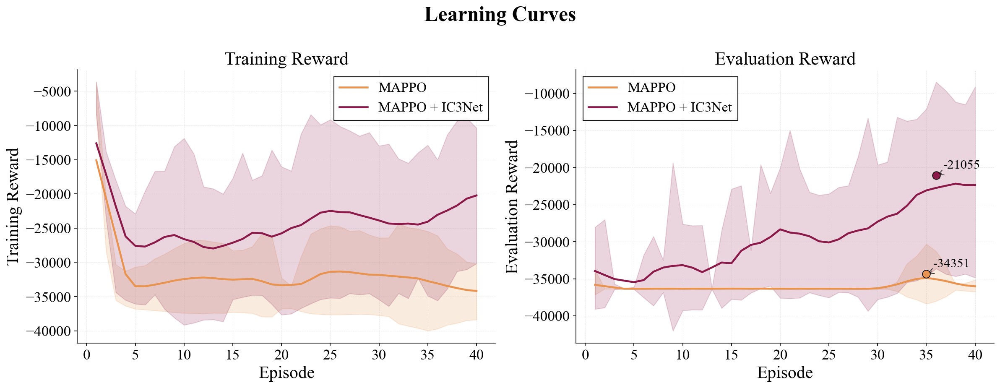

In [10]:
# ============================================================
# FIGURE 3: Learning Curves (coloured, multi-seed with mean ± std band)
# ============================================================
TITLE_FS, AXLABEL_FS, TICK_FS, LEGEND_FS, ANNOT_FS = 24, 20, 17, 16, 15

if reward_curves:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    fig.suptitle("Learning Curves", fontweight="bold", y=1.02, fontsize=TITLE_FS)

    for name, curves in reward_curves.items():
        s = styles.get(name, {"color": "#333"})
        label = method_label(name)

        # ── Training rewards ──
        train_runs = curves["train"]  # list of lists
        if train_runs:
            # Pad to same length (different runs may have different episode counts)
            max_len = max(len(r) for r in train_runs)
            padded = np.full((len(train_runs), max_len), np.nan)
            for i, r in enumerate(train_runs):
                padded[i, :len(r)] = r
            mean_train = np.nanmean(padded, axis=0)
            std_train = np.nanstd(padded, axis=0)
            eps = np.arange(1, max_len + 1)

            if len(train_runs) > 1:
                ax1.fill_between(eps, mean_train - std_train, mean_train + std_train,
                                 alpha=0.18, color=s["color"])
            ax1.plot(eps, smooth(mean_train, SMOOTH_WINDOW),
                     color=s["color"], linewidth=2.2, linestyle="-", label=label)

        # ── Eval rewards ──
        eval_runs = curves["eval"]
        if eval_runs:
            max_len = max(len(r) for r in eval_runs)
            padded = np.full((len(eval_runs), max_len), np.nan)
            for i, r in enumerate(eval_runs):
                padded[i, :len(r)] = r
            mean_eval = np.nanmean(padded, axis=0)
            std_eval = np.nanstd(padded, axis=0)
            eps = np.arange(1, max_len + 1)

            if len(eval_runs) > 1:
                ax2.fill_between(eps, mean_eval - std_eval, mean_eval + std_eval,
                                 alpha=0.18, color=s["color"])
            ax2.plot(eps, smooth(mean_eval, SMOOTH_WINDOW),
                     color=s["color"], linewidth=2.2, linestyle="-", label=label)

            # Best point (on the mean curve)
            best_idx = int(np.nanargmax(mean_eval))
            ax2.scatter(best_idx + 1, mean_eval[best_idx], color=s["color"],
                        s=80, zorder=5, edgecolors="black", linewidth=0.8, marker="o")
            ax2.annotate(f"{mean_eval[best_idx]:.0f}",
                         (best_idx + 1, mean_eval[best_idx]),
                         textcoords="offset points", xytext=(8, 8), fontsize=ANNOT_FS,
                         arrowprops=dict(arrowstyle="->", color="black", lw=0.7))

    for ax, ttl, ylab in [(ax1, "Training Reward", "Training Reward"),
                           (ax2, "Evaluation Reward", "Evaluation Reward")]:
        ax.set_xlabel("Episode", fontsize=AXLABEL_FS)
        ax.set_ylabel(ylab, fontsize=AXLABEL_FS)
        ax.set_title(ttl, fontsize=AXLABEL_FS + 1)
        ax.tick_params(axis="both", labelsize=TICK_FS)
        ax.legend(loc="best", framealpha=0.9, edgecolor="black",
                  fancybox=False, fontsize=LEGEND_FS)

    plt.tight_layout()
    plt.savefig("learning_curves.pdf", bbox_inches="tight")
    plt.show()
else:
    print("No training curves to plot.")


In [11]:
# ============================================================
# COMPUTE LEARNING EFFICIENCY METRICS — multi-seed
# Formalisation matches the definitions in Section 7.2.2:
#   - Convergence speed: per-seed sliding-window CV (w=10, tau=0.10)
#   - Sample efficiency (AULC): simple mean reward over training, per seed
#   - Training stability: CV ACROSS seeds of final mean reward (last k episodes)
# ============================================================
W_WINDOW = 10              # sliding window size for convergence detection
TAU_CONV = 0.10            # CV threshold for convergence
K_FINAL = 5                # number of final episodes for run-final reward

learning_metrics = {}

for name, curves in reward_curves.items():
    m = {}
    eval_runs = curves["eval"]
    train_runs = curves["train"]

    if not eval_runs:
        learning_metrics[name] = m
        continue

    # ── Convergence speed (per seed, then aggregate) ──────────
    # e* = min { e | sigma(r_{e-w+1:e}) / |mu(r_{e-w+1:e})| < tau }
    conv_per_seed = []
    for run_eval in eval_runs:
        r = np.array(run_eval)
        if len(r) < W_WINDOW:
            conv_per_seed.append(None)
            continue
        e_star = None
        for e in range(W_WINDOW, len(r) + 1):
            segment = r[e - W_WINDOW:e]
            mean_val = np.mean(segment)
            if mean_val == 0:
                continue
            cv = np.std(segment) / abs(mean_val)
            if cv < TAU_CONV:
                e_star = e
                break
        conv_per_seed.append(e_star)

    valid_conv = [e for e in conv_per_seed if e is not None]
    m["convergence_per_seed"] = conv_per_seed
    m["convergence_mean"] = float(np.mean(valid_conv)) if valid_conv else None
    m["convergence_std"] = float(np.std(valid_conv)) if len(valid_conv) >= 2 else None
    m["n_converged"] = len(valid_conv)
    m["n_seeds"] = len(eval_runs)

    # ── Sample efficiency (AULC, simple mean) per seed ────────
    # AULC = (1/E) sum_{e=1}^E r_e
    aulc_per_seed = []
    for run_eval in eval_runs:
        r = np.array(run_eval)
        if len(r) > 0:
            aulc_per_seed.append(float(np.mean(r)))
    m["aulc_per_seed"] = aulc_per_seed
    m["aulc_mean"] = float(np.mean(aulc_per_seed)) if aulc_per_seed else np.nan
    m["aulc_std"] = float(np.std(aulc_per_seed)) if len(aulc_per_seed) >= 2 else 0.0

    # ── Training stability (CV across seeds of final reward) ──
    # r_final^(s) = mean of last K eval episodes of run s
    # CV_final = sigma_s(r_final^(s)) / |mu_s(r_final^(s))|
    final_per_seed = []
    for run_eval in eval_runs:
        r = np.array(run_eval)
        if len(r) == 0:
            continue
        tail = r[-K_FINAL:] if len(r) >= K_FINAL else r
        final_per_seed.append(float(np.mean(tail)))

    if final_per_seed:
        fp = np.array(final_per_seed)
        mean_final = np.mean(fp)
        m["final_per_seed"] = final_per_seed
        m["final_mean"] = float(mean_final)
        m["final_std"] = float(np.std(fp))
        m["cv_final"] = float(np.std(fp) / abs(mean_final)) if mean_final != 0 else np.nan
    else:
        m["final_mean"] = np.nan
        m["final_std"] = np.nan
        m["cv_final"] = np.nan

    # Best single-episode reward across all seeds
    all_eval = np.concatenate([np.array(r) for r in eval_runs])
    m["best_eval_reward"] = float(all_eval.max()) if len(all_eval) > 0 else np.nan
    m["total_train_episodes"] = sum(len(r) for r in train_runs)

    learning_metrics[name] = m

# ── Display table ─────────────────────────────────────────────
if learning_metrics:
    rows = []
    for name, m in learning_metrics.items():
        if not m:
            continue
        conv_str = "—"
        if m.get("convergence_mean") is not None:
            if m.get("convergence_std") is not None:
                conv_str = f"{m['convergence_mean']:.1f} ± {m['convergence_std']:.1f}"
            else:
                conv_str = f"{m['convergence_mean']:.1f}"
            conv_str += f"  ({m['n_converged']}/{m['n_seeds']})"
        else:
            conv_str = f"—  (0/{m.get('n_seeds', 0)})"

        rows.append({
            "Method": method_label(name),
            "Seeds": m.get("n_seeds", 0),
            f"Convergence $e^*$ (w={W_WINDOW}, τ={TAU_CONV})": conv_str,
            "AULC (mean reward)": (
                f"{m['aulc_mean']:.1f} ± {m['aulc_std']:.1f}"
                if not np.isnan(m.get("aulc_mean", np.nan)) else "—"
            ),
            f"Final reward (last {K_FINAL} ep)": (
                f"{m['final_mean']:.1f} ± {m['final_std']:.1f}"
                if not np.isnan(m.get("final_mean", np.nan)) else "—"
            ),
            "$CV_{final}$ (across seeds)": (
                f"{m['cv_final']:.3f}"
                if not np.isnan(m.get("cv_final", np.nan)) else "—"
            ),
            "Best reward": (
                f"{m['best_eval_reward']:.1f}"
                if not np.isnan(m.get("best_eval_reward", np.nan)) else "—"
            ),
        })

    print(f"\n{'='*120}")
    print(f"  Table 2: Learning Efficiency Metrics (§7.2.2 formalisation)")
    print(f"  Convergence e* = smallest episode where sliding-window CV < τ (per seed, aggregated as mean ± std)")
    print(f"  AULC = (1/E) Σ r_e per seed, reported mean ± std across seeds")
    print(f"  CV_final = coefficient of variation of r_final across seeds (lower = more reproducible)")
    print(f"{'='*120}")
    display(pd.DataFrame(rows).set_index("Method"))
else:
    print("No learning metrics (no trainable methods found).")



  Table 2: Learning Efficiency Metrics (§7.2.2 formalisation)
  Convergence e* = smallest episode where sliding-window CV < τ (per seed, aggregated as mean ± std)
  AULC = (1/E) Σ r_e per seed, reported mean ± std across seeds
  CV_final = coefficient of variation of r_final across seeds (lower = more reproducible)


,Seeds,"Convergence $e^*$ (w=10, τ=0.1)",AULC (mean reward),Final reward (last 5 ep),$CV_{final}$ (across seeds),Best reward
Method,,,,,,
MAPPO,5,10.0 ± 0.0 (5/5),-36114.1 ± 423.6,-35633.9 ± 1434.0,0.040,-26280.4
MAPPO + IC3Net,5,10.0 ± 0.0 (4/5),-29658.5 ± 6410.8,-22183.9 ± 12093.8,0.545,-1897.2


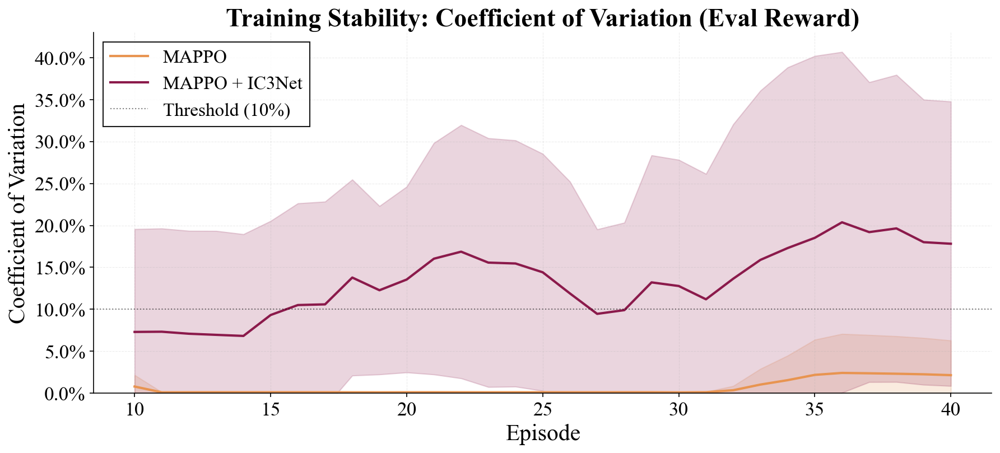

In [12]:
# ============================================================
# FIGURE 4: Training Stability — Coefficient of Variation
# Multi-seed: mean CV curve with ± std band across runs
# ============================================================
TITLE_FS, AXLABEL_FS, TICK_FS, LEGEND_FS = 22, 20, 17, 16

if reward_curves:
    fig, ax = plt.subplots(figsize=(12, 5.5))
    ax.set_title("Training Stability: Coefficient of Variation (Eval Reward)",
                 fontweight="bold", fontsize=TITLE_FS)

    for name, curves in reward_curves.items():
        eval_runs = curves["eval"]
        if not eval_runs:
            continue

        s = styles.get(name, {"color": "#333"})

        # Compute CV curve per run, then average
        cv_per_run = []
        for run_eval in eval_runs:
            eval_r = np.array(run_eval)
            if len(eval_r) < 4:
                continue
            window = min(10, len(eval_r) // 2)
            cvs = []
            for i in range(window, len(eval_r) + 1):
                segment = eval_r[i - window:i]
                mean_val = np.mean(segment)
                cv = np.std(segment) / abs(mean_val) if mean_val != 0 else 0
                cvs.append(cv)
            cv_per_run.append(cvs)

        if not cv_per_run:
            continue

        # Pad to same length
        max_len = max(len(c) for c in cv_per_run)
        padded = np.full((len(cv_per_run), max_len), np.nan)
        for i, c in enumerate(cv_per_run):
            padded[i, :len(c)] = c
        mean_cv = np.nanmean(padded, axis=0)
        std_cv = np.nanstd(padded, axis=0)

        # Use the window size from first run for x-axis
        window = min(10, len(eval_runs[0]) // 2)
        eps = np.arange(window, window + max_len)

        if len(cv_per_run) > 1:
            ax.fill_between(eps, mean_cv - std_cv, mean_cv + std_cv,
                            alpha=0.18, color=s["color"])
        ax.plot(eps, mean_cv, color=s["color"], linewidth=2.0, linestyle="-",
                label=method_label(name))

    ax.axhline(y=CONVERGENCE_CV_THRESHOLD, color="black", linestyle=":", alpha=0.5, linewidth=1,
               label=f"Threshold ({CONVERGENCE_CV_THRESHOLD:.0%})")
    ax.set_xlabel("Episode", fontsize=AXLABEL_FS)
    ax.set_ylabel("Coefficient of Variation", fontsize=AXLABEL_FS)
    ax.tick_params(axis="both", labelsize=TICK_FS)
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))
    ax.legend(loc="best", framealpha=0.9, edgecolor="black",
              fancybox=False, fontsize=LEGEND_FS)
    ax.set_ylim(bottom=0)

    plt.tight_layout()
    plt.savefig("training_stability.pdf", bbox_inches="tight")
    plt.show()


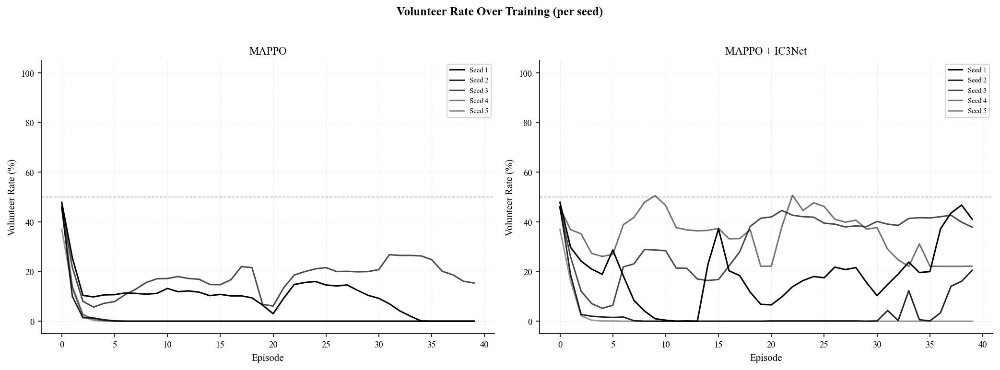

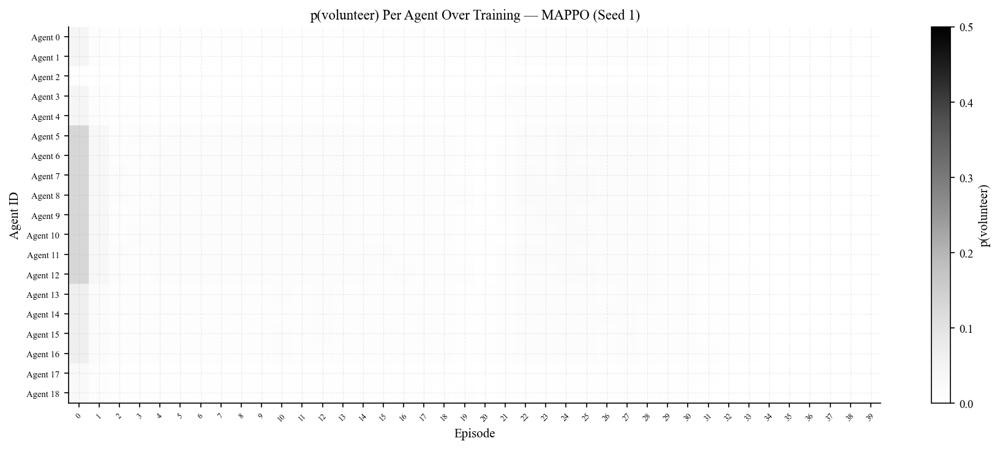

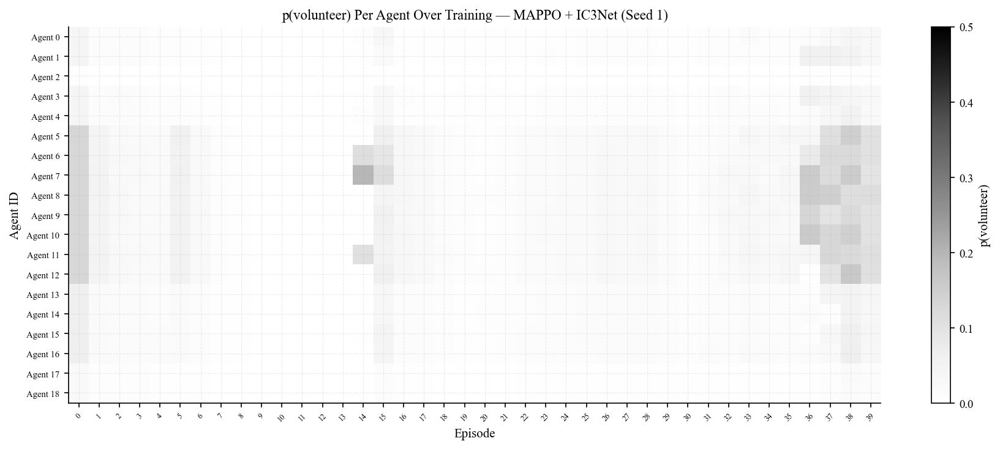

In [13]:
# ============================================================
# FIGURE: Volunteer Rate Over Training (per seed)
# Shows when each seed discovers volunteering
# ============================================================

def load_episode_summaries(experiment_dirs):
    """Parse episode summary.txt files for volunteer rate and p(volunteer).
    Returns: {method -> {run_idx -> [{ep, vol_rate, avg_p_vol, per_agent_p}, ...]}}
    """
    data = defaultdict(lambda: defaultdict(list))
    
    for run_idx, exp_dir in enumerate(experiment_dirs):
        if not os.path.isdir(exp_dir):
            continue
        for method_name in sorted(os.listdir(exp_dir)):
            method_dir = os.path.join(exp_dir, method_name)
            if not os.path.isdir(method_dir) or method_name in ("logs", "configs", ".tmp_configs"):
                continue
            episodes_dir = os.path.join(method_dir, "episodes")
            if not os.path.isdir(episodes_dir):
                continue
            for ep_name in sorted(os.listdir(episodes_dir)):
                ep_dir = os.path.join(episodes_dir, ep_name)
                summary_path = os.path.join(ep_dir, "summary.txt")
                if not os.path.exists(summary_path):
                    continue
                ep_num = int(ep_name.replace("episode_", "")) if ep_name.startswith("episode_") else -1
                with open(summary_path) as f:
                    text = f.read()
                info = {"episode": ep_num, "vol_rate": None, "avg_p_vol": None, "per_agent_p": {},
                                "entropy_coef": None, "critic_loss": None, "gate_rate": None}
                for line in text.splitlines():
                    m = re.match(r"Volunteer Rate:\s*([\d.]+)%", line)
                    if m:
                        info["vol_rate"] = float(m.group(1))
                    m = re.match(r"Avg p\(volunteer\):\s*([\d.]+)", line)
                    if m:
                        info["avg_p_vol"] = float(m.group(1))
                    m = re.match(r"\s+Agent (\d+):\s*([\d.]+)", line)
                    if m:
                        info["per_agent_p"][int(m.group(1))] = float(m.group(2))
                data[method_name][run_idx].append(info)
    
    # Sort by episode number
    for method in data:
        for run_idx in data[method]:
            data[method][run_idx].sort(key=lambda x: x["episode"])
    
    return data

episode_summaries = load_episode_summaries(RESOLVED_DIRS)

if episode_summaries:
    # Filter to trainable methods only (not baselines)
    trainable = {k: v for k, v in episode_summaries.items() if "baseline" not in k.lower()}
    
    if trainable:
        import math
        n_methods = len(trainable)
        n_cols = min(n_methods, 2)
        n_rows = math.ceil(n_methods / 2)
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows), squeeze=False)
        for ax in axes.flat[n_methods:]:
            ax.set_visible(False)
        fig.suptitle("Volunteer Rate Over Training (per seed)", fontweight="bold", y=1.02)
        
        for idx, (name, runs) in enumerate(trainable.items()):
            ax = axes.flat[idx]
            s = styles.get(name, {"color": "#000", "linestyle": "-"})
            
            for run_idx, ep_list in sorted(runs.items()):
                eps = [e["episode"] for e in ep_list if e["vol_rate"] is not None]
                rates = [e["vol_rate"] for e in ep_list if e["vol_rate"] is not None]
                if eps:
                    seed_label = f"Seed {run_idx+1}"
                    shade = max(0.3, 1.0 - run_idx * 0.15)
                    ax.plot(eps, rates, linewidth=1.5, alpha=shade, label=seed_label)
            
            ax.set_xlabel("Episode")
            ax.set_ylabel("Volunteer Rate (%)")
            ax.set_title(method_label(name))
            ax.legend(fontsize=7, loc="best")
            ax.set_ylim(-5, 105)
            ax.axhline(50, color="black", linestyle="--", alpha=0.3, linewidth=0.8)
        
        plt.tight_layout()
        plt.savefig("volunteer_rate_over_training.pdf", bbox_inches="tight")
        plt.show()
        
        # Also plot avg p(volunteer) per agent over training (heatmap-style)
        for name, runs in trainable.items():
            # Use first run for detailed per-agent view
            if 0 not in runs or not runs[0]:
                continue
            ep_list = runs[0]
            eps_with_agents = [e for e in ep_list if e["per_agent_p"]]
            if not eps_with_agents:
                continue
            
            agent_ids = sorted(eps_with_agents[0]["per_agent_p"].keys())
            matrix = np.zeros((len(agent_ids), len(eps_with_agents)))
            for j, e in enumerate(eps_with_agents):
                for i, aid in enumerate(agent_ids):
                    matrix[i, j] = e["per_agent_p"].get(aid, 0.0)
            
            fig, ax = plt.subplots(figsize=(12, 5))
            im = ax.imshow(matrix, aspect="auto", cmap="Greys", vmin=0, vmax=max(0.5, matrix.max()))
            ax.set_xlabel("Episode")
            ax.set_ylabel("Agent ID")
            ax.set_title(f"p(volunteer) Per Agent Over Training — {method_label(name)} (Seed 1)")
            ax.set_xticks(range(len(eps_with_agents)))
            ax.set_xticklabels([e["episode"] for e in eps_with_agents], fontsize=6, rotation=45)
            ax.set_yticks(range(len(agent_ids)))
            ax.set_yticklabels([f"Agent {a}" for a in agent_ids], fontsize=7)
            plt.colorbar(im, ax=ax, label="p(volunteer)")
            plt.tight_layout()
            plt.savefig(f"p_volunteer_heatmap_{name}.pdf", bbox_inches="tight")
            plt.show()
else:
    print("No episode summaries found.")

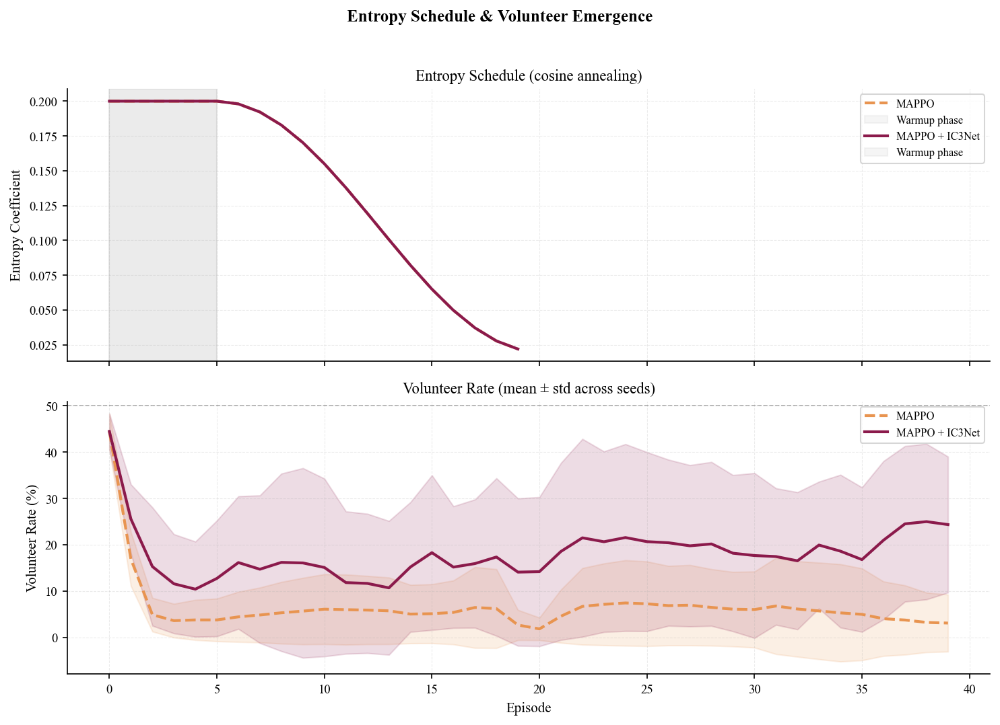

In [14]:
# ============================================================
# FIGURE: Entropy Coefficient Schedule Over Training
# Computed from config (deterministic cosine annealing)
# ============================================================

def compute_entropy_schedule(config_path):
    """Compute the entropy coefficient schedule from a config YAML."""
    import yaml
    with open(config_path) as f:
        cfg = yaml.safe_load(f)
    hp = cfg.get("hyperparameters", {})
    tr = cfg.get("training", {})
    
    entropy_start = hp.get("entropy_coef", 0.05)
    entropy_min = hp.get("entropy_coef_min", 0.03)
    warmup_frac = hp.get("warmup_frac", 0.0)
    n_episodes = tr.get("n_episodes", 100)
    
    schedule = []
    for ep in range(n_episodes):
        progress = ep / n_episodes
        if progress < warmup_frac:
            coef = entropy_start
        else:
            decay_progress = (progress - warmup_frac) / (1.0 - warmup_frac)
            coef = entropy_min + 0.5 * (entropy_start - entropy_min) * (1.0 + np.cos(np.pi * decay_progress))
        schedule.append(coef)
    
    return schedule, {"start": entropy_start, "min": entropy_min, "warmup_frac": warmup_frac, "n_episodes": n_episodes}

# Find config files for trainable methods
entropy_schedules = {}
for exp_dir in RESOLVED_DIRS[:1]:  # Same config across seeds
    for method_name in sorted(os.listdir(exp_dir)):
        if "baseline" in method_name.lower():
            continue
        method_dir = os.path.join(exp_dir, method_name)
        config_path = os.path.join(method_dir, "config.yaml")
        if os.path.exists(config_path):
            schedule, params = compute_entropy_schedule(config_path)
            entropy_schedules[method_name] = (schedule, params)

if entropy_schedules:
    # Combined plot: entropy schedule + volunteer rate
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 7), sharex=True)
    fig.suptitle("Entropy Schedule & Volunteer Emergence", fontweight="bold", y=1.02)
    
    for name, (schedule, params) in entropy_schedules.items():
        s = styles.get(name, {"color": "#000", "linestyle": "-"})
        eps = np.arange(len(schedule))
        ax1.plot(eps, schedule, color=s["color"], linestyle=s["linestyle"],
                 linewidth=2, label=method_label(name))
        
        # Shade warmup region
        warmup_end = int(params["warmup_frac"] * params["n_episodes"])
        if warmup_end > 0:
            ax1.axvspan(0, warmup_end, alpha=0.08, color="gray", label="Warmup phase")
    
    ax1.set_ylabel("Entropy Coefficient")
    ax1.set_title("Entropy Schedule (cosine annealing)")
    ax1.legend(fontsize=8)
    
    # Volunteer rate (mean across seeds) on second axis
    if episode_summaries:
        trainable = {k: v for k, v in episode_summaries.items() if "baseline" not in k.lower()}
        for name, runs in trainable.items():
            s = styles.get(name, {"color": "#000", "linestyle": "-"})
            # Collect all runs
            all_eps, all_rates = [], []
            max_ep = 0
            for run_idx, ep_list in runs.items():
                for e in ep_list:
                    if e["vol_rate"] is not None:
                        all_eps.append(e["episode"])
                        max_ep = max(max_ep, e["episode"])
            
            # Mean per episode across seeds
            if max_ep > 0:
                ep_rates = defaultdict(list)
                for run_idx, ep_list in runs.items():
                    for e in ep_list:
                        if e["vol_rate"] is not None:
                            ep_rates[e["episode"]].append(e["vol_rate"])
                
                sorted_eps = sorted(ep_rates.keys())
                mean_rates = [np.mean(ep_rates[ep]) for ep in sorted_eps]
                std_rates = [np.std(ep_rates[ep]) for ep in sorted_eps]
                
                ax2.plot(sorted_eps, mean_rates, color=s["color"], linestyle=s["linestyle"],
                         linewidth=2, label=method_label(name))
                if len(runs) > 1:
                    ax2.fill_between(sorted_eps,
                                     [m - s for m, s in zip(mean_rates, std_rates)],
                                     [m + s for m, s in zip(mean_rates, std_rates)],
                                     alpha=0.15, color=s["color"])
    
    ax2.set_xlabel("Episode")
    ax2.set_ylabel("Volunteer Rate (%)")
    ax2.set_title("Volunteer Rate (mean ± std across seeds)")
    ax2.legend(fontsize=8)
    ax2.axhline(50, color="black", linestyle="--", alpha=0.3, linewidth=0.8)
    
    plt.tight_layout()
    plt.savefig("entropy_volunteer_combined.pdf", bbox_inches="tight")
    plt.show()
else:
    print("No config files found for entropy schedule computation.")

### Not yet available (requires code changes + re-run)

- **Loss curves** (actor + critic): Loss values are printed during training but not saved to files. Needs logging addition to `trainer.py`.
- **Gate activation rate**: IC3Net gate decisions (`_last_gate_actions`) are computed but not persisted. Needs logging addition to `trainer.py` and `communication.py`.

---
## 8.2 Baseline Comparison

**Research question:** How do learned policies compare to heuristic baselines?

**Metrics:** cycle time, waiting time, processing time, utilisation, throughput, flow efficiency, queue length, overload ratio, workload CV, volunteer ratio.

**Expected conclusion:** Shortest Queue is the strongest baseline. MAPPO+IC3Net approaches it and outperforms Random and plain MAPPO. Best Median fails due to bottleneck effect.

In [15]:
# ============================================================
# TABLE 1: Process Performance Summary
# ============================================================
time_label = f"working hours ({WORK_START_HOUR:02d}:00-{WORK_END_HOUR:02d}:00)" if USE_WORKING_TIME else "calendar time"

rows = []
for name, ep_metrics in process_metrics.items():
    vals = {k: [m[k] for m in ep_metrics if not np.isnan(m.get(k, np.nan))]
            for k in ["avg_cycle_time_min", "avg_waiting_time_min", "avg_processing_time_min",
                       "resource_utilization", "case_throughput_per_hour", "flow_efficiency"]}
    row = {"Method": method_label(name)}
    for k, v in vals.items():
        if v:
            row[k + " (mean)"] = np.mean(v)
            row[k + " (std)"] = np.std(v)
        else:
            row[k + " (mean)"] = np.nan
            row[k + " (std)"] = np.nan
    row["n_episodes"] = len(ep_metrics)
    rows.append(row)

df_process = pd.DataFrame(rows).set_index("Method")

# Display a clean summary table
summary_cols = {
    "Cycle Time (min)": ("avg_cycle_time_min (mean)", "avg_cycle_time_min (std)"),
    "Waiting Time (min)": ("avg_waiting_time_min (mean)", "avg_waiting_time_min (std)"),
    "Processing Time (min)": ("avg_processing_time_min (mean)", "avg_processing_time_min (std)"),
    "Utilization": ("resource_utilization (mean)", "resource_utilization (std)"),
    "Throughput (/hr)": ("case_throughput_per_hour (mean)", "case_throughput_per_hour (std)"),
    "Flow Efficiency": ("flow_efficiency (mean)", "flow_efficiency (std)"),
}

display_rows = []
for method in df_process.index:
    r = {"Method": method}
    for label, (mean_col, std_col) in summary_cols.items():
        m = df_process.loc[method, mean_col]
        s = df_process.loc[method, std_col]
        if pd.notna(m):
            if "Utilization" in label or "Efficiency" in label:
                r[label] = f"{m:.1%} \u00b1 {s:.1%}"
            elif "Throughput" in label:
                r[label] = f"{m:.1f} \u00b1 {s:.1f}"
            else:
                r[label] = f"{m:.1f} \u00b1 {s:.1f}"
        else:
            r[label] = "—"
    r["Episodes"] = int(df_process.loc[method, "n_episodes"])
    display_rows.append(r)

df_display = pd.DataFrame(display_rows).set_index("Method")
print(f"\n{'='*90}")
print(f"  Table 1: Process Performance Metrics ({time_label})")
print(f"{'='*90}")
display(df_display)


  Table 1: Process Performance Metrics (working hours (07:00-15:00))


,Cycle Time (min),Waiting Time (min),Processing Time (min),Utilization,Throughput (/hr),Flow Efficiency,Episodes
Method,,,,,,,
MAPPO + IC3Net,641.8 ± 96.5,64.2 ± 15.0,42.3 ± 2.0,9.1% ± 0.5%,1.2 ± 0.0,57.3% ± 5.4%,50
MAPPO,718.7 ± 178.6,77.2 ± 28.4,42.5 ± 1.7,9.1% ± 0.6%,1.2 ± 0.0,52.7% ± 7.7%,50
Random,657.6 ± 77.8,67.5 ± 11.6,42.6 ± 1.6,9.2% ± 0.6%,1.2 ± 0.0,56.2% ± 4.5%,50
Best Median,4247.7 ± 667.3,804.9 ± 123.5,45.1 ± 1.9,11.5% ± 0.7%,0.8 ± 0.1,12.9% ± 2.1%,50
Shortest Queue,360.0 ± 35.1,18.2 ± 4.8,42.1 ± 2.0,9.2% ± 0.5%,1.3 ± 0.0,94.7% ± 4.9%,50


In [16]:
# ============================================================
# TABLE 1d: Per-Seed Performance Breakdown
# Drills down on Table 1 by reporting eval reward, waiting time,
# volunteer ratio and cycle time for every seed × method, so that
# under-performing or collapsed seeds become visible (e.g. for the
# F.6.1 analysis of the failed seed).
# ============================================================
def _seed_label(path):
    return os.path.basename(path)

seed_labels_per_run = [_seed_label(d) for d in RESOLVED_DIRS]

per_seed_rows = []
for name in methods.keys():
    proc_eps = process_metrics.get(name, [])
    op_eps = operational_metrics.get(name, [])
    rmap = run_map.get(name, [])
    if not rmap:
        continue

    # Group episode indices by run_idx (one run = one seed)
    by_seed = defaultdict(list)
    for ep_idx, (run_idx, _) in enumerate(rmap):
        by_seed[run_idx].append(ep_idx)

    # Eval reward per seed: mean over the last 5 evaluation episodes
    eval_rew_per_seed = {}
    rc = reward_curves.get(name, {"eval": []}) if reward_curves else {"eval": []}
    for run_idx, eval_list in enumerate(rc.get("eval", [])):
        if eval_list:
            tail = eval_list[-5:] if len(eval_list) >= 5 else eval_list
            eval_rew_per_seed[run_idx] = float(np.mean(tail))

    for run_idx in range(len(RESOLVED_DIRS)):
        ep_indices = by_seed.get(run_idx, [])
        if not ep_indices:
            continue
        wait_vals = [proc_eps[i].get("avg_waiting_time_min", np.nan)
                     for i in ep_indices if i < len(proc_eps)]
        cycle_vals = [proc_eps[i].get("avg_cycle_time_min", np.nan)
                      for i in ep_indices if i < len(proc_eps)]
        vol_vals = [op_eps[i].get("volunteer_ratio", np.nan)
                    for i in ep_indices if i < len(op_eps)]

        per_seed_rows.append({
            "Method": method_label(name),
            "Seed": seed_labels_per_run[run_idx],
            "Eval Reward": eval_rew_per_seed.get(run_idx, np.nan),
            "Waiting Time (min)": np.nanmean(wait_vals) if wait_vals else np.nan,
            "Volunteer Ratio": np.nanmean(vol_vals) if vol_vals else np.nan,
            "Cycle Time (min)": np.nanmean(cycle_vals) if cycle_vals else np.nan,
            "Episodes": len(ep_indices),
        })

per_seed_df = pd.DataFrame(per_seed_rows)

print(f"\n{'='*90}")
print(f"  Table 1d: Per-Seed Performance Breakdown ({time_label})")
print(f"{'='*90}")

# Per-method blocks: one 5-row table per method
def _fmt_seed_table(sub):
    out = sub.drop(columns=["Method"]).copy()
    out["Eval Reward"] = out["Eval Reward"].map(
        lambda x: f"{x:.2f}" if pd.notna(x) else "—"
    )
    out["Waiting Time (min)"] = out["Waiting Time (min)"].map(
        lambda x: f"{x:.1f}" if pd.notna(x) else "—"
    )
    out["Volunteer Ratio"] = out["Volunteer Ratio"].map(
        lambda x: f"{x:.1%}" if pd.notna(x) else "—"
    )
    out["Cycle Time (min)"] = out["Cycle Time (min)"].map(
        lambda x: f"{x:.1f}" if pd.notna(x) else "—"
    )
    return out

for method_name in per_seed_df["Method"].unique():
    sub = per_seed_df[per_seed_df["Method"] == method_name].sort_values("Seed").reset_index(drop=True)
    print(f"\n{method_name}")
    print("-" * 90)
    print(_fmt_seed_table(sub).to_string(index=False))

# Combined wide-format display: methods × seeds matrix per metric
print(f"\n{'='*90}")
print("  Combined view: per-seed values across methods")
print(f"{'='*90}")
display(
    per_seed_df.set_index(["Method", "Seed"])[
        ["Eval Reward", "Waiting Time (min)", "Volunteer Ratio", "Cycle Time (min)"]
    ].style.format({
        "Eval Reward": "{:.2f}",
        "Waiting Time (min)": "{:.1f}",
        "Volunteer Ratio": "{:.1%}",
        "Cycle Time (min)": "{:.1f}",
    })
)



  Table 1d: Per-Seed Performance Breakdown (working hours (07:00-15:00))

MAPPO + IC3Net
------------------------------------------------------------------------------------------
    Seed Eval Reward Waiting Time (min) Volunteer Ratio Cycle Time (min)  Episodes
FINAL_36   -36361.55               66.1            0.0%            655.1        10
FINAL_41   -36296.52               59.7            1.7%            611.8        10
FINAL_42   -10899.23               64.3           50.3%            642.3        10
FINAL_53    -8241.09               68.7           99.9%            660.9        10
FINAL_73   -19120.93               62.1           77.8%            638.9        10

MAPPO
------------------------------------------------------------------------------------------
    Seed Eval Reward Waiting Time (min) Volunteer Ratio Cycle Time (min)  Episodes
FINAL_36   -36350.21               65.7            0.0%            636.3        10
FINAL_41   -36347.65               66.0            0.2%  

In [17]:
# ============================================================
# TABLE 1e: Train vs Test Comparison — multi-seed
# Loads training-phase logs (in addition to final_eval) and
# compares the key process metrics between training and test.
# Useful to see whether the eval-time numbers match what the
# policy produced during training.
# ============================================================

# ── Load training data across all seeds ─────────────────────────
train_methods_multi, train_run_map = discover_methods_multi(RESOLVED_DIRS, log_type="train")

train_all_data = {}  # method -> list[DataFrame]  (pooled across seeds)
for name, csv_files in train_methods_multi.items():
    eps = load_episode_data(csv_files)
    if eps:
        train_all_data[name] = eps

# Also keep a per-seed view of training episodes so we can take the
# last N per seed (not the last N of the pooled list).
train_by_seed = {}  # method -> {run_idx: [csv_path, ...]}
for name, pairs in train_run_map.items():
    d = defaultdict(list)
    for run_idx, path in pairs:
        d[run_idx].append(path)
    train_by_seed[name] = d

# ── Compute lightweight process metrics for train episodes ──────
def _train_episode_metrics(ep):
    m = {}
    if ep.empty:
        return m
    if "task_assigned_time" in ep.columns and "task_started_time" in ep.columns:
        waits = ep.apply(
            lambda r: calc_minutes_between(r["task_assigned_time"], r["task_started_time"]),
            axis=1,
        )
        m["avg_waiting_time_min"] = waits.mean()
    if "case_open_time" in ep.columns and "case_completed_time" in ep.columns:
        cases = (
            ep.groupby("case_id")
            .agg(open_time=("case_open_time", "min"),
                 close_time=("case_completed_time", "max"))
            .dropna()
        )
        if len(cases) > 0:
            cycles = cases.apply(
                lambda r: calc_minutes_between(r["open_time"], r["close_time"]),
                axis=1,
            )
            m["avg_cycle_time_min"] = cycles.mean()
    if "task_started_time" in ep.columns and "task_completed_time" in ep.columns:
        procs = ep.apply(
            lambda r: calc_minutes_between(r["task_started_time"], r["task_completed_time"]),
            axis=1,
        )
        m["avg_processing_time_min"] = procs.mean()
    return m

# For each method, take the last 5 training episodes PER seed and
# compute metrics from those.
TRAIN_TAIL = 5
train_process_metrics = {}  # method -> list[dict] pooled across seeds
for name, seed_map in train_by_seed.items():
    pooled = []
    for run_idx, paths in seed_map.items():
        # paths are sorted by discover_methods (glob sorted), so tail = last N episodes
        tail_paths = paths[-TRAIN_TAIL:] if len(paths) >= TRAIN_TAIL else paths
        tail_eps = load_episode_data(tail_paths)
        for ep in tail_eps:
            metrics = _train_episode_metrics(ep)
            if metrics:
                pooled.append(metrics)
    if pooled:
        train_process_metrics[name] = pooled

# ── Build the comparison table ──────────────────────────────────
metrics_to_compare = [
    ("Cycle Time (min)",     "avg_cycle_time_min"),
    ("Waiting Time (min)",   "avg_waiting_time_min"),
    ("Processing Time (min)", "avg_processing_time_min"),
]

comparison_rows = []
all_method_names = sorted(set(list(process_metrics.keys()) + list(train_process_metrics.keys())))
for name in all_method_names:
    row = {"Method": method_label(name)}
    test_eps = process_metrics.get(name, [])
    train_eps = train_process_metrics.get(name, [])

    for label, key in metrics_to_compare:
        train_vals = [m[key] for m in train_eps if key in m and not np.isnan(m[key])]
        if train_vals:
            row[f"{label} Train"] = f"{np.mean(train_vals):.1f} \u00b1 {np.std(train_vals):.1f}"
        else:
            row[f"{label} Train"] = "—"

        test_vals = [m[key] for m in test_eps if key in m and not np.isnan(m.get(key, np.nan))]
        if test_vals:
            row[f"{label} Test"] = f"{np.mean(test_vals):.1f} \u00b1 {np.std(test_vals):.1f}"
        else:
            row[f"{label} Test"] = "—"

    row["N Train"] = len(train_eps)
    row["N Test"] = len(test_eps)
    comparison_rows.append(row)

df_comparison = pd.DataFrame(comparison_rows).set_index("Method")

ordered_cols = []
for label, _ in metrics_to_compare:
    ordered_cols.append(f"{label} Train")
    ordered_cols.append(f"{label} Test")
ordered_cols += ["N Train", "N Test"]
df_comparison = df_comparison[ordered_cols]

print(f"\n{'='*120}")
print(f"  Table 1e: Train vs Test Performance Comparison ({time_label})")
print(f"  Train = last {TRAIN_TAIL} training episodes per seed | "
      f"Test = final_eval episodes | pooled across {len(RESOLVED_DIRS)} seeds")
print(f"{'='*120}")
display(df_comparison)



  Table 1e: Train vs Test Performance Comparison (working hours (07:00-15:00))
  Train = last 5 training episodes per seed | Test = final_eval episodes | pooled across 5 seeds


,Cycle Time (min) Train,Cycle Time (min) Test,Waiting Time (min) Train,Waiting Time (min) Test,Processing Time (min) Train,Processing Time (min) Test,N Train,N Test
Method,,,,,,,,
Best Median,15656.5 ± 1725.2,4247.7 ± 667.3,2995.1 ± 217.9,804.9 ± 123.5,44.6 ± 0.8,45.1 ± 1.9,25,50
Random,707.0 ± 58.8,657.6 ± 77.8,73.2 ± 8.4,67.5 ± 11.6,42.6 ± 0.9,42.6 ± 1.6,25,50
Shortest Queue,377.6 ± 19.5,360.0 ± 35.1,20.0 ± 2.6,18.2 ± 4.8,42.0 ± 1.0,42.1 ± 2.0,25,50
MAPPO,709.7 ± 73.1,718.7 ± 178.6,74.2 ± 11.6,77.2 ± 28.4,42.9 ± 1.2,42.5 ± 1.7,25,50
MAPPO + IC3Net,6576.4 ± 13409.7,641.8 ± 96.5,906.6 ± 1847.9,64.2 ± 15.0,43.3 ± 1.0,42.3 ± 2.0,25,50


In [18]:
# ============================================================
# TABLE 1b: Case-Level Metrics (sum of task times per case)
# ============================================================
rows_case = []
for name, episodes in all_data.items():
    case_waiting = []
    case_processing = []
    case_total = []
    case_n_tasks = []
    
    for ep in episodes:
        for case_id, grp in ep.groupby("case_id"):
            # Sum waiting times (assigned -> started) per case
            wt_sum = 0
            pt_sum = 0
            for _, row in grp.iterrows():
                if pd.notna(row.get("task_assigned_time")) and pd.notna(row.get("task_started_time")):
                    wt_sum += calc_minutes_between(row["task_assigned_time"], row["task_started_time"])
                if pd.notna(row.get("task_started_time")) and pd.notna(row.get("task_completed_time")):
                    pt_sum += calc_minutes_between(row["task_started_time"], row["task_completed_time"])
            case_waiting.append(max(0, wt_sum))
            case_processing.append(max(0, pt_sum))
            case_total.append(max(0, wt_sum + pt_sum))
            case_n_tasks.append(len(grp))
    
    rows_case.append({
        "Method": method_label(name),
        "Tasks/Case": f"{np.mean(case_n_tasks):.1f}",
        "Waiting (min)": f"{np.mean(case_waiting):.1f} ± {np.std(case_waiting):.1f}",
        "Processing (min)": f"{np.mean(case_processing):.1f} ± {np.std(case_processing):.1f}",
        "Total (min)": f"{np.mean(case_total):.1f} ± {np.std(case_total):.1f}",
        "Episodes": len(episodes),
    })

df_case = pd.DataFrame(rows_case).set_index("Method")

print(f"\n{'='*100}")
print(f"  Table 1b: Case-Level Metrics — sum of task times per case ({time_label})")
print(f"{'='*100}")
display(df_case)


  Table 1b: Case-Level Metrics — sum of task times per case (working hours (07:00-15:00))


,Tasks/Case,Waiting (min),Processing (min),Total (min),Episodes
Method,,,,,
MAPPO + IC3Net,7.4,476.6 ± 391.4,314.1 ± 224.5,790.7 ± 439.9,50
MAPPO,7.4,573.1 ± 476.7,315.8 ± 227.0,888.8 ± 515.0,50
Random,7.4,501.5 ± 388.5,316.5 ± 226.9,818.0 ± 435.4,50
Best Median,7.4,5978.3 ± 3148.2,335.3 ± 237.5,6313.6 ± 3160.8,50
Shortest Queue,7.4,135.1 ± 191.3,312.6 ± 227.6,447.6 ± 294.4,50


In [19]:
# ============================================================
# TABLE 1c: Waiting Time Distribution Analysis
# ============================================================
pd.set_option("display.max_rows", None)  # show all rows

# ── 1. Spread statistics per method ──
print(f"{'='*120}")
print(f"  Table 1c: Waiting Time Distribution — per task (assigned → started), {time_label}")
print(f"{'='*120}\n")

spread_rows = []
for name, episodes in all_data.items():
    all_waits = []
    for ep in episodes:
        for _, row in ep.iterrows():
            if pd.notna(row.get("task_assigned_time")) and pd.notna(row.get("task_started_time")):
                wt = calc_minutes_between(row["task_assigned_time"], row["task_started_time"])
                all_waits.append(max(0, wt))
    
    if not all_waits:
        continue
    arr = np.array(all_waits)
    mean, std = np.mean(arr), np.std(arr)
    within_1std = np.sum(np.abs(arr - mean) <= std) / len(arr) * 100
    within_2std = np.sum(np.abs(arr - mean) <= 2 * std) / len(arr) * 100
    
    spread_rows.append({
        "Method": method_label(name),
        "N tasks": len(arr),
        "Mean (min)": f"{mean:.1f}",
        "Std (min)": f"{std:.1f}",
        "Median": f"{np.median(arr):.1f}",
        "P25": f"{np.percentile(arr, 25):.1f}",
        "P75": f"{np.percentile(arr, 75):.1f}",
        "P95": f"{np.percentile(arr, 95):.1f}",
        "Max": f"{np.max(arr):.1f}",
        "Within 1σ": f"{within_1std:.1f}%",
        "Within 2σ": f"{within_2std:.1f}%",
        "Skewness": f"{pd.Series(arr).skew():.2f}",
    })

display(pd.DataFrame(spread_rows).set_index("Method"))

# ── 2. Breakdown per task type ──
print(f"\n{'='*120}")
print(f"  Waiting Time per Task Type (min)")
print(f"{'='*120}\n")

task_type_data = {}
for name, episodes in all_data.items():
    type_waits = defaultdict(list)
    for ep in episodes:
        for _, row in ep.iterrows():
            if pd.notna(row.get("task_assigned_time")) and pd.notna(row.get("task_started_time")):
                wt = max(0, calc_minutes_between(row["task_assigned_time"], row["task_started_time"]))
                tname = row.get("task_name", "unknown")
                type_waits[tname].append(wt)
    task_type_data[name] = type_waits

all_task_types = sorted(set(t for tw in task_type_data.values() for t in tw.keys()))
task_rows = []
for ttype in all_task_types:
    row = {"Task": ttype}
    for name in all_data.keys():
        vals = task_type_data[name].get(ttype, [])
        if vals:
            row[method_label(name)] = f"{np.mean(vals):.1f} ± {np.std(vals):.1f}"
        else:
            row[method_label(name)] = "—"
    task_rows.append(row)
display(pd.DataFrame(task_rows).set_index("Task"))

# ── 3. Breakdown per role (agents aggregated by role) ──
print(f"\n{'='*120}")
print(f"  Waiting Time per Role (min)")
print(f"{'='*120}\n")

def _get_role(agent_name):
    """Extract role from 'Clerk-000001' or 'Clerk-000001|Clerk-000002'."""
    first = str(agent_name).split("|")[0]
    return first.rsplit("-", 1)[0].strip() if "-" in first else first

for name, episodes in all_data.items():
    role_waits = defaultdict(list)
    agent_col = "task_agent_name" if "task_agent_name" in episodes[0].columns else "task_agent_id"
    for ep in episodes:
        for _, row in ep.iterrows():
            if pd.notna(row.get("task_assigned_time")) and pd.notna(row.get("task_started_time")):
                wt = max(0, calc_minutes_between(row["task_assigned_time"], row["task_started_time"]))
                role = _get_role(row.get(agent_col, "unknown"))
                role_waits[role].append(wt)
    
    role_rows = []
    for role in sorted(role_waits.keys()):
        vals = np.array(role_waits[role])
        role_rows.append({
            "Role": role,
            "N tasks": len(vals),
            "Mean (min)": f"{np.mean(vals):.1f}",
            "Std": f"{np.std(vals):.1f}",
            "Median": f"{np.median(vals):.1f}",
            "P25": f"{np.percentile(vals, 25):.1f}",
            "P75": f"{np.percentile(vals, 75):.1f}",
            "P95": f"{np.percentile(vals, 95):.1f}",
            "Max": f"{np.max(vals):.1f}",
        })
    
    print(f"\n  ▸ {method_label(name)}")
    display(pd.DataFrame(role_rows).set_index("Role"))

# ── 4. Breakdown per agent (full table) ──
print(f"\n{'='*120}")
print(f"  Waiting Time per Agent (min)")
print(f"{'='*120}\n")

for name, episodes in all_data.items():
    agent_waits = defaultdict(list)
    agent_col = "task_agent_name" if "task_agent_name" in episodes[0].columns else "task_agent_id"
    for ep in episodes:
        for _, row in ep.iterrows():
            if pd.notna(row.get("task_assigned_time")) and pd.notna(row.get("task_started_time")):
                wt = max(0, calc_minutes_between(row["task_assigned_time"], row["task_started_time"]))
                agent = row.get(agent_col, "unknown")
                agent_waits[agent].append(wt)
    
    agent_rows = []
    for agent in sorted(agent_waits.keys()):
        vals = np.array(agent_waits[agent])
        agent_rows.append({
            "Agent": agent,
            "N tasks": len(vals),
            "Mean (min)": f"{np.mean(vals):.1f}",
            "Std": f"{np.std(vals):.1f}",
            "Median": f"{np.median(vals):.1f}",
            "P95": f"{np.percentile(vals, 95):.1f}",
            "Max": f"{np.max(vals):.1f}",
        })
    
    print(f"\n  ▸ {method_label(name)}")
    display(pd.DataFrame(agent_rows).set_index("Agent"))

pd.reset_option("display.max_rows")  # restore default

  Table 1c: Waiting Time Distribution — per task (assigned → started), working hours (07:00-15:00)



,N tasks,Mean (min),Std (min),Median,P25,P75,P95,Max,Within 1σ,Within 2σ,Skewness
Method,,,,,,,,,,,
MAPPO + IC3Net,68700,64.2,136.2,0.0,0.0,53.5,397.2,1409.9,89.3%,92.6%,2.95
MAPPO,68700,77.2,157.8,1.7,0.0,66.9,446.2,1925.8,88.2%,93.3%,2.97
Random,68700,67.5,142.4,0.0,0.0,57.7,411.2,1830.6,89.1%,92.7%,3.09
Best Median,68700,804.9,953.2,421.0,0.0,1411.8,2735.2,5039.2,82.3%,94.7%,1.14
Shortest Queue,68700,18.2,68.7,0.0,0.0,0.0,98.2,1166.2,94.5%,96.5%,5.44



  Waiting Time per Task Type (min)



,MAPPO + IC3Net,MAPPO,Random,Best Median,Shortest Queue
Task,,,,,
AML check,112.0 ± 184.1,140.4 ± 220.3,132.4 ± 217.2,1104.8 ± 859.3,49.2 ± 113.5
Applicant completes form,28.0 ± 83.6,27.7 ± 81.6,29.7 ± 87.4,41.0 ± 110.4,25.7 ± 89.5
Appraise property,101.9 ± 172.6,118.3 ± 191.2,107.6 ± 174.6,1019.2 ± 828.4,35.8 ± 93.7
Approve application,46.1 ± 114.8,63.5 ± 146.4,51.9 ± 119.6,668.1 ± 871.2,0.2 ± 7.5
Approve loan offer,53.3 ± 110.1,55.9 ± 116.9,56.1 ± 115.2,37.8 ± 95.3,33.7 ± 87.1
Assess loan risk,60.2 ± 119.4,62.0 ± 122.2,54.6 ± 111.2,37.7 ± 93.9,17.4 ± 60.4
Cancel application,44.8 ± 115.9,55.1 ± 128.6,41.8 ± 106.3,610.3 ± 876.0,0.1 ± 6.4
Check application form completeness,51.3 ± 122.0,68.6 ± 152.5,52.5 ± 117.8,1286.7 ± 909.9,6.7 ± 37.0
Check credit history,39.5 ± 103.9,52.0 ± 129.4,40.2 ± 101.6,1638.4 ± 1059.0,0.1 ± 6.9



  Waiting Time per Role (min)


  ▸ MAPPO + IC3Net


,N tasks,Mean (min),Std,Median,P25,P75,P95,Max
Role,,,,,,,,
AML Investigator,9250,112.0,184.1,20.4,0.0,133.6,528.2,1393.4
Applicant,900,28.0,83.6,0.0,0.0,0.0,168.0,652.5
Appraiser,9250,101.9,172.6,17.6,0.0,116.4,487.9,1409.9
Clerk,29550,45.2,113.6,0.0,0.0,25.5,340.6,1118.1
Loan Officer,14500,54.4,113.0,1.4,0.0,48.9,358.1,755.3
Senior Officer,5250,53.3,110.1,0.8,0.0,49.5,348.2,733.2



  ▸ MAPPO


,N tasks,Mean (min),Std,Median,P25,P75,P95,Max
Role,,,,,,,,
AML Investigator,9250,140.4,220.3,34.2,0.0,176.8,610.1,1925.8
Applicant,900,27.7,81.6,0.0,0.0,0.0,158.3,629.2
Appraiser,9250,118.3,191.2,22.2,0.0,143.7,549.9,1318.1
Clerk,29550,59.1,138.8,0.0,0.0,40.4,390.0,1830.0
Loan Officer,14500,58.1,119.0,2.8,0.0,53.4,365.5,837.2
Senior Officer,5250,55.9,116.9,1.5,0.0,48.1,363.8,1043.6



  ▸ Random


,N tasks,Mean (min),Std,Median,P25,P75,P95,Max
Role,,,,,,,,
AML Investigator,9250,132.4,217.2,27.7,0.0,159.4,582.3,1830.6
Applicant,900,29.7,87.4,0.0,0.0,0.0,193.4,636.5
Appraiser,9250,107.6,174.6,19.9,0.0,125.0,517.0,1090.1
Clerk,29550,45.5,109.3,0.0,0.0,28.4,338.7,862.0
Loan Officer,14500,51.8,108.9,1.0,0.0,49.3,349.7,729.6
Senior Officer,5250,56.1,115.2,0.6,0.0,50.9,343.5,787.3



  ▸ Best Median


,N tasks,Mean (min),Std,Median,P25,P75,P95,Max
Role,,,,,,,,
AML Investigator,9250,1104.8,859.3,866.9,452.8,1588.5,2753.9,4228.5
Applicant,900,41.0,110.4,0.0,0.0,7.9,322.8,800.6
Appraiser,9250,1019.2,828.4,826.3,400.1,1455.9,2625.2,5039.2
Clerk,29550,1178.2,1034.2,1039.7,131.3,1980.9,2944.5,5006.2
Loan Officer,14500,41.5,99.3,0.0,0.0,30.2,318.5,842.2
Senior Officer,5250,37.8,95.3,0.0,0.0,26.5,313.4,656.9



  ▸ Shortest Queue


,N tasks,Mean (min),Std,Median,P25,P75,P95,Max
Role,,,,,,,,
AML Investigator,9250,49.2,113.5,0.0,0.0,35.0,334.6,1166.2
Applicant,900,25.7,89.5,0.0,0.0,0.0,142.7,647.3
Appraiser,9250,35.8,93.7,0.0,0.0,19.4,303.5,1078.8
Clerk,29550,2.4,22.4,0.0,0.0,0.0,0.0,570.0
Loan Officer,14500,13.3,53.1,0.0,0.0,0.0,68.1,659.8
Senior Officer,5250,33.7,87.1,0.0,0.0,23.3,197.3,694.5



  Waiting Time per Agent (min)


  ▸ MAPPO + IC3Net


,N tasks,Mean (min),Std,Median,P95,Max
Agent,,,,,,
AML Investigator-000001,4550,117.5,199.5,15.7,556.5,1393.4
AML Investigator-000002,4700,106.7,167.8,24.4,503.3,1038.4
Applicant-000001,900,28.0,83.6,0.0,168.0,652.5
Appraiser-000001,4688,102.9,168.0,19.8,489.4,1143.4
Appraiser-000002,4562,100.9,177.3,16.1,485.6,1409.9
Clerk-000001,3333,40.9,102.0,0.0,336.1,715.2
Clerk-000001|Clerk-000002,57,60.3,116.8,15.5,279.4,540.0
Clerk-000001|Clerk-000003,57,38.2,87.2,0.0,174.8,404.9
Clerk-000001|Clerk-000004,61,69.2,116.7,13.6,330.0,544.5



  ▸ MAPPO


,N tasks,Mean (min),Std,Median,P95,Max
Agent,,,,,,
AML Investigator-000001,4581,164.4,250.9,36.1,677.7,1925.8
AML Investigator-000002,4669,116.9,182.4,33.0,535.3,1247.6
Applicant-000001,900,27.7,81.6,0.0,158.3,629.2
Appraiser-000001,4505,101.7,175.1,14.2,509.4,1318.1
Appraiser-000002,4745,134.0,204.1,32.7,576.8,1280.5
Clerk-000001,3185,49.7,119.5,0.0,362.5,864.4
Clerk-000001|Clerk-000002,52,63.2,124.1,8.2,309.6,624.9
Clerk-000001|Clerk-000003,51,59.7,103.6,22.2,360.0,461.6
Clerk-000001|Clerk-000004,62,94.8,149.9,22.3,434.0,580.0



  ▸ Random


,N tasks,Mean (min),Std,Median,P95,Max
Agent,,,,,,
AML Investigator-000001,4641,144.4,239.3,26.7,604.0,1830.6
AML Investigator-000002,4609,120.3,191.7,28.5,559.6,1146.0
Applicant-000001,900,29.7,87.4,0.0,193.4,636.5
Appraiser-000001,4533,101.0,169.7,14.9,498.1,1034.1
Appraiser-000002,4717,114.0,178.9,25.7,527.2,1090.1
Clerk-000001,3357,30.8,83.5,0.0,179.4,692.9
Clerk-000001|Clerk-000002,51,27.9,78.6,0.0,157.8,510.0
Clerk-000001|Clerk-000003,62,58.0,115.9,3.7,383.6,444.9
Clerk-000001|Clerk-000004,54,52.7,119.7,5.2,251.1,668.6



  ▸ Best Median


,N tasks,Mean (min),Std,Median,P95,Max
Agent,,,,,,
AML Investigator-000001,9250,1104.8,859.3,866.9,2753.9,4228.5
Applicant-000001,900,41.0,110.4,0.0,322.8,800.6
Appraiser-000002,9250,1019.2,828.4,826.3,2625.2,5039.2
Clerk-000001,1304,429.6,715.8,0.0,1997.4,4025.3
Clerk-000002,10502,1634.3,1056.5,1558.6,3490.9,5006.2
Clerk-000003,1187,413.2,712.0,0.0,2041.1,3720.3
Clerk-000004,1330,413.5,690.3,0.0,1966.5,4004.3
Clerk-000005,1377,417.7,716.3,0.0,2024.9,4078.1
Clerk-000006,1281,468.1,705.6,0.0,1995.4,3189.8



  ▸ Shortest Queue


,N tasks,Mean (min),Std,Median,P95,Max
Agent,,,,,,
AML Investigator-000001,4535,52.1,120.1,0.0,343.0,1166.2
AML Investigator-000002,4715,46.4,106.7,0.0,328.5,712.8
Applicant-000001,900,25.7,89.5,0.0,142.7,647.3
Appraiser-000001,4556,36.5,93.6,0.0,309.6,689.3
Appraiser-000002,4694,35.1,93.8,0.0,281.4,1078.8
Clerk-000001,3372,0.0,0.9,0.0,0.0,45.4
Clerk-000001|Clerk-000002,58,17.9,41.2,0.0,77.7,197.4
Clerk-000001|Clerk-000003,59,17.6,47.8,0.0,77.4,330.0
Clerk-000001|Clerk-000004,62,22.6,39.7,0.0,129.3,150.6


/var/folders/cn/swk31v1j7rxb_0ch62ts2n_h0000gn/T/ipykernel_20768/414247303.py:24: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=labels, patch_artist=True, showfliers=False,


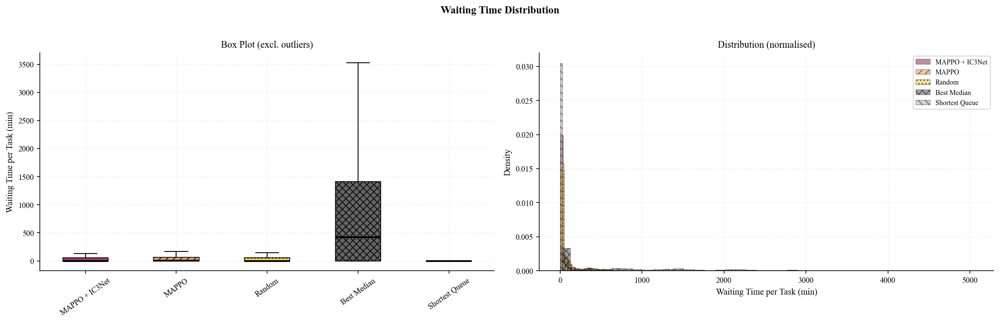

In [20]:
# ============================================================
# FIGURE 1b: Waiting Time Distribution (violin + box, coloured)
# ============================================================
fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle("Waiting Time Distribution", fontweight="bold", y=1.02)

# Collect per-task waiting times
method_wait_data = {}
for name, episodes in all_data.items():
    waits = []
    for ep in episodes:
        for _, row in ep.iterrows():
            if pd.notna(row.get("task_assigned_time")) and pd.notna(row.get("task_started_time")):
                wt = max(0, calc_minutes_between(row["task_assigned_time"], row["task_started_time"]))
                waits.append(wt)
    method_wait_data[name] = waits

ordered = list(method_wait_data.keys())
labels = [method_label(n) for n in ordered]
data = [method_wait_data[n] for n in ordered]

# ── Left: Box plot (grayscale) ──
ax = axes[0]
bp = ax.boxplot(data, labels=labels, patch_artist=True, showfliers=False,
                medianprops=dict(color="black", linewidth=2),
                whiskerprops=dict(color="black"), capprops=dict(color="black"))
for i, (patch, name) in enumerate(zip(bp["boxes"], ordered)):
    patch.set_facecolor(styles[name]["color"])
    patch.set_edgecolor("black")
    patch.set_hatch(styles[name]["hatch"])
    patch.set_alpha(0.85)
ax.set_ylabel("Waiting Time per Task (min)")
ax.set_title("Box Plot (excl. outliers)")
ax.tick_params(axis="x", rotation=35)

# ── Right: Histogram overlay ──
ax = axes[1]
for name in ordered:
    vals = method_wait_data[name]
    if not vals:
        continue
    s = styles[name]
    ax.hist(vals, bins=40, alpha=0.5, color=s["color"], edgecolor="black",
            linewidth=0.5, label=method_label(name), density=True,
            hatch=s["hatch"])
ax.set_xlabel("Waiting Time per Task (min)")
ax.set_ylabel("Density")
ax.set_title("Distribution (normalised)")
ax.legend(fontsize=8)

plt.tight_layout()
plt.savefig("waiting_time_distribution.pdf", bbox_inches="tight")
plt.show()

[Fig 1] avg_cycle_time_min:
    MAPPO + IC3Net      chart='641.8 ± 96.5'  (= Table 1 value)
    MAPPO               chart='718.7 ± 178.6'  (= Table 1 value)
    Random              chart='657.6 ± 77.8'  (= Table 1 value)
    Best Median         chart='4247.7 ± 667.3'  (= Table 1 value)
    Shortest Queue      chart='360.0 ± 35.1'  (= Table 1 value)
[Fig 1] avg_waiting_time_min:
    MAPPO + IC3Net      chart='64.2 ± 15.0'  (= Table 1 value)
    MAPPO               chart='77.2 ± 28.4'  (= Table 1 value)
    Random              chart='67.5 ± 11.6'  (= Table 1 value)
    Best Median         chart='804.9 ± 123.5'  (= Table 1 value)
    Shortest Queue      chart='18.2 ± 4.8'  (= Table 1 value)
[Fig 1] resource_utilization:
    MAPPO + IC3Net      chart='9.1% ± 0.5%'  (= Table 1 value)
    MAPPO               chart='9.1% ± 0.6%'  (= Table 1 value)
    Random              chart='9.2% ± 0.6%'  (= Table 1 value)
    Best Median         chart='11.5% ± 0.7%'  (= Table 1 value)
    Shortest Queue  

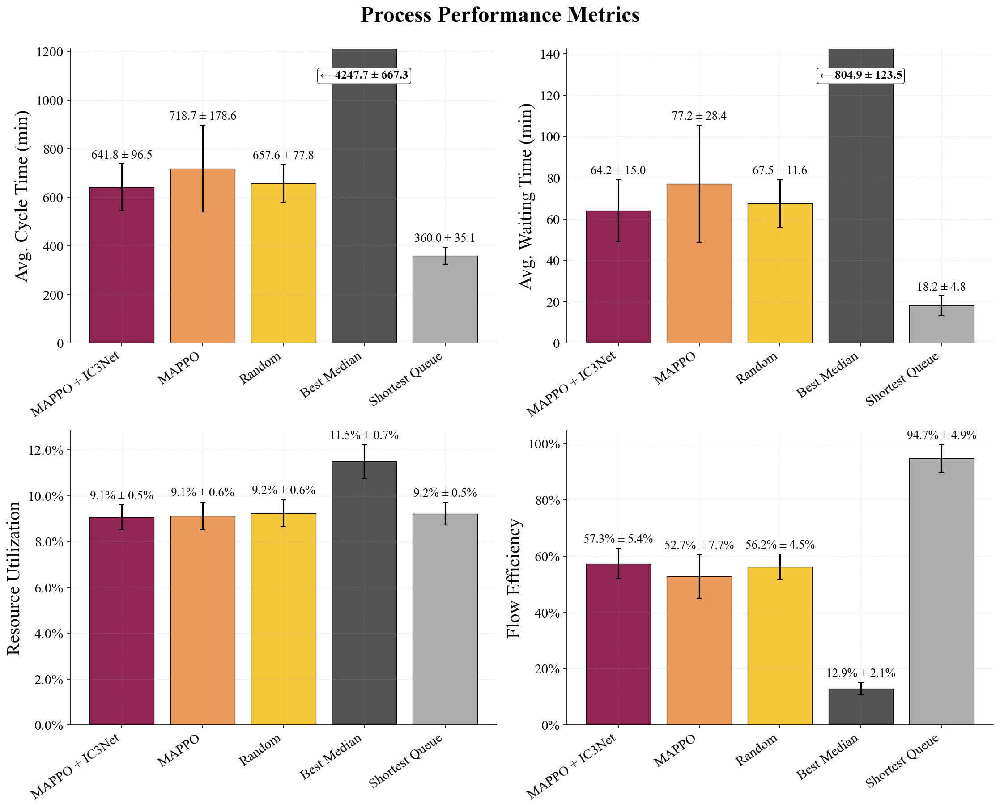

In [21]:
# ============================================================
# FIGURE 1: Process Performance Bar Charts (coloured)
# 2x2 layout. Bar labels show mean ± std in the SAME format as Table 1.
# Multi-seed: mean/std are pooled across all episodes from all runs.
# ============================================================

metric_configs = [
    ("avg_cycle_time_min",    "Avg. Cycle Time (min)",    False),
    ("avg_waiting_time_min",  "Avg. Waiting Time (min)",  False),
    ("resource_utilization",  "Resource Utilization",     True),
    ("flow_efficiency",       "Flow Efficiency",          True),
]

method_names = list(process_metrics.keys())
x = np.arange(len(method_names))

TITLE_FS, AXLABEL_FS, TICK_FS, VALUE_FS, BM_ANNOT_FS = 24, 20, 15, 13, 13

def _fmt_process(m, s, is_ratio):
    """Format EXACTLY like Table 1: percentages use .1%, minutes use .1f."""
    if is_ratio:
        return f"{m:.1%} ± {s:.1%}"
    return f"{m:.1f} ± {s:.1f}"

def _plot_process_bars(zoom=False):
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()
    fig.suptitle("Process Performance Metrics",
                 fontweight="bold", y=1.00, fontsize=TITLE_FS)

    for ax, (metric_key, ylabel, is_ratio) in zip(axes, metric_configs):
        # Collect means & stds in the SAME way Table 1 does (pooled across seeds)
        means, stds = [], []
        for name in method_names:
            vals = [m[metric_key] for m in process_metrics[name]
                    if not np.isnan(m.get(metric_key, np.nan))]
            means.append(float(np.mean(vals)) if vals else 0.0)
            stds.append(float(np.std(vals))  if vals else 0.0)

        bar_colors = [styles[n]["color"] for n in method_names]
        bars = ax.bar(x, means, yerr=stds, capsize=3, color=bar_colors, alpha=0.95,
                      edgecolor="black", linewidth=0.6)
        ax.set_ylabel(ylabel, fontsize=AXLABEL_FS)
        ax.set_xticks(x)
        ax.set_xticklabels([method_label(n) for n in method_names],
                           rotation=35, ha="right", fontsize=TICK_FS)
        ax.tick_params(axis="y", labelsize=TICK_FS)
        if is_ratio:
            ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))

        # Detect best-median bar for zoom handling
        bm_idx = [i for i, n in enumerate(method_names) if _is_best_median(n)]
        non_bm_tops = [means[i] + stds[i] for i in range(len(means)) if i not in bm_idx]
        non_bm_max  = max(non_bm_tops) if non_bm_tops else (max(means) if means else 1.0)
        bm_max      = max(means[i] for i in bm_idx) if bm_idx else 0.0
        zoomed      = zoom and bm_idx and bm_max > non_bm_max * 2.5 and not is_ratio
        if zoomed:
            ax.set_ylim(0, non_bm_max * 1.35)

        y_ref = non_bm_max if zoomed else max(means + [1e-9])
        y_off = 0.012 * y_ref

        # Value labels — "mean ± std" in the SAME format as Table 1
        for i_bar, (bar, m, s) in enumerate(zip(bars, means, stds)):
            if i_bar in bm_idx and zoomed:
                continue  # BM off-scale — drawn as arrow annotation
            if m <= 0:
                continue
            ax.text(bar.get_x() + bar.get_width() / 2.0,
                    bar.get_height() + s + y_off,
                    _fmt_process(m, s, is_ratio),
                    ha="center", va="bottom", fontsize=VALUE_FS)

        # Off-scale BM annotation (zoom only)
        if zoomed:
            for bi in bm_idx:
                ax.annotate(f"← {_fmt_process(means[bi], stds[bi], is_ratio)}",
                            xy=(x[bi], non_bm_max * 1.25),
                            fontsize=BM_ANNOT_FS, fontweight="bold",
                            ha="center", va="top",
                            bbox=dict(boxstyle="round,pad=0.2", facecolor="white",
                                      edgecolor="black", linewidth=0.5))

        # Diagnostic: print BOTH chart label and what the table prints — they
        # must be the character-for-character identical for every row.
        print(f"[Fig 1] {metric_key}:")
        for n, m, s in zip(method_names, means, stds):
            lbl = _fmt_process(m, s, is_ratio)
            print(f"    {method_label(n):18s}  chart='{lbl}'  (= Table 1 value)")

    plt.tight_layout()
    return fig


fig = _plot_process_bars(zoom=True)
plt.savefig("process_performance_zoomed.pdf", bbox_inches="tight")
plt.show()


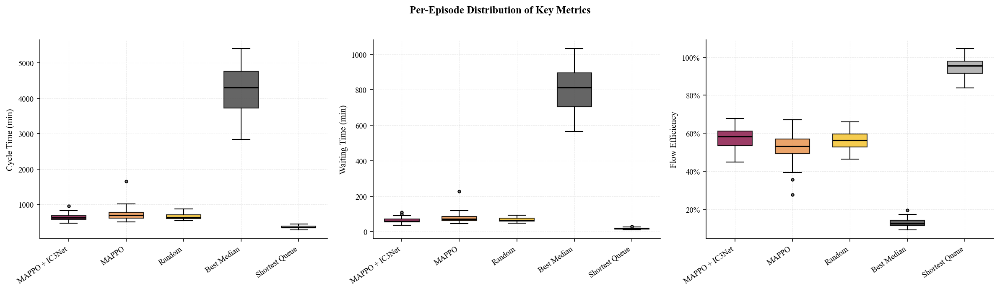

In [22]:
# ============================================================
# FIGURE 2: Per-Episode Breakdown (Box Plots, coloured)
# Multi-seed: boxes span pooled per-episode values across all runs.
# ============================================================
fig, axes = plt.subplots(1, 3, figsize=(16, 4.5))
fig.suptitle("Per-Episode Distribution of Key Metrics", fontweight="bold", y=1.02)

box_metrics = [
    ("avg_cycle_time_min", "Cycle Time (min)"),
    ("avg_waiting_time_min", "Waiting Time (min)"),
    ("flow_efficiency", "Flow Efficiency"),
]

for ax, (metric_key, ylabel) in zip(axes, box_metrics):
    data_for_box, labels, box_colors = [], [], []
    for name in method_names:
        vals = [m[metric_key] for m in process_metrics[name] if not np.isnan(m.get(metric_key, np.nan))]
        if vals:
            data_for_box.append(vals)
            labels.append(method_label(name))
            box_colors.append(styles[name]["color"])
    bp = ax.boxplot(data_for_box, patch_artist=True, widths=0.6,
                    medianprops={"color": "black", "linewidth": 1.5},
                    flierprops={"marker": "o", "markersize": 3, "markerfacecolor": "gray"})
    for patch, c, name in zip(bp["boxes"], box_colors, [n for n in method_names if any(
            not np.isnan(m.get(metric_key, np.nan)) for m in process_metrics[n])]):
        patch.set_facecolor(c)
        patch.set_alpha(0.85)
        patch.set_edgecolor("black")
    ax.set_xticklabels(labels, rotation=35, ha="right")
    ax.set_ylabel(ylabel)
    if "Efficiency" in ylabel:
        ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))

plt.tight_layout()
plt.savefig("process_performance_boxplots.pdf", bbox_inches="tight")
plt.show()


In [23]:
# ============================================================
# TABLE 3: Operational Behaviour Summary
# ============================================================
rows = []
for name, ep_metrics in operational_metrics.items():
    def agg(key):
        vals = [m[key] for m in ep_metrics if not np.isnan(m.get(key, np.nan))]
        return (np.mean(vals), np.std(vals)) if vals else (np.nan, np.nan)
    
    ql_m, ql_s = agg("avg_queue_length")
    ol_m, ol_s = agg("overload_ratio")
    wf_m, wf_s = agg("workload_fairness_cv")
    vr_m, vr_s = agg("volunteer_ratio")
    fr_m, fr_s = agg("fallback_ratio")
    av_m, av_s = agg("avg_volunteers_per_task")
    
    def fmt(m, s, pct=False):
        if np.isnan(m): return "—"
        if pct: return f"{m:.1%} \u00b1 {s:.1%}"
        return f"{m:.2f} \u00b1 {s:.2f}"
    
    rows.append({
        "Method": method_label(name),
        "Avg Queue Length": fmt(ql_m, ql_s),
        f"Overload Ratio (>{OVERLOAD_THRESHOLD})": fmt(ol_m, ol_s, pct=True),
        "Workload Fairness (CV)": fmt(wf_m, wf_s),
        "Volunteer Ratio": fmt(vr_m, vr_s, pct=True),
        "Fallback Ratio": fmt(fr_m, fr_s, pct=True),
        "Avg Volunteers/Task": fmt(av_m, av_s),
    })

print(f"\n{'='*90}")
print(f"  Table 3: Operational Behaviour Metrics")
print(f"{'='*90}")
display(pd.DataFrame(rows).set_index("Method"))


  Table 3: Operational Behaviour Metrics


,Avg Queue Length,Overload Ratio (>5),Workload Fairness (CV),Volunteer Ratio,Fallback Ratio,Avg Volunteers/Task
Method,,,,,,
MAPPO + IC3Net,0.76 ± 0.15,3.2% ± 1.6%,1.51 ± 0.04,45.9% ± 40.1%,54.1% ± 40.1%,2.99 ± 2.05
MAPPO,0.92 ± 0.27,4.7% ± 3.0%,1.50 ± 0.04,6.6% ± 9.0%,93.4% ± 9.0%,1.44 ± 1.37
Random,0.80 ± 0.14,3.5% ± 1.7%,1.50 ± 0.04,89.1% ± 0.7%,10.9% ± 0.7%,2.80 ± 0.04
Best Median,10.20 ± 1.45,45.0% ± 2.8%,1.55 ± 0.02,100.0% ± 0.0%,0.0% ± 0.0%,1.00 ± 0.00
Shortest Queue,0.18 ± 0.04,0.1% ± 0.3%,1.51 ± 0.03,100.0% ± 0.0%,0.0% ± 0.0%,1.00 ± 0.00


[Fig 5] avg_queue_length:
    MAPPO + IC3Net      chart='0.76 ± 0.15'  (= Table 3 value)
    MAPPO               chart='0.92 ± 0.27'  (= Table 3 value)
    Random              chart='0.80 ± 0.14'  (= Table 3 value)
    Best Median         chart='10.20 ± 1.45'  (= Table 3 value)
    Shortest Queue      chart='0.18 ± 0.04'  (= Table 3 value)
[Fig 5] overload_ratio:
    MAPPO + IC3Net      chart='3.2% ± 1.6%'  (= Table 3 value)
    MAPPO               chart='4.7% ± 3.0%'  (= Table 3 value)
    Random              chart='3.5% ± 1.7%'  (= Table 3 value)
    Best Median         chart='45.0% ± 2.8%'  (= Table 3 value)
    Shortest Queue      chart='0.1% ± 0.3%'  (= Table 3 value)
[Fig 5] workload_fairness_cv:
    MAPPO + IC3Net      chart='1.51 ± 0.04'  (= Table 3 value)
    MAPPO               chart='1.50 ± 0.04'  (= Table 3 value)
    Random              chart='1.50 ± 0.04'  (= Table 3 value)
    Best Median         chart='1.55 ± 0.02'  (= Table 3 value)
    Shortest Queue      chart='1.51 

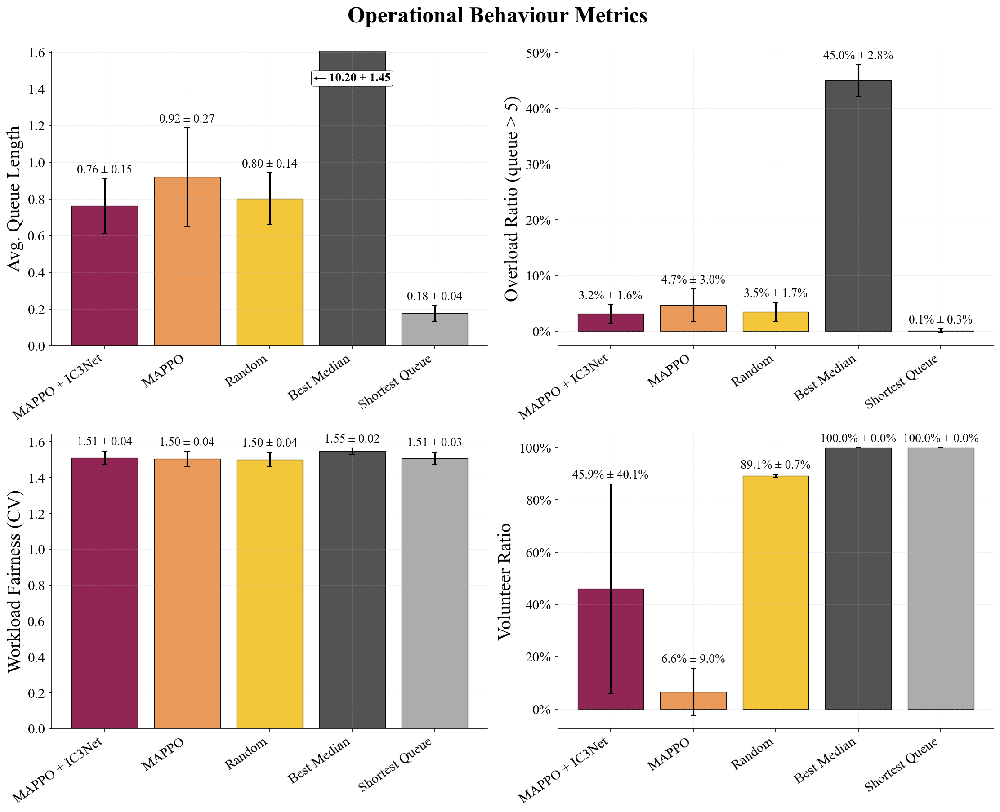

In [24]:
# ============================================================
# FIGURE 5: Operational Behaviour Bar Charts (coloured)
# 2x2 layout. Bar labels show mean ± std in the SAME format as Table 3.
# Multi-seed: mean/std pooled across all episodes from all runs.
# ============================================================

op_configs = [
    ("avg_queue_length",       "Avg. Queue Length",                                        False),
    ("overload_ratio",         f"Overload Ratio (queue > {OVERLOAD_THRESHOLD})",          True),
    ("workload_fairness_cv",   "Workload Fairness (CV)",                                   False),
    ("volunteer_ratio",        "Volunteer Ratio",                                          True),
]

TITLE_FS, AXLABEL_FS, TICK_FS, VALUE_FS, BM_ANNOT_FS = 24, 20, 15, 13, 13

def _fmt_op(m, s, is_pct):
    """Format EXACTLY like Table 3: percentages use .1%, numbers use .2f."""
    if is_pct:
        return f"{m:.1%} ± {s:.1%}"
    return f"{m:.2f} ± {s:.2f}"

def _plot_operational_bars(zoom=False):
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    axes = axes.flatten()
    fig.suptitle("Operational Behaviour Metrics",
                 fontweight="bold", y=1.00, fontsize=TITLE_FS)

    for ax, (metric_key, ylabel, is_pct) in zip(axes, op_configs):
        means, stds = [], []
        for name in method_names:
            vals = [m[metric_key] for m in operational_metrics[name]
                    if not np.isnan(m.get(metric_key, np.nan))]
            means.append(float(np.mean(vals)) if vals else 0.0)
            stds.append(float(np.std(vals))  if vals else 0.0)

        bar_colors = [styles[n]["color"] for n in method_names]
        bars = ax.bar(x, means, yerr=stds, capsize=3, color=bar_colors, alpha=0.95,
                      edgecolor="black", linewidth=0.6)
        ax.set_ylabel(ylabel, fontsize=AXLABEL_FS)
        ax.set_xticks(x)
        ax.set_xticklabels([method_label(n) for n in method_names],
                           rotation=35, ha="right", fontsize=TICK_FS)
        ax.tick_params(axis="y", labelsize=TICK_FS)
        if is_pct:
            ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))

        bm_idx = [i for i, n in enumerate(method_names) if _is_best_median(n)]
        non_bm_tops = [means[i] + stds[i] for i in range(len(means)) if i not in bm_idx]
        non_bm_max  = max(non_bm_tops) if non_bm_tops else (max(means) if means else 1.0)
        bm_max      = max(means[i] for i in bm_idx) if bm_idx else 0.0
        zoomed      = zoom and bm_idx and bm_max > non_bm_max * 2.5 and not is_pct
        if zoomed:
            ax.set_ylim(0, non_bm_max * 1.35)

        y_ref = non_bm_max if zoomed else max(means + [1e-9])
        y_off = 0.012 * y_ref
        for i_bar, (bar, m, s) in enumerate(zip(bars, means, stds)):
            if i_bar in bm_idx and zoomed:
                continue
            if m <= 0:
                continue
            ax.text(bar.get_x() + bar.get_width() / 2.0,
                    bar.get_height() + s + y_off,
                    _fmt_op(m, s, is_pct),
                    ha="center", va="bottom", fontsize=VALUE_FS)

        if zoomed:
            for bi in bm_idx:
                ax.annotate(f"← {_fmt_op(means[bi], stds[bi], is_pct)}",
                            xy=(x[bi], non_bm_max * 1.25),
                            fontsize=BM_ANNOT_FS, fontweight="bold",
                            ha="center", va="top",
                            bbox=dict(boxstyle="round,pad=0.2", facecolor="white",
                                      edgecolor="black", linewidth=0.5))

        print(f"[Fig 5] {metric_key}:")
        for n, m, s in zip(method_names, means, stds):
            lbl = _fmt_op(m, s, is_pct)
            print(f"    {method_label(n):18s}  chart='{lbl}'  (= Table 3 value)")

    plt.tight_layout()
    return fig


fig = _plot_operational_bars(zoom=True)
plt.savefig("operational_behaviour_zoomed.pdf", bbox_inches="tight")
plt.show()


---
## 8.3 Effect of Communication

**Research question:** Why does communication help, and how do process metrics develop during training?

**Difference with Exp 1:** Experiment 1 looks at reward/convergence. Experiment 3 looks at the same process metrics as Exp 2 but as time series over training episodes — revealing the mechanism behind improvement.

**Metrics:** waiting time, cycle time, flow efficiency, volunteer ratio, workload CV, utilisation — all tracked per eval episode.

**Expected conclusion:** Communication breaks the non-volunteering equilibrium, visible in the volunteer ratio rising from 0% to ~50%, with a characteristic exploration phase.

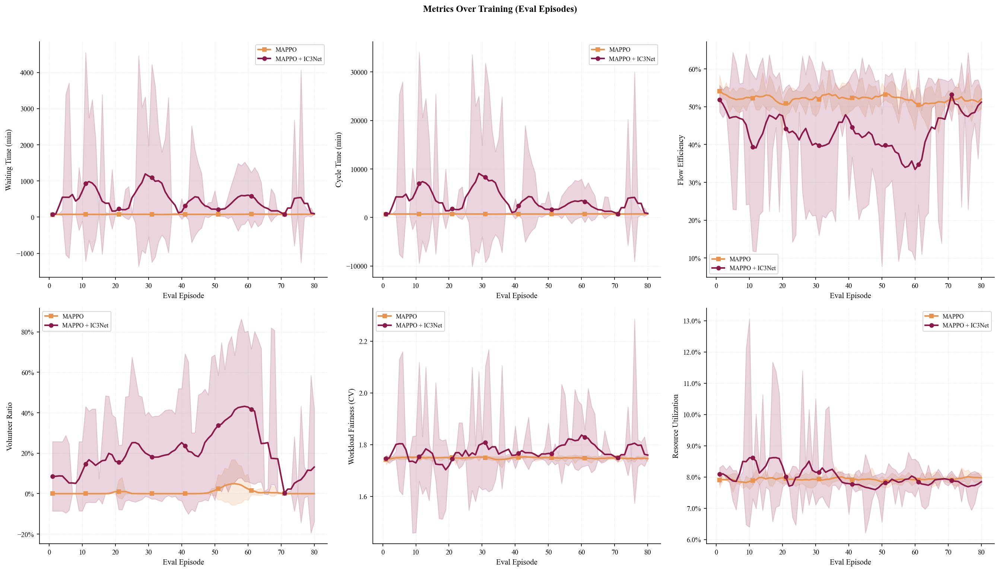

In [25]:
# ============================================================
# FIGURE 8: Operational Metrics Over Training Episodes (coloured)
# (Uses eval logs to show how metrics evolve during training)
# — multi-seed: mean ± std band across runs
# ============================================================
eval_methods_multi, eval_run_map = discover_methods_multi(RESOLVED_DIRS, "eval")

if eval_methods_multi:
    # Load eval data per run per method
    # Structure: {method -> {run_idx -> [metric_dict, ...]}}
    eval_per_run = defaultdict(lambda: defaultdict(list))

    for name, files in eval_methods_multi.items():
        for run_idx, f in eval_run_map[name]:
            try:
                df = pd.read_csv(f)
                if len(df) == 0:
                    continue
                for col in ["case_open_time", "case_completed_time",
                            "task_assigned_time", "task_started_time", "task_completed_time"]:
                    if col in df.columns:
                        df[col] = safe_parse_timestamps(df[col])
                pm = compute_process_metrics(df)
                om = compute_operational_metrics(df, OVERLOAD_THRESHOLD)
                pm.update(om)
                eval_per_run[name][run_idx].append(pm)
            except Exception:
                pass

    if eval_per_run:
        fig, axes = plt.subplots(2, 3, figsize=(18, 10))
        fig.suptitle("Metrics Over Training (Eval Episodes)", fontweight="bold", y=1.02)

        track_metrics = [
            ("avg_waiting_time_min", "Waiting Time (min)"),
            ("avg_cycle_time_min", "Cycle Time (min)"),
            ("flow_efficiency", "Flow Efficiency"),
            ("volunteer_ratio", "Volunteer Ratio"),
            ("workload_fairness_cv", "Workload Fairness (CV)"),
            ("resource_utilization", "Resource Utilization"),
        ]

        for ax, (mk, ylabel) in zip(axes.flat, track_metrics):
            for name, runs_data in eval_per_run.items():
                s = styles.get(name, {"color": "#333333", "linestyle": "-", "marker": "o"})

                # Extract metric series per run
                run_series = []
                for run_idx in sorted(runs_data.keys()):
                    vals = [m.get(mk, np.nan) for m in runs_data[run_idx]]
                    run_series.append(vals)

                if not run_series:
                    continue

                # Pad to same length
                max_len = max(len(r) for r in run_series)
                padded = np.full((len(run_series), max_len), np.nan)
                for i, r in enumerate(run_series):
                    padded[i, :len(r)] = r

                mean_vals = np.nanmean(padded, axis=0)
                std_vals = np.nanstd(padded, axis=0)
                eps = np.arange(1, max_len + 1)

                # Shaded band for multi-run
                if len(run_series) > 1:
                    ax.fill_between(eps, mean_vals - std_vals, mean_vals + std_vals,
                                    alpha=0.18, color=s["color"])

                # Smoothed mean line
                if len(mean_vals) >= SMOOTH_WINDOW:
                    ax.plot(eps, smooth(mean_vals, SMOOTH_WINDOW), color=s["color"],
                            linewidth=2, linestyle="-", marker=s["marker"],
                            markevery=max(1, len(mean_vals) // 8), markersize=5,
                            label=method_label(name))
                else:
                    ax.plot(eps, mean_vals, color=s["color"], linewidth=2,
                            linestyle="-", marker=s["marker"],
                            markersize=5, label=method_label(name))

            ax.set_xlabel("Eval Episode")
            ax.set_ylabel(ylabel)
            ax.legend(fontsize=8, loc="best")
            if mk in ("flow_efficiency", "volunteer_ratio", "resource_utilization"):
                ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))

        plt.tight_layout()
        plt.savefig("metrics_over_training.pdf", bbox_inches="tight")
        plt.show()
    else:
        print("No eval episodes found for training progression.")
else:
    print("No eval logs found — skipping training progression charts.")


---
## 8.4 Qualitative Analysis

**Research question:** What does the learned behaviour look like at individual agent and case level?

**Metrics:** assignment type distribution, gate activation patterns, case-level comparisons, workload distribution.

**Expected conclusion:** Gate activation is selective (not random), collaborative tasks trigger more communication, and at case level the difference between "fallback after timeout" vs "two agents volunteer simultaneously" is visible.

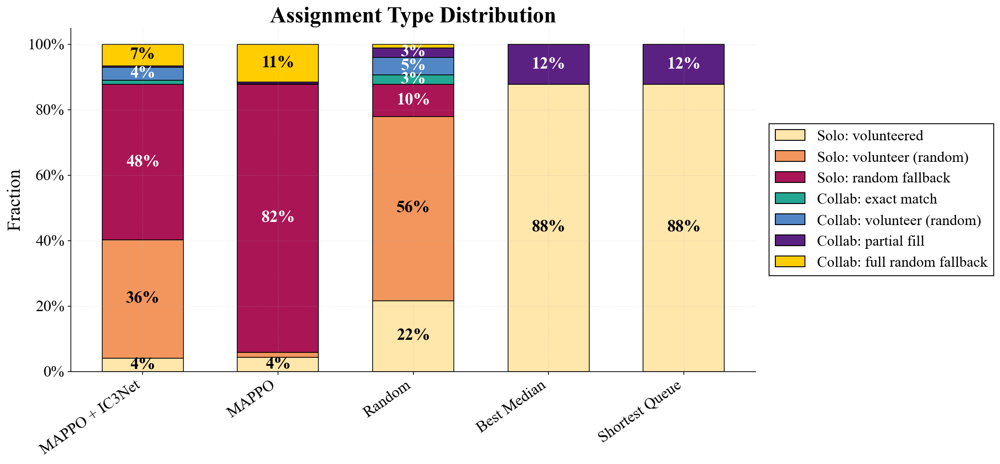

In [26]:
# ============================================================
# FIGURE 6: Assignment Type Distribution (Stacked Bar, coloured)
# Multi-seed: fractions are pooled across all episodes from all runs.
# ============================================================
TITLE_FS, AXLABEL_FS, TICK_FS, LEGEND_FS, BAR_PCT_FS = 24, 20, 17, 16, 18

fig, ax = plt.subplots(figsize=(15, 7))
ax.set_title("Assignment Type Distribution", fontweight="bold", fontsize=TITLE_FS)

# Collect assignment type fractions per method (pooled)
assignment_data = {}
all_types = set()
for name, episodes in all_data.items():
    type_counts = defaultdict(int)
    total = 0
    for ep in episodes:
        if "task_assignment_type" in ep.columns:
            for t in ep["task_assignment_type"].dropna():
                type_counts[t] += 1
                total += 1
                all_types.add(t)
    if total > 0:
        assignment_data[name] = {t: c / total for t, c in type_counts.items()}

if assignment_data:
    # High-contrast palette — stays in the yellow / orange / pink family
    # but spreads values wide enough that every segment is distinct.
    _type_config = {
        "solo_volunteer":                  {"label": "Solo: volunteered",           "color": "#FFE6AB"},
        "solo_volunteer_random":           {"label": "Solo: volunteer (random)",    "color": "#F3965E"},
        "solo_fallback_random":            {"label": "Solo: random fallback",       "color": "#AA1555"},
        "collab_volunteer":                {"label": "Collab: exact match",         "color": "#24A793"},
        "collab_volunteer_all_random":     {"label": "Collab: volunteer (random)",  "color": "#5287C6"},
        "collab_volunteer_partial_random": {"label": "Collab: partial fill",        "color": "#5B2182"},
        "collab_fallback_random":          {"label": "Collab: full random fallback","color": "#FFCD00"},
    }
    _fallback_palette = ["#4A4A4A", "#9E9E9E", "#222222"]

    type_styles = {}
    for t in _type_config:
        if t in all_types:
            type_styles[t] = _type_config[t]
    for t in sorted(all_types):
        if t not in type_styles:
            fi = len(type_styles) - len(_type_config)
            type_styles[t] = {
                "label": t.replace("_", " ").capitalize(),
                "color": _fallback_palette[fi % len(_fallback_palette)],
            }

    ordered_types = list(type_styles.keys())
    bar_width = 0.6
    method_list = list(assignment_data.keys())
    x_pos = np.arange(len(method_list))

    bottoms = np.zeros(len(method_list))
    for atype in ordered_types:
        ts = type_styles[atype]
        vals = [assignment_data[m].get(atype, 0) for m in method_list]
        ax.bar(x_pos, vals, bar_width, bottom=bottoms,
               color=ts["color"], alpha=1.0, edgecolor="black", linewidth=0.8)

        # Big, bold percentage labels inside each segment (≥ 2%).
        for xi, (v, b) in enumerate(zip(vals, bottoms)):
            if v < 0.02:
                continue
            mid_y = b + v / 2
            # Luminance-based contrast picker
            hexc = ts["color"].lstrip("#")
            r, g, bl = int(hexc[0:2], 16), int(hexc[2:4], 16), int(hexc[4:6], 16)
            lum = (0.299 * r + 0.587 * g + 0.114 * bl) / 255
            text_color = "black" if lum > 0.55 else "white"
            ax.text(x_pos[xi], mid_y, f"{v:.0%}",
                    ha="center", va="center",
                    fontsize=BAR_PCT_FS, fontweight="bold",
                    color=text_color)

        bottoms += vals

    ax.set_xticks(x_pos)
    ax.set_xticklabels([method_label(m) for m in method_list],
                       rotation=35, ha="right", fontsize=TICK_FS)
    ax.tick_params(axis="y", labelsize=TICK_FS)
    ax.set_ylabel("Fraction", fontsize=AXLABEL_FS)
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))
    ax.set_ylim(0, 1.05)

    # Legend: plain colour patches, outside the plot on the right
    from matplotlib.patches import Patch
    legend_handles = [
        Patch(facecolor=type_styles[t]["color"], edgecolor="black",
              label=type_styles[t]["label"])
        for t in ordered_types
    ]
    ax.legend(handles=legend_handles,
              loc="center left", bbox_to_anchor=(1.02, 0.5),
              fontsize=LEGEND_FS, ncol=1,
              framealpha=0.95, edgecolor="black", fancybox=False,
              borderaxespad=0.)

    plt.tight_layout()
    plt.savefig("assignment_distribution.pdf", bbox_inches="tight")
    plt.show()
else:
    print("No assignment type data available.")


In [27]:
# ============================================================
# TABLE: Assignment Type Distribution (counts & percentages)
# ============================================================

# Reuse assignment_data computed in the figure cell above
if assignment_data:
    # Build table: rows = assignment types, columns = methods
    sorted_types = sorted(all_types)
    method_list = list(assignment_data.keys())
    
    # Also compute absolute counts
    assignment_counts = {}
    assignment_totals = {}
    for name, episodes in all_data.items():
        type_counts = defaultdict(int)
        total = 0
        for ep in episodes:
            if "task_assignment_type" in ep.columns:
                for t in ep["task_assignment_type"].dropna():
                    type_counts[t] += 1
                    total += 1
        assignment_counts[name] = dict(type_counts)
        assignment_totals[name] = total
    
    # Pretty type labels
    _type_labels = {
        "solo_volunteer": "Volunteered",
        "solo_volunteer_random": "Vol. (random tie-break)",
        "solo_fallback_random": "Fallback (timeout)",
        "collab_volunteer": "Collab: exact match",
        "collab_volunteer_all_random": "Collab: all random",
        "collab_volunteer_partial_random": "Collab: partial random",
        "collab_fallback_random": "Collab: fallback",
    }
    
    rows = []
    for atype in sorted_types:
        row = {"Assignment Type": _type_labels.get(atype, atype.replace("_", " ").title())}
        for name in method_list:
            count = assignment_counts.get(name, {}).get(atype, 0)
            frac = assignment_data[name].get(atype, 0)
            row[method_label(name)] = f"{count:,}  ({frac:.1%})"
        rows.append(row)
    
    # Add total row
    total_row = {"Assignment Type": "TOTAL"}
    for name in method_list:
        total_row[method_label(name)] = f"{assignment_totals.get(name, 0):,}  (100%)"
    rows.append(total_row)
    
    print(f"\n{'='*90}")
    print(f"  Assignment Type Distribution")
    print(f"{'='*90}")
    df_assign = pd.DataFrame(rows).set_index("Assignment Type")
    display(df_assign)
else:
    print("No assignment type data available.")


  Assignment Type Distribution


,MAPPO + IC3Net,MAPPO,Random,Best Median,Shortest Queue
Assignment Type,,,,,
Collab: fallback,"4,480 (6.5%)","7,872 (11.5%)",716 (1.0%),0 (0.0%),0 (0.0%)
Collab: exact match,884 (1.3%),92 (0.1%),"1,980 (2.9%)",0 (0.0%),0 (0.0%)
Collab: all random,"2,749 (4.0%)",37 (0.1%),"3,696 (5.4%)",0 (0.0%),0 (0.0%)
Collab: partial random,287 (0.4%),399 (0.6%),"2,008 (2.9%)","8,400 (12.2%)","8,400 (12.2%)"
Fallback (timeout),"32,656 (47.5%)","56,318 (82.0%)","6,743 (9.8%)",0 (0.0%),0 (0.0%)
Volunteered,"2,790 (4.1%)","2,984 (4.3%)","14,882 (21.7%)","60,300 (87.8%)","60,300 (87.8%)"
Vol. (random tie-break),"24,854 (36.2%)",998 (1.5%),"38,675 (56.3%)",0 (0.0%),0 (0.0%)
TOTAL,"68,700 (100%)","68,700 (100%)","68,700 (100%)","68,700 (100%)","68,700 (100%)"


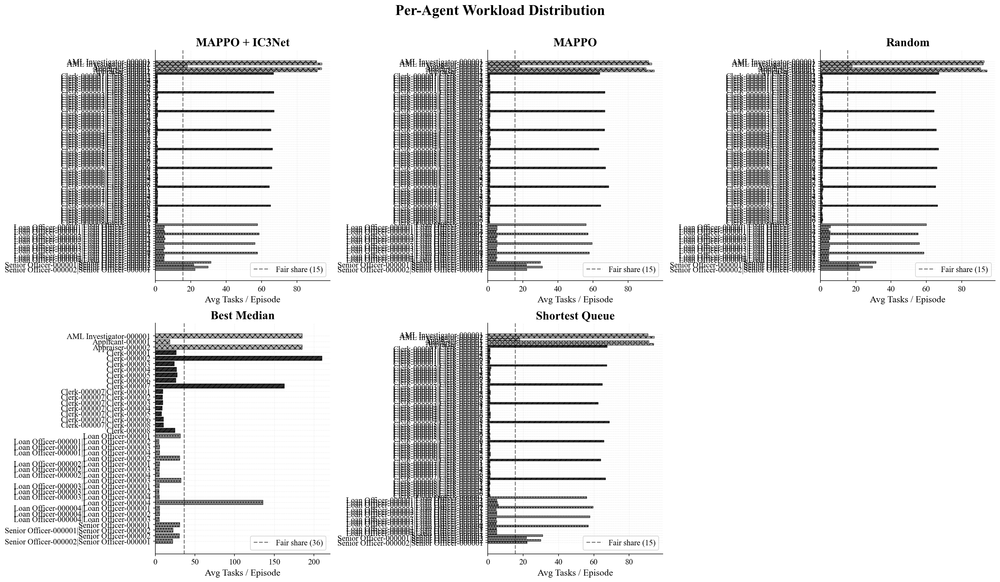

In [28]:
# ============================================================
# FIGURE 7: Workload Distribution per Agent (grayscale)
# 3 columns × 2 rows layout with enlarged fonts for readability
# ============================================================
import math
n_methods_wl = len(all_data)
n_cols = 3
n_rows = math.ceil(n_methods_wl / n_cols)

fig, axes = plt.subplots(
    n_rows, n_cols,
    figsize=(7 * n_cols, 6 * n_rows),
    squeeze=False,
)
fig.suptitle("Per-Agent Workload Distribution", fontweight="bold", y=1.01, fontsize=22)

# Hide unused subplots
for ax in axes.flat[n_methods_wl:]:
    ax.set_visible(False)

# Grayscale shades for agent roles
role_styles = {
    "technician": {"color": "#000000", "hatch": "///"},
    "pharmacist": {"color": "#666666", "hatch": "..."},
    "other":      {"color": "#AAAAAA", "hatch": "xxx"},
}

for idx, (name, episodes) in enumerate(all_data.items()):
    ax = axes.flat[idx]

    # Aggregate task counts per agent across all episodes
    agent_totals = defaultdict(int)
    for ep in episodes:
        if "task_agent_name" in ep.columns:
            for agent, count in ep.groupby("task_agent_name").size().items():
                agent_totals[agent] += count

    if not agent_totals:
        ax.set_title(method_label(name), fontsize=18, fontweight="bold")
        ax.text(0.5, 0.5, "No data", ha="center", va="center", transform=ax.transAxes, fontsize=14)
        continue

    # Sort agents by name
    sorted_agents = sorted(agent_totals.keys())
    counts = [agent_totals[a] / len(episodes) for a in sorted_agents]  # avg per episode

    # Assign grayscale by role
    bar_colors = []
    bar_hatches = []
    for a in sorted_agents:
        a_lower = a.lower()
        if "technician" in a_lower or "clerk" in a_lower:
            bar_colors.append(role_styles["technician"]["color"])
            bar_hatches.append(role_styles["technician"]["hatch"])
        elif "pharmacist" in a_lower or "officer" in a_lower or "senior" in a_lower:
            bar_colors.append(role_styles["pharmacist"]["color"])
            bar_hatches.append(role_styles["pharmacist"]["hatch"])
        else:
            bar_colors.append(role_styles["other"]["color"])
            bar_hatches.append(role_styles["other"]["hatch"])

    y_pos = np.arange(len(sorted_agents))
    bars = ax.barh(y_pos, counts, color=bar_colors, alpha=0.85,
                   edgecolor="black", linewidth=0.6)
    for bar, h in zip(bars, bar_hatches):
        bar.set_hatch(h)

    ax.set_yticks(y_pos)
    ax.set_yticklabels(sorted_agents, fontsize=12)
    ax.tick_params(axis="x", labelsize=12)
    ax.set_xlabel("Avg Tasks / Episode", fontsize=14)
    ax.set_title(method_label(name), fontsize=18, fontweight="bold")
    ax.invert_yaxis()

    # Reference line for fair distribution
    fair_share = np.mean(counts)
    ax.axvline(fair_share, color="black", linestyle="--", alpha=0.5,
               label=f"Fair share ({fair_share:.0f})")
    ax.legend(fontsize=12, loc="lower right")

plt.tight_layout()
plt.savefig("workload_distribution.pdf", bbox_inches="tight")
plt.show()


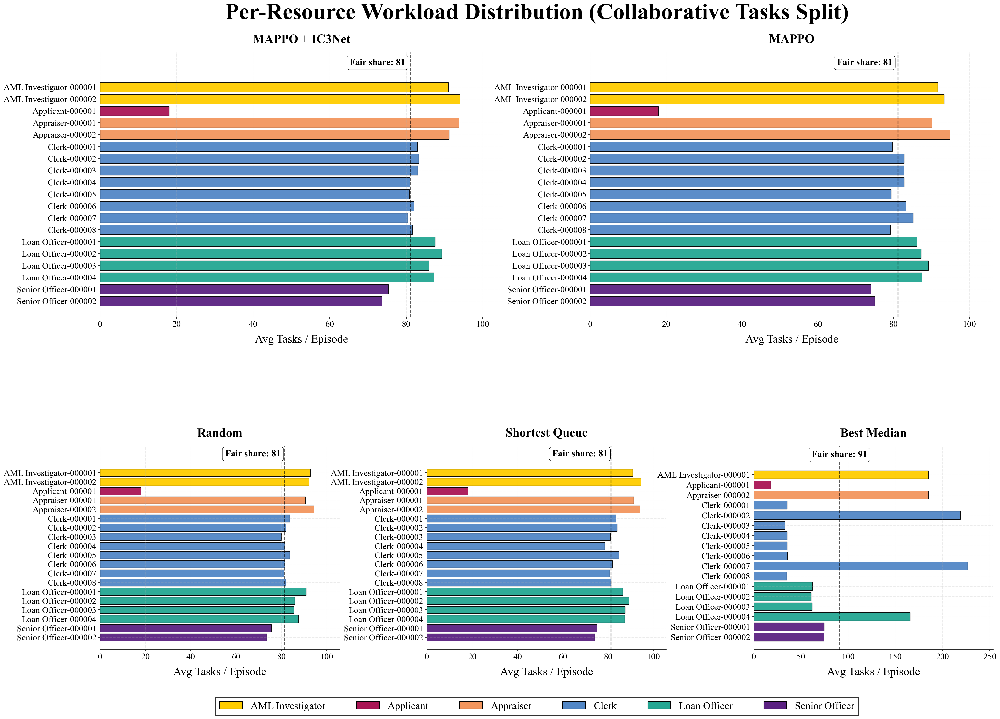

In [43]:
# ============================================================
# FIGURE 7b: Workload Distribution per Individual Resource
# Layout: 2 main methods on top — bigger (MAPPO + IC3Net, MAPPO)
#         3 baselines below (Random, Shortest Queue, Best Median)
# Collaborative tasks split across participating agents.
# Each role gets its own distinct colour from the project palette.
# Multi-seed: counts are pooled across all runs; avg/episode uses the
# total episode count (across all runs) as denominator.
# ============================================================
import re as _re
import matplotlib.gridspec as gridspec
from matplotlib.patches import Patch

TITLE_FS, AXLABEL_FS, TICK_FS, LEGEND_FS, SUBTITLE_FS = 44, 22, 17, 18, 24

top_order    = ["mappo_parallel_comm", "mappo_parallel"]
bottom_order = ["baseline_random", "baseline_shortest_queue", "baseline_best_median"]

top_methods    = [m for m in top_order    if m in all_data]
bottom_methods = [m for m in bottom_order if m in all_data]
leftovers = [m for m in all_data if m not in top_methods and m not in bottom_methods]
bottom_methods += leftovers

# Explicit colour per role (from project palette). Each role is visually distinct.
ROLE_COLORS = {
    "AML Investigator": "#FFCD00",  # yellow
    "Appraiser":        "#F3965E",  # orange
    "Applicant":        "#AA1555",  # magenta
    "Clerk":            "#5287C6",  # blue
    "Loan Officer":     "#24A793",  # teal
    "Senior Officer":   "#5B2182",  # purple
}
_FALLBACK_PALETTE = ["#FFE6AB", "#6A6A6A", "#B5B5B5"]

def _role_for(agent_name):
    """Extract the role label by stripping trailing '-<digits>' / '_<digits>' / spaces+digits."""
    stripped = _re.sub(r"[-_\s]*\d+\s*$", "", agent_name).strip()
    return stripped if stripped else agent_name

def _color_for(role, _cache={}):
    if role in ROLE_COLORS:
        return ROLE_COLORS[role]
    if role not in _cache:
        _cache[role] = _FALLBACK_PALETTE[len(_cache) % len(_FALLBACK_PALETTE)]
    return _cache[role]

# Generous canvas so nothing collides
fig = plt.figure(figsize=(26, 20))
gs = gridspec.GridSpec(
    2, 6, figure=fig,
    hspace=0.55, wspace=1.15,
    height_ratios=[1.3, 1.0],
    top=0.91, bottom=0.11, left=0.05, right=0.97,
)
fig.suptitle("Per-Resource Workload Distribution (Collaborative Tasks Split)",
             fontweight="bold", fontsize=TITLE_FS, y=0.975)

seen_roles = []   # preserve first-seen order for the legend

def _plot_one(ax, name):
    episodes = all_data[name]
    agent_totals = defaultdict(int)
    for ep in episodes:
        if "task_agent_name" in ep.columns:
            for _, row_data in ep.iterrows():
                agent_str = str(row_data["task_agent_name"])
                for agent in [a.strip() for a in agent_str.split("|")]:
                    if agent and agent != "nan":
                        agent_totals[agent] += 1

    if not agent_totals:
        ax.set_title(method_label(name), fontsize=SUBTITLE_FS,
                     fontweight="bold", pad=18)
        ax.text(0.5, 0.5, "No data", ha="center", va="center",
                transform=ax.transAxes, fontsize=AXLABEL_FS)
        return

    sorted_agents = sorted(agent_totals.keys())
    # Multi-seed: denominator is total pooled episode count across all runs.
    counts = [agent_totals[a] / len(episodes) for a in sorted_agents]
    roles  = [_role_for(a) for a in sorted_agents]
    bar_colors = [_color_for(r) for r in roles]

    for r in roles:
        if r not in seen_roles:
            seen_roles.append(r)

    y_pos = np.arange(len(sorted_agents))
    ax.barh(y_pos, counts, color=bar_colors, alpha=0.95,
            edgecolor="black", linewidth=0.6)

    ax.set_yticks(y_pos)
    ax.set_yticklabels(sorted_agents, fontsize=TICK_FS)
    ax.set_xlabel("Avg Tasks / Episode", fontsize=AXLABEL_FS, labelpad=12)
    ax.tick_params(axis="x", labelsize=TICK_FS)
    ax.set_title(method_label(name), fontsize=SUBTITLE_FS,
                 fontweight="bold", pad=18)
    ax.invert_yaxis()

    # Modest right-side padding so bars can never touch the plot edge
    max_val = max(counts) if counts else 1.0
    ax.set_xlim(0, max_val * 1.12)

    # Dashed reference line at the fair-share value
    fair_share = float(np.mean(counts))
    ax.axvline(fair_share, color="black", linestyle="--",
               alpha=0.65, linewidth=1.6)

    # Carve out empty space ABOVE the first bar (inside the axes) so the
    # Fair-share label can sit right next to its dashed line without
    # overlapping any role-name bar OR the subplot title (title lives
    # OUTSIDE the axes, so putting the label INSIDE is fully safe).
    bot, top = ax.get_ylim()   # inverted: bot > top
    ax.set_ylim(bot, top - 1.6)

    # Horizontal placement: stay near the line, but if the line is close to
    # an edge, anchor the label so it doesn't slide off the axes.
    if fair_share < 0.35 * max_val:
        anchor_x = fair_share + 0.015 * max_val
        anchor_ha = "left"
    elif fair_share > 0.65 * max_val:
        anchor_x = fair_share - 0.015 * max_val
        anchor_ha = "right"
    else:
        anchor_x = fair_share
        anchor_ha = "center"

    ax.text(anchor_x, top - 0.7, f"Fair share: {fair_share:.0f}",
            ha=anchor_ha, va="center",
            fontsize=LEGEND_FS, fontweight="bold",
            bbox=dict(boxstyle="round,pad=0.3", facecolor="white",
                      edgecolor="black", linewidth=0.6))

# Top row: 2 bigger subplots (MAPPO + IC3Net, MAPPO)
for slot, name in zip([gs[0, 0:3], gs[0, 3:6]], top_methods[:2]):
    _plot_one(fig.add_subplot(slot), name)

# Bottom row: 3 equal-width baselines
for slot, name in zip([gs[1, 0:2], gs[1, 2:4], gs[1, 4:6]], bottom_methods):
    _plot_one(fig.add_subplot(slot), name)

# Single figure-level role legend at the bottom
legend_handles = [Patch(facecolor=_color_for(r), edgecolor="black", label=r)
                  for r in seen_roles]
if legend_handles:
    fig.legend(handles=legend_handles,
               loc="lower center", bbox_to_anchor=(0.5, 0.015),
               ncol=min(len(legend_handles), 6), fontsize=LEGEND_FS + 2,
               frameon=True, edgecolor="black", fancybox=False,
               handlelength=2.2, columnspacing=3.0)

plt.savefig("workload_distribution_per_resource.pdf", bbox_inches="tight")
plt.show()


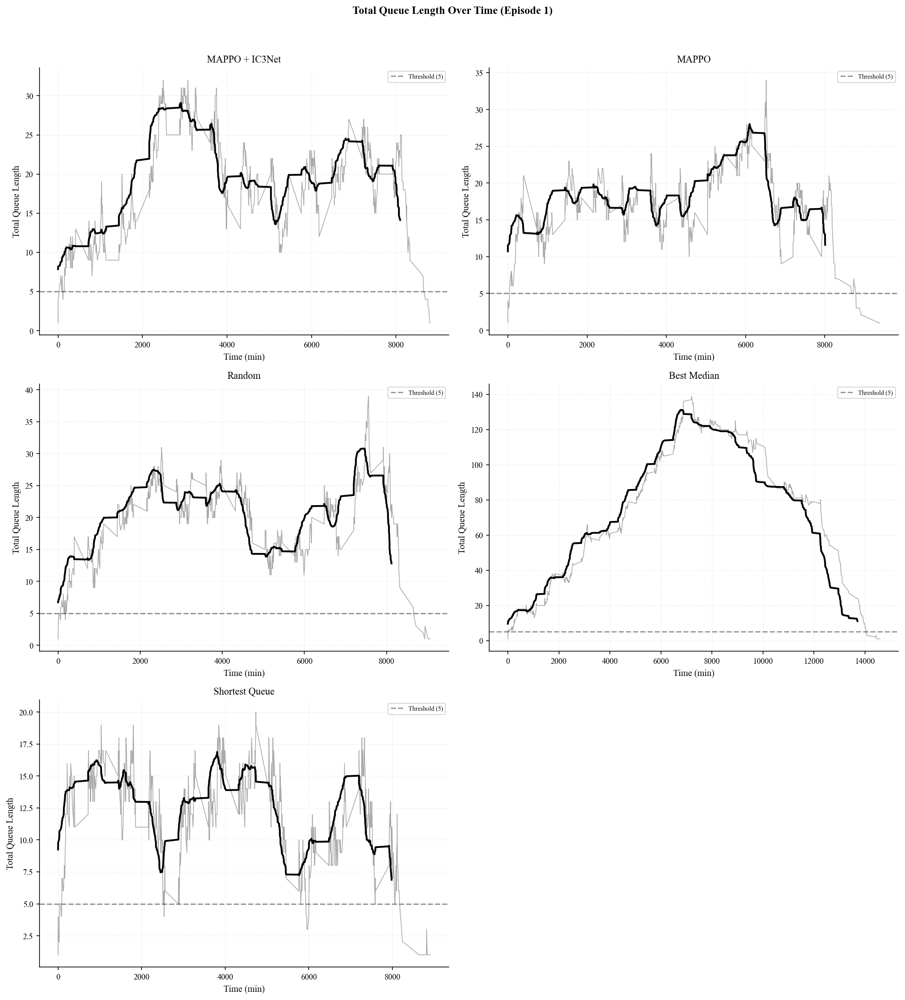

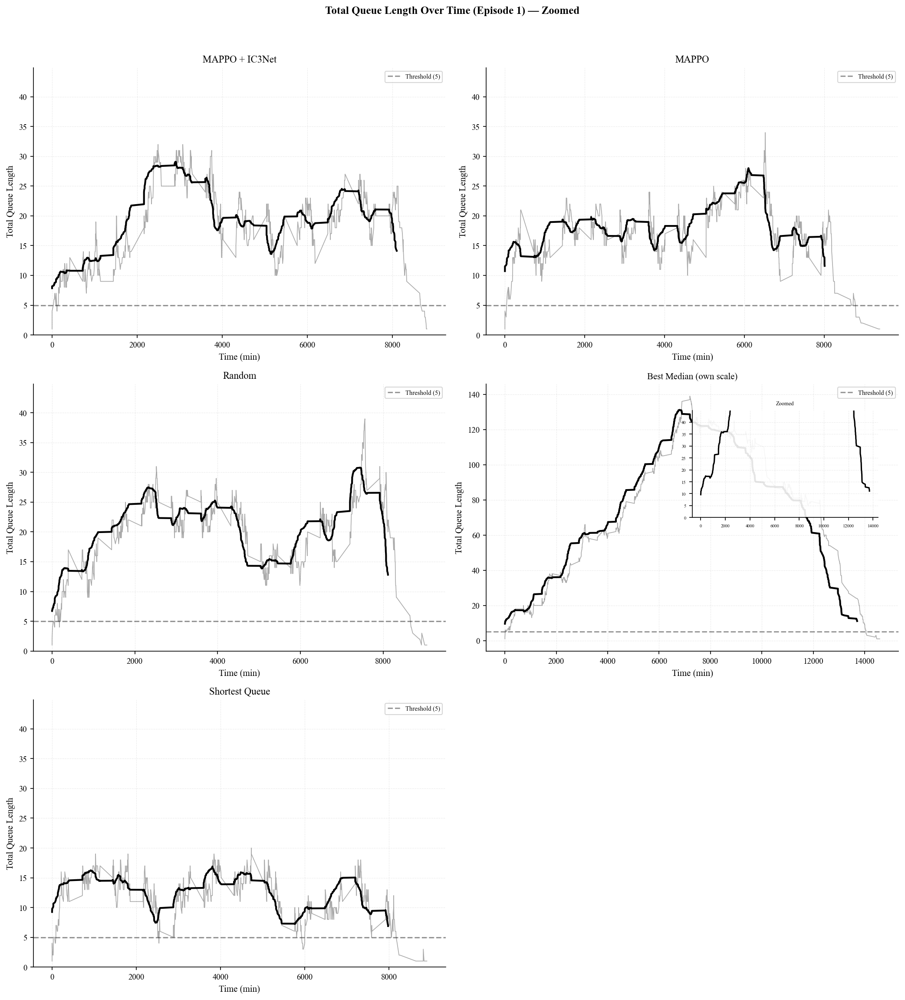

In [30]:
# ============================================================
# FIGURE 7b: Queue Length Over Time (per episode)
# Two versions: full scale + zoomed with BM inset
# ============================================================

def compute_queue_timeline(df):
    """Compute queue length at each assignment event.
    Returns sorted list of (timestamp, total_queue)."""
    if "task_agent_id" not in df.columns or len(df) == 0:
        return []
    df_s = df.sort_values("task_assigned_time").copy()
    timeline = []
    for _, row in df_s.iterrows():
        t = row["task_assigned_time"]
        if pd.isna(t):
            continue
        pending = ((df_s["task_assigned_time"] <= t) &
                   (df_s["task_completed_time"] > t)).sum()
        timeline.append((t, pending))
    return timeline

def _plot_queue_panels(all_data, title_suffix="", zoom_to_non_bm=False):
    """Plot queue length panels for all methods. If zoom_to_non_bm, excludes BM from
    shared y-axis and adds BM as inset in its own panel."""
    import math
    n = len(all_data)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows), squeeze=False)
    for ax in axes.flat[n:]:
        ax.set_visible(False)
    fig.suptitle(f"Total Queue Length Over Time (Episode 1){title_suffix}", fontweight="bold", y=1.02)

    # First pass: compute all data and find non-BM max
    panel_data = {}
    non_bm_max = 0
    for name, episodes in all_data.items():
        if not episodes:
            panel_data[name] = ([], [])
            continue
        timeline = compute_queue_timeline(episodes[0])
        if not timeline:
            panel_data[name] = ([], [])
            continue
        t0 = min(t[0] for t in timeline)
        x_min = [calc_minutes_between(t0, t[0]) for t in timeline]
        queues = [t[1] for t in timeline]
        # Smooth
        if len(queues) >= 10:
            window = max(5, len(queues) // 20)
            smoothed = list(np.convolve(queues, np.ones(window)/window, mode="valid"))
            panel_data[name] = (x_min[:len(smoothed)], smoothed, x_min, queues)
        else:
            panel_data[name] = (x_min, queues, x_min, queues)
        if not _is_best_median(name):
            non_bm_max = max(non_bm_max, max(queues) if queues else 0)

    for idx, (name, episodes) in enumerate(all_data.items()):
        ax = axes.flat[idx]
        data = panel_data[name]
        if len(data[0]) == 0:
            ax.set_title(method_label(name))
            continue

        is_bm = _is_best_median(name)

        if zoom_to_non_bm and is_bm:
            # Show BM at its own scale but mark it
            ax.plot(data[2], data[3], color="#555555", linewidth=0.8, alpha=0.5)
            if len(data[0]) > 0:
                ax.plot(data[0], data[1], color="#000000", linewidth=2)
            ax.set_title(f"{method_label(name)} (own scale)", fontsize=10)
            # Add small inset showing the zoomed range
            inset = ax.inset_axes([0.5, 0.5, 0.45, 0.4])
            inset.plot(data[0], data[1], color="#000000", linewidth=1.5)
            inset.set_ylim(0, non_bm_max * 1.15)
            inset.set_title("Zoomed", fontsize=6)
            inset.tick_params(labelsize=5)
            inset.patch.set_facecolor("white")
            inset.patch.set_alpha(0.9)
            for sp in inset.spines.values():
                sp.set_linewidth(0.8)
        else:
            ax.plot(data[2], data[3], color="#555555", linewidth=0.8, alpha=0.5)
            if len(data[0]) > 0:
                ax.plot(data[0], data[1], color="#000000", linewidth=2)
            ax.set_title(method_label(name))
            if zoom_to_non_bm:
                ax.set_ylim(0, non_bm_max * 1.15)

        ax.axhline(OVERLOAD_THRESHOLD, color="black", linestyle="--", alpha=0.4,
                   label=f"Threshold ({OVERLOAD_THRESHOLD})")
        ax.set_xlabel("Time (min)")
        ax.set_ylabel("Total Queue Length")
        ax.legend(fontsize=7)

    plt.tight_layout()
    return fig

# Version 1: Full scale
fig = _plot_queue_panels(all_data, title_suffix="")
plt.savefig("queue_length_over_time.pdf", bbox_inches="tight")
plt.show()

# Version 2: Zoomed to non-BM range
fig = _plot_queue_panels(all_data, title_suffix=" — Zoomed", zoom_to_non_bm=True)
plt.savefig("queue_length_over_time_zoomed.pdf", bbox_inches="tight")
plt.show()

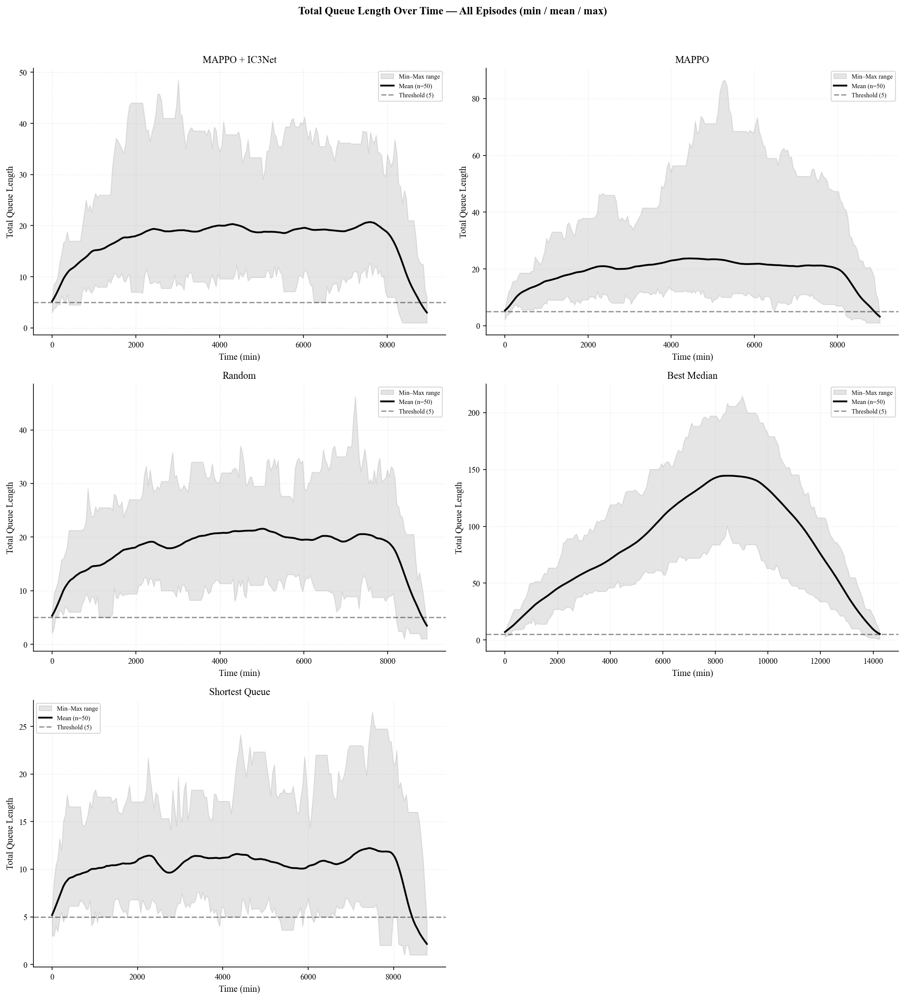

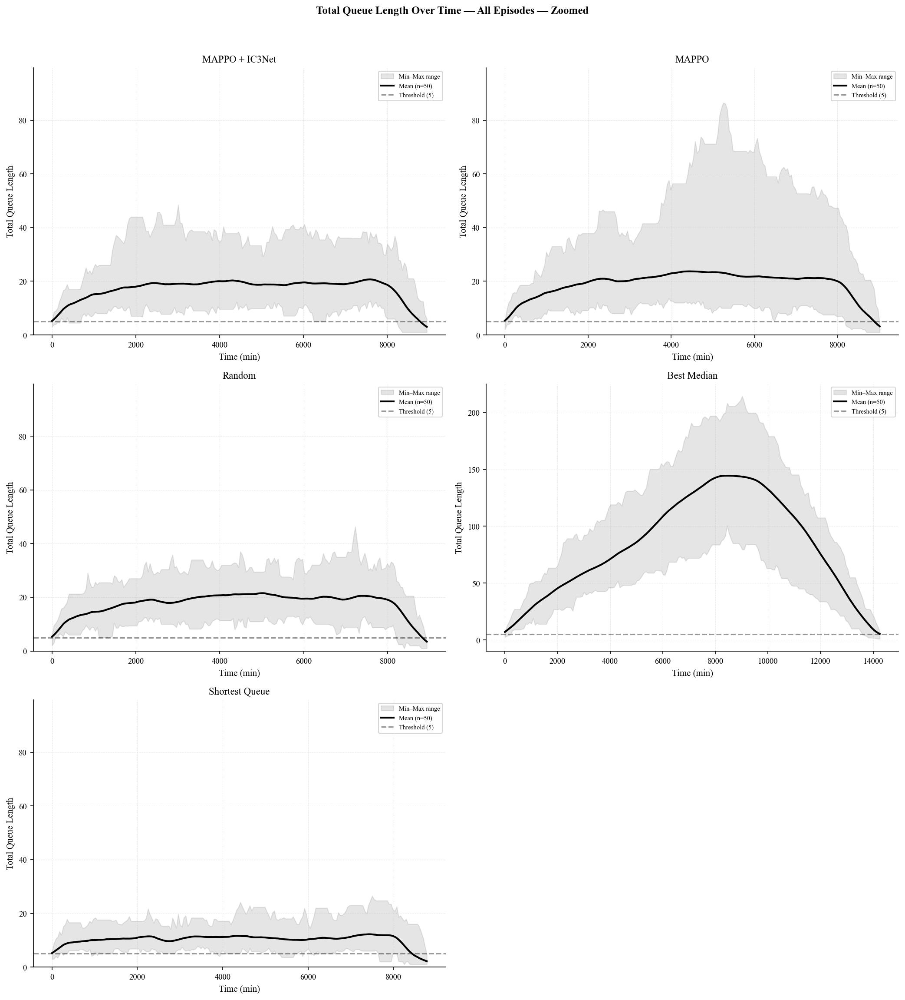

In [31]:
# ============================================================
# FIGURE 7b-2: Total Queue Length Over Time — All Episodes
# Shows min/max band + smoothed mean across episodes
# ============================================================

def compute_queue_timeline_minutes(df):
    """Compute queue length at each assignment event.
    Returns (x_minutes, queue_values) relative to episode start."""
    if "task_agent_id" not in df.columns or len(df) == 0:
        return [], []
    df_s = df.sort_values("task_assigned_time").copy()
    times, queues = [], []
    t0 = df_s["task_assigned_time"].dropna().min()
    for _, row in df_s.iterrows():
        t = row["task_assigned_time"]
        if pd.isna(t):
            continue
        pending = ((df_s["task_assigned_time"] <= t) &
                   (df_s["task_completed_time"] > t)).sum()
        times.append(calc_minutes_between(t0, t))
        queues.append(pending)
    return times, queues

def resample_to_grid(x, y, n_bins=200):
    """Resample irregular (x, y) onto a regular grid using bin averaging."""
    if len(x) == 0:
        return np.array([]), np.array([])
    x = np.array(x, dtype=float)
    y = np.array(y, dtype=float)
    x_min, x_max = x.min(), x.max()
    if x_max == x_min:
        return np.array([x_min]), np.array([np.mean(y)])
    bins = np.linspace(x_min, x_max, n_bins + 1)
    grid_x = (bins[:-1] + bins[1:]) / 2
    grid_y = np.full(n_bins, np.nan)
    idx = np.digitize(x, bins) - 1
    idx = np.clip(idx, 0, n_bins - 1)
    for b in range(n_bins):
        mask = idx == b
        if mask.any():
            grid_y[b] = np.mean(y[mask])
    # Forward-fill NaNs
    for i in range(1, len(grid_y)):
        if np.isnan(grid_y[i]):
            grid_y[i] = grid_y[i - 1]
    return grid_x, grid_y

N_GRID = 200  # resolution for resampling

import math
n = len(all_data)
n_cols = 2
n_rows = math.ceil(n / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows), squeeze=False)
for ax in axes.flat[n:]:
    ax.set_visible(False)
fig.suptitle("Total Queue Length Over Time — All Episodes (min / mean / max)",
             fontweight="bold", y=1.02)

non_bm_max = 0

for idx, (name, episodes) in enumerate(all_data.items()):
    ax = axes.flat[idx]
    if not episodes:
        ax.set_title(method_label(name))
        continue

    # Resample each episode onto a normalized time grid [0, 1]
    all_grids = []
    for ep_df in episodes:
        x, y = compute_queue_timeline_minutes(ep_df)
        if len(x) < 2:
            continue
        # Normalize to [0, 1] so episodes of different lengths align
        x_arr = np.array(x)
        x_norm = (x_arr - x_arr.min()) / (x_arr.max() - x_arr.min())
        _, grid_y = resample_to_grid(x_norm, y, N_GRID)
        if not np.all(np.isnan(grid_y)):
            all_grids.append(grid_y)

    if not all_grids:
        ax.set_title(method_label(name))
        continue

    stacked = np.array(all_grids)  # (n_episodes, N_GRID)
    mean_q = np.nanmean(stacked, axis=0)
    min_q = np.nanmin(stacked, axis=0)
    max_q = np.nanmax(stacked, axis=0)

    # Use mean episode duration for x-axis
    ep_durations = []
    for ep_df in episodes:
        ts = ep_df["task_assigned_time"].dropna()
        if len(ts) >= 2:
            ep_durations.append(calc_minutes_between(ts.min(), ts.max()))
    mean_dur = np.mean(ep_durations) if ep_durations else 1.0
    grid_x = np.linspace(0, mean_dur, N_GRID)

    # Smooth the mean
    sw = max(5, N_GRID // 20)
    mean_smooth = smooth(mean_q, sw)

    ax.fill_between(grid_x, min_q, max_q, alpha=0.15, color="#555555", label="Min–Max range")
    ax.plot(grid_x, mean_smooth, color="#000000", linewidth=2, label=f"Mean (n={len(all_grids)})")
    ax.axhline(OVERLOAD_THRESHOLD, color="black", linestyle="--", alpha=0.4,
               label=f"Threshold ({OVERLOAD_THRESHOLD})")
    ax.set_title(method_label(name))
    ax.set_xlabel("Time (min)")
    ax.set_ylabel("Total Queue Length")
    ax.legend(fontsize=7)

    if not _is_best_median(name):
        non_bm_max = max(non_bm_max, float(np.nanmax(max_q)))

plt.tight_layout()
plt.savefig("queue_length_all_episodes.pdf", bbox_inches="tight")
plt.show()

# Version 2: Zoomed (exclude BM from y-axis)
if non_bm_max > 0:
    n_rows2 = math.ceil(n / 2)
    fig2, axes2 = plt.subplots(n_rows2, 2, figsize=(14, 5 * n_rows2), squeeze=False)
    for ax in axes2.flat[n:]:
        ax.set_visible(False)
    fig2.suptitle("Total Queue Length Over Time — All Episodes — Zoomed",
                  fontweight="bold", y=1.02)

    for idx, (name, episodes) in enumerate(all_data.items()):
        ax = axes2.flat[idx]
        if not episodes:
            ax.set_title(method_label(name))
            continue

        all_grids = []
        for ep_df in episodes:
            x, y = compute_queue_timeline_minutes(ep_df)
            if len(x) < 2:
                continue
            x_arr = np.array(x)
            x_norm = (x_arr - x_arr.min()) / (x_arr.max() - x_arr.min())
            _, grid_y = resample_to_grid(x_norm, y, N_GRID)
            if not np.all(np.isnan(grid_y)):
                all_grids.append(grid_y)

        if not all_grids:
            ax.set_title(method_label(name))
            continue

        stacked = np.array(all_grids)
        mean_q = np.nanmean(stacked, axis=0)
        min_q = np.nanmin(stacked, axis=0)
        max_q = np.nanmax(stacked, axis=0)

        ep_durations = []
        for ep_df in episodes:
            ts = ep_df["task_assigned_time"].dropna()
            if len(ts) >= 2:
                ep_durations.append(calc_minutes_between(ts.min(), ts.max()))
        mean_dur = np.mean(ep_durations) if ep_durations else 1.0
        grid_x = np.linspace(0, mean_dur, N_GRID)

        sw = max(5, N_GRID // 20)
        mean_smooth = smooth(mean_q, sw)

        ax.fill_between(grid_x, min_q, max_q, alpha=0.15, color="#555555", label="Min–Max range")
        ax.plot(grid_x, mean_smooth, color="#000000", linewidth=2, label=f"Mean (n={len(all_grids)})")
        ax.axhline(OVERLOAD_THRESHOLD, color="black", linestyle="--", alpha=0.4,
                   label=f"Threshold ({OVERLOAD_THRESHOLD})")
        ax.set_title(method_label(name))
        ax.set_xlabel("Time (min)")
        ax.set_ylabel("Total Queue Length")
        ax.legend(fontsize=7)

        if not _is_best_median(name):
            ax.set_ylim(0, non_bm_max * 1.15)

    plt.tight_layout()
    plt.savefig("queue_length_all_episodes_zoomed.pdf", bbox_inches="tight")
    plt.show()

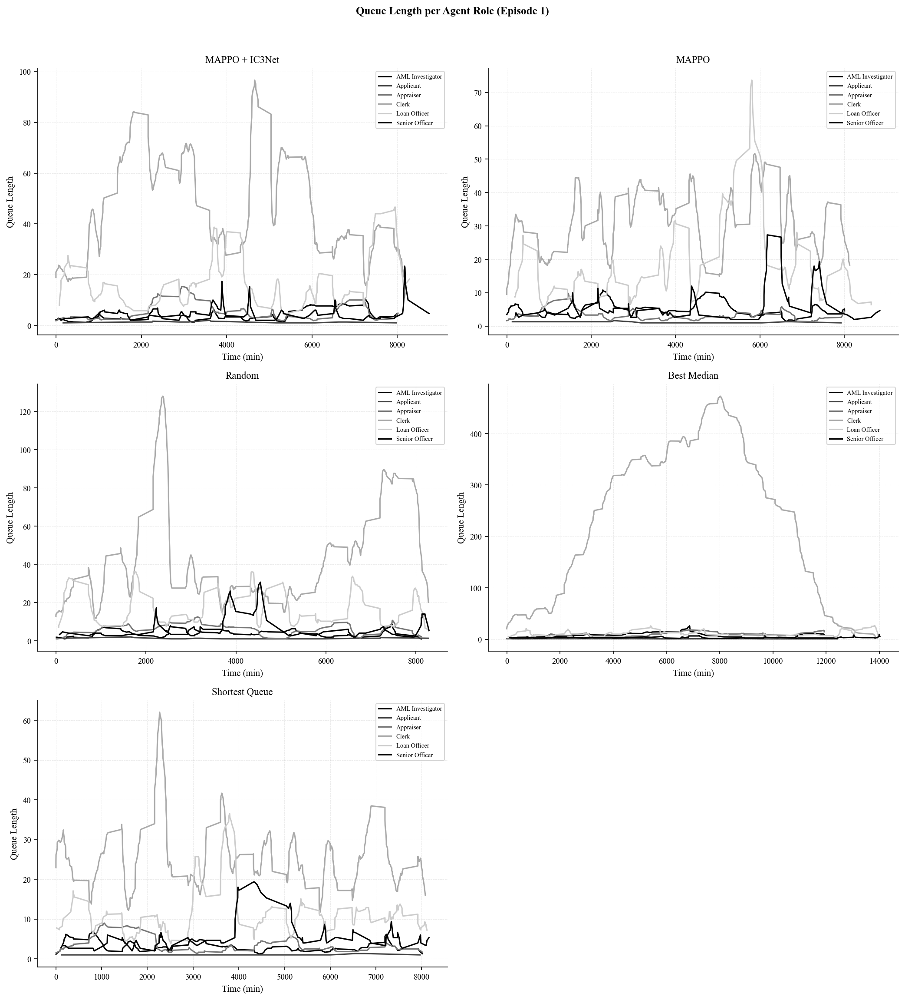

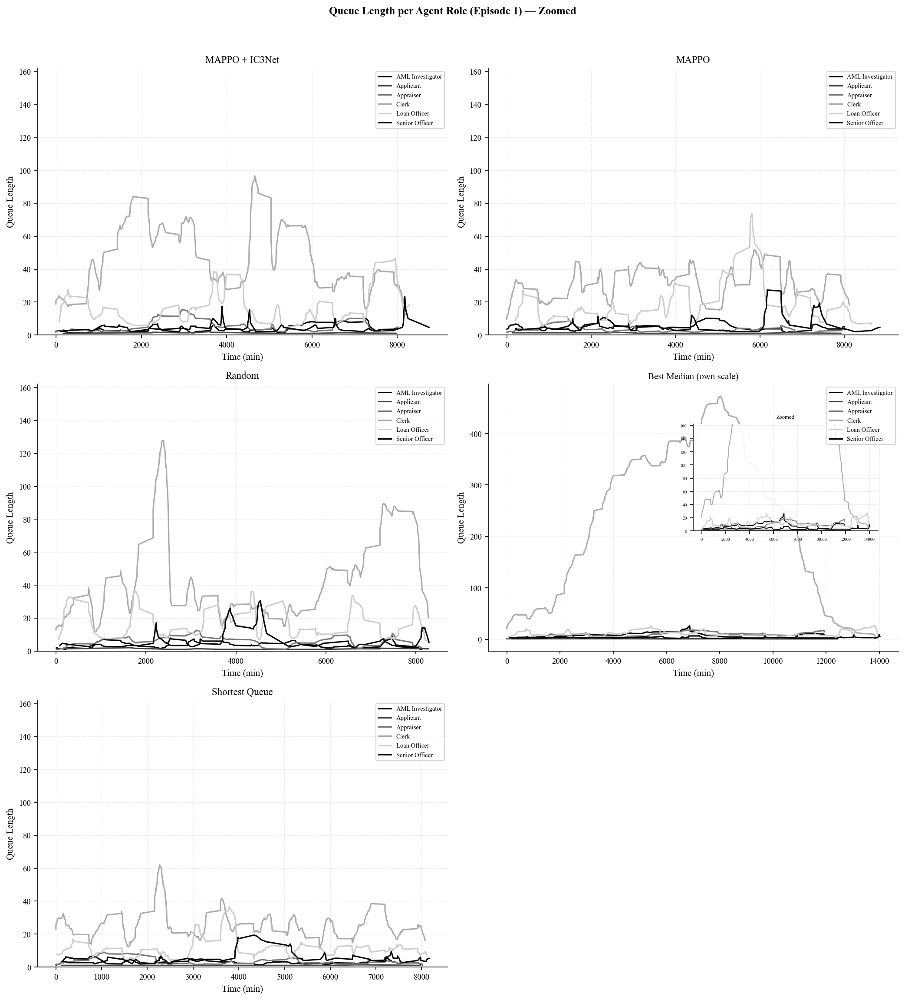

In [32]:
# ============================================================
# FIGURE 7c: Queue Length per Agent Role (Episode 1)
# Two versions: full scale + zoomed with BM inset
# ============================================================

def get_agent_role(agent_name):
    """Extract role from agent name like 'Clerk-000001'."""
    first = str(agent_name).split("|")[0]
    return first.rsplit("-", 1)[0].strip() if "-" in first else first

role_grays = {}
_rg = ["#000000", "#444444", "#777777", "#AAAAAA", "#CCCCCC"]

def _plot_queue_role_panels(all_data, title_suffix="", zoom_to_non_bm=False):
    import math
    n = len(all_data)
    n_cols = 2
    n_rows = math.ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows), squeeze=False)
    for ax in axes.flat[n:]:
        ax.set_visible(False)
    fig.suptitle(f"Queue Length per Agent Role (Episode 1){title_suffix}", fontweight="bold", y=1.02)

    # First pass: compute all role data and find non-BM max
    all_panel_data = {}
    non_bm_max = 0

    for name, episodes in all_data.items():
        if not episodes:
            all_panel_data[name] = {}
            continue
        ep = episodes[0]
        agent_col = "task_agent_name" if "task_agent_name" in ep.columns else "task_agent_id"
        df_s = ep.sort_values("task_assigned_time")
        t0 = df_s["task_assigned_time"].dropna().min()

        role_queues = defaultdict(list)
        for _, row in df_s.iterrows():
            t = row["task_assigned_time"]
            if pd.isna(t):
                continue
            agent = str(row[agent_col]).split("|")[0]
            role = get_agent_role(agent)
            role_agents = [a for a in ep[agent_col].unique()
                           if get_agent_role(str(a).split("|")[0]) == role]
            pending = 0
            for ra in role_agents:
                ra_tasks = df_s[df_s[agent_col].astype(str).str.contains(str(ra).split("|")[0], regex=False)]
                pending += ((ra_tasks["task_assigned_time"] <= t) &
                            (ra_tasks["task_completed_time"] > t)).sum()
            role_queues[role].append((t, pending))

        # Smooth each role
        panel = {}
        for role in sorted(role_queues.keys()):
            points = role_queues[role]
            if not points:
                continue
            x_min = [calc_minutes_between(t0, p[0]) for p in points]
            y_vals = [p[1] for p in points]
            if len(y_vals) >= 10:
                window = max(3, len(y_vals) // 30)
                smoothed = list(np.convolve(y_vals, np.ones(window)/window, mode="valid"))
                panel[role] = (x_min[:len(smoothed)], smoothed)
            else:
                panel[role] = (x_min, y_vals)
            if not _is_best_median(name):
                non_bm_max = max(non_bm_max, max(y_vals))

            if role not in role_grays:
                role_grays[role] = _rg[len(role_grays) % len(_rg)]

        all_panel_data[name] = panel

    # Plot
    for idx, (name, episodes) in enumerate(all_data.items()):
        ax = axes.flat[idx]
        panel = all_panel_data[name]
        is_bm = _is_best_median(name)

        if not panel:
            ax.set_title(method_label(name))
            continue

        if zoom_to_non_bm and is_bm:
            # Full scale in main, zoomed inset
            for role, (rx, ry) in panel.items():
                ax.plot(rx, ry, color=role_grays.get(role, "#555555"), linewidth=1.5, label=role)
            ax.set_title(f"{method_label(name)} (own scale)", fontsize=10)
            ax.legend(fontsize=7, loc="upper right")
            # Inset zoomed to non-BM range
            inset = ax.inset_axes([0.5, 0.45, 0.45, 0.4])
            for role, (rx, ry) in panel.items():
                inset.plot(rx, ry, color=role_grays.get(role, "#555555"), linewidth=1)
            inset.set_ylim(0, non_bm_max * 1.15)
            inset.set_title("Zoomed", fontsize=6)
            inset.tick_params(labelsize=5)
            inset.patch.set_facecolor("white")
            inset.patch.set_alpha(0.9)
            for sp in inset.spines.values():
                sp.set_linewidth(0.8)
        else:
            for role, (rx, ry) in panel.items():
                ax.plot(rx, ry, color=role_grays.get(role, "#555555"), linewidth=1.5, label=role)
            ax.set_title(method_label(name))
            ax.legend(fontsize=7, loc="upper right")
            if zoom_to_non_bm:
                ax.set_ylim(0, non_bm_max * 1.15)

        ax.set_xlabel("Time (min)")
        ax.set_ylabel("Queue Length")

    plt.tight_layout()
    return fig

# Version 1: Full scale
fig = _plot_queue_role_panels(all_data)
plt.savefig("queue_length_per_role.pdf", bbox_inches="tight")
plt.show()

# Version 2: Zoomed
fig = _plot_queue_role_panels(all_data, title_suffix=" — Zoomed", zoom_to_non_bm=True)
plt.savefig("queue_length_per_role_zoomed.pdf", bbox_inches="tight")
plt.show()

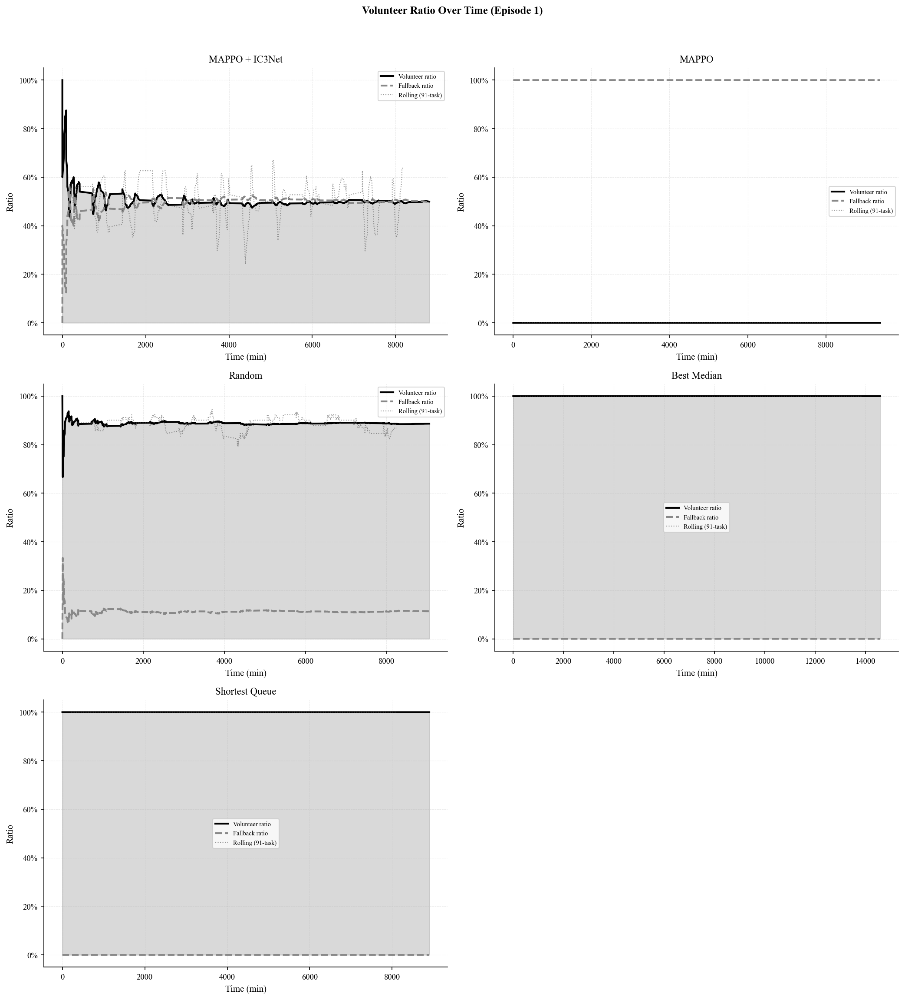

In [33]:
# ============================================================
# FIGURE 7d: Volunteer vs Fallback Ratio Over Time (Episode 1)
# Shows cumulative volunteer/fallback ratio as tasks are assigned
# ============================================================

import math
n_methods_vf = len(all_data)
n_cols = 2
n_rows = math.ceil(n_methods_vf / n_cols)
fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 5 * n_rows), squeeze=False)
for ax in axes.flat[n_methods_vf:]:
    ax.set_visible(False)
fig.suptitle("Volunteer Ratio Over Time (Episode 1)", fontweight="bold", y=1.02)

for idx, (name, episodes) in enumerate(all_data.items()):
    ax = axes.flat[idx]
    if not episodes:
        ax.set_title(method_label(name))
        continue
    
    ep = episodes[0]
    if "task_assignment_type" not in ep.columns:
        ax.set_title(method_label(name))
        ax.text(0.5, 0.5, "No assignment type data", ha="center", va="center",
                transform=ax.transAxes)
        continue
    
    df_s = ep.sort_values("task_assigned_time").copy()
    df_s = df_s.dropna(subset=["task_assigned_time", "task_assignment_type"])
    
    t0 = df_s["task_assigned_time"].min()
    x_min = [calc_minutes_between(t0, t) for t in df_s["task_assigned_time"]]
    
    # Cumulative volunteer ratio
    is_vol = df_s["task_assignment_type"].str.contains("volunteer", case=False).astype(int)
    cum_vol = is_vol.cumsum().values
    cum_total = np.arange(1, len(is_vol) + 1)
    cum_ratio = cum_vol / cum_total
    
    # Cumulative fallback ratio
    is_fb = df_s["task_assignment_type"].str.contains("fallback", case=False).astype(int)
    cum_fb = is_fb.cumsum().values
    cum_fb_ratio = cum_fb / cum_total
    
    ax.plot(x_min, cum_ratio, color="#000000", linewidth=2, label="Volunteer ratio")
    ax.plot(x_min, cum_fb_ratio, color="#888888", linewidth=2, linestyle="--",
            label="Fallback ratio")
    ax.fill_between(x_min, cum_ratio, alpha=0.15, color="#000000")
    
    # Also show instantaneous ratio (windowed)
    window = max(10, len(is_vol) // 15)
    if len(is_vol) >= window:
        rolling_vol = pd.Series(is_vol.values).rolling(window, center=True).mean()
        ax.plot(x_min, rolling_vol, color="#555555", linewidth=1, alpha=0.6,
                linestyle=":", label=f"Rolling ({window}-task)")
    
    ax.set_xlabel("Time (min)")
    ax.set_ylabel("Ratio")
    ax.set_ylim(-0.05, 1.05)
    ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))
    ax.set_title(method_label(name))
    ax.legend(fontsize=7, loc="best")

plt.tight_layout()
plt.savefig("volunteer_ratio_over_time.pdf", bbox_inches="tight")
plt.show()

In [34]:
# ============================================================
# TABLE 3b: Volunteer/Fallback Breakdown per Agent Role
# ============================================================
print(f"\n{'='*120}")
print(f"  Table 3b: Assignment Type Breakdown per Agent Role")
print(f"{'='*120}")

for name, episodes in all_data.items():
    if "task_assignment_type" not in episodes[0].columns:
        continue
    
    agent_col = "task_agent_name" if "task_agent_name" in episodes[0].columns else "task_agent_id"
    role_assign = defaultdict(lambda: defaultdict(int))
    role_totals = defaultdict(int)
    
    for ep in episodes:
        for _, row in ep.iterrows():
            agent = str(row[agent_col]).split("|")[0]
            role = get_agent_role(agent)
            atype = str(row.get("task_assignment_type", "unknown"))
            role_assign[role][atype] += 1
            role_totals[role] += 1
    
    rows = []
    for role in sorted(role_assign.keys()):
        total = role_totals[role]
        vol = sum(v for k, v in role_assign[role].items() if "volunteer" in k.lower())
        fb = sum(v for k, v in role_assign[role].items() if "fallback" in k.lower())
        rows.append({
            "Role": role,
            "Total Tasks": total,
            "Volunteer": f"{vol} ({vol/total:.1%})" if total > 0 else "—",
            "Fallback": f"{fb} ({fb/total:.1%})" if total > 0 else "—",
            "Vol. Ratio": f"{vol/total:.1%}" if total > 0 else "—",
        })
    
    print(f"\n  ▸ {method_label(name)}")
    display(pd.DataFrame(rows).set_index("Role"))


  Table 3b: Assignment Type Breakdown per Agent Role

  ▸ MAPPO + IC3Net


,Total Tasks,Volunteer,Fallback,Vol. Ratio
Role,,,,
AML Investigator,9250,3608 (39.0%),5642 (61.0%),39.0%
Applicant,900,341 (37.9%),559 (62.1%),37.9%
Appraiser,9250,3580 (38.7%),5670 (61.3%),38.7%
Clerk,29550,15072 (51.0%),14478 (49.0%),51.0%
Loan Officer,14500,6832 (47.1%),7668 (52.9%),47.1%
Senior Officer,5250,2131 (40.6%),3119 (59.4%),40.6%



  ▸ MAPPO


,Total Tasks,Volunteer,Fallback,Vol. Ratio
Role,,,,
AML Investigator,9250,176 (1.9%),9074 (98.1%),1.9%
Applicant,900,4 (0.4%),896 (99.6%),0.4%
Appraiser,9250,185 (2.0%),9065 (98.0%),2.0%
Clerk,29550,3425 (11.6%),26125 (88.4%),11.6%
Loan Officer,14500,637 (4.4%),13863 (95.6%),4.4%
Senior Officer,5250,83 (1.6%),5167 (98.4%),1.6%



  ▸ Random


,Total Tasks,Volunteer,Fallback,Vol. Ratio
Role,,,,
AML Investigator,9250,6909 (74.7%),2341 (25.3%),74.7%
Applicant,900,451 (50.1%),449 (49.9%),50.1%
Appraiser,9250,6899 (74.6%),2351 (25.4%),74.6%
Clerk,29550,29430 (99.6%),120 (0.4%),99.6%
Loan Officer,14500,13588 (93.7%),912 (6.3%),93.7%
Senior Officer,5250,3964 (75.5%),1286 (24.5%),75.5%



  ▸ Best Median


,Total Tasks,Volunteer,Fallback,Vol. Ratio
Role,,,,
AML Investigator,9250,9250 (100.0%),0 (0.0%),100.0%
Applicant,900,900 (100.0%),0 (0.0%),100.0%
Appraiser,9250,9250 (100.0%),0 (0.0%),100.0%
Clerk,29550,29550 (100.0%),0 (0.0%),100.0%
Loan Officer,14500,14500 (100.0%),0 (0.0%),100.0%
Senior Officer,5250,5250 (100.0%),0 (0.0%),100.0%



  ▸ Shortest Queue


,Total Tasks,Volunteer,Fallback,Vol. Ratio
Role,,,,
AML Investigator,9250,9250 (100.0%),0 (0.0%),100.0%
Applicant,900,900 (100.0%),0 (0.0%),100.0%
Appraiser,9250,9250 (100.0%),0 (0.0%),100.0%
Clerk,29550,29550 (100.0%),0 (0.0%),100.0%
Loan Officer,14500,14500 (100.0%),0 (0.0%),100.0%
Senior Officer,5250,5250 (100.0%),0 (0.0%),100.0%


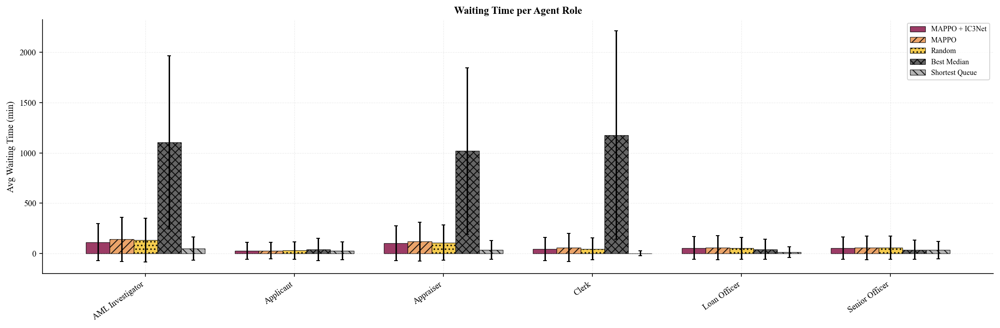

In [35]:
# ============================================================
# FIGURE 7e: Waiting Time per Agent Role (coloured)
# Bar chart comparing avg waiting time per role across methods
# ============================================================

# Collect waiting times by role for each method
role_wait_data = {}  # method -> {role: [waiting_times]}
all_roles = set()
for name, episodes in all_data.items():
    rw = defaultdict(list)
    agent_col = "task_agent_name" if "task_agent_name" in episodes[0].columns else "task_agent_id"
    for ep in episodes:
        for _, row in ep.iterrows():
            if pd.notna(row.get("task_assigned_time")) and pd.notna(row.get("task_started_time")):
                wt = max(0, calc_minutes_between(row["task_assigned_time"], row["task_started_time"]))
                agent = str(row[agent_col]).split("|")[0]
                role = get_agent_role(agent)
                rw[role].append(wt)
                all_roles.add(role)
    role_wait_data[name] = rw

all_roles = sorted(all_roles)
method_names_list = list(all_data.keys())
n_methods = len(method_names_list)
n_roles = len(all_roles)

fig, ax = plt.subplots(figsize=(max(10, n_roles * 2.5), 5))
ax.set_title("Waiting Time per Agent Role", fontweight="bold")

bar_width = 0.8 / n_methods
x_roles = np.arange(n_roles)

for mi, name in enumerate(method_names_list):
    means = []
    stds = []
    for role in all_roles:
        vals = role_wait_data[name].get(role, [])
        means.append(np.mean(vals) if vals else 0)
        stds.append(np.std(vals) if vals else 0)
    
    offset = (mi - n_methods / 2 + 0.5) * bar_width
    bars = ax.bar(x_roles + offset, means, bar_width, yerr=stds, capsize=2,
                  color=styles[name]["color"], hatch=styles[name]["hatch"],
                  edgecolor="black", linewidth=0.6, alpha=0.85,
                  label=method_label(name))

ax.set_xticks(x_roles)
ax.set_xticklabels(all_roles, rotation=35, ha="right")
ax.set_ylabel("Avg Waiting Time (min)")
ax.legend(fontsize=8, loc="upper right")

plt.tight_layout()
plt.savefig("waiting_time_per_role.pdf", bbox_inches="tight")
plt.show()

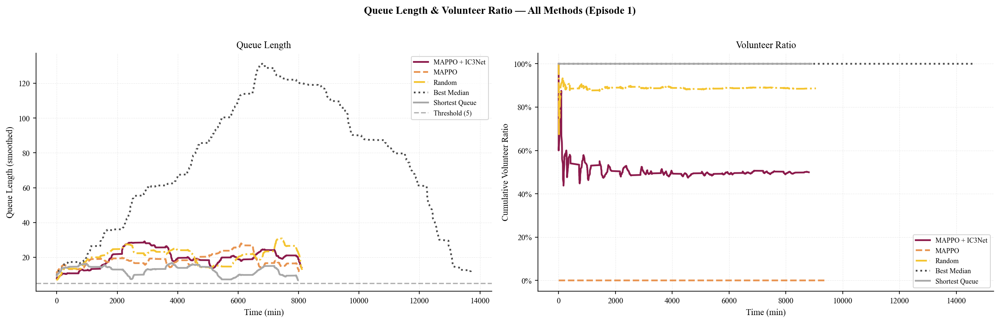

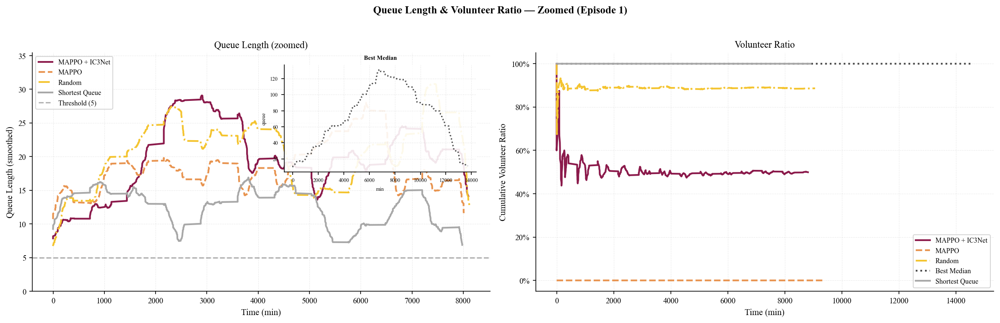

In [36]:
# ============================================================
# FIGURE 7f: All Methods Overlay — Queue & Volunteer (Episode 1)
# Two versions: full scale + zoomed (inset for Best Median)
# ============================================================

# ── Version 1: Full scale ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle("Queue Length & Volunteer Ratio — All Methods (Episode 1)", fontweight="bold", y=1.02)

for name, episodes in all_data.items():
    if not episodes:
        continue
    ep = episodes[0]
    s = styles[name]
    df_s = ep.sort_values("task_assigned_time").dropna(subset=["task_assigned_time"])
    if len(df_s) == 0:
        continue
    t0 = df_s["task_assigned_time"].min()
    x_min = [calc_minutes_between(t0, t) for t in df_s["task_assigned_time"]]
    queues = []
    for _, row in df_s.iterrows():
        t = row["task_assigned_time"]
        pending = ((df_s["task_assigned_time"] <= t) & (df_s["task_completed_time"] > t)).sum()
        queues.append(pending)
    if len(queues) >= 10:
        window = max(5, len(queues) // 20)
        smoothed = np.convolve(queues, np.ones(window)/window, mode="valid")
        ax1.plot(x_min[:len(smoothed)], smoothed, color=s["color"],
                 linestyle=s["linestyle"], linewidth=2, label=method_label(name))
    else:
        ax1.plot(x_min, queues, color=s["color"], linestyle=s["linestyle"],
                 linewidth=2, label=method_label(name))
    if "task_assignment_type" in ep.columns:
        is_vol = df_s["task_assignment_type"].str.contains("volunteer", case=False, na=False).astype(int)
        cum_ratio = is_vol.cumsum().values / np.arange(1, len(is_vol) + 1)
        ax2.plot(x_min, cum_ratio, color=s["color"], linestyle=s["linestyle"],
                 linewidth=2, label=method_label(name))

ax1.axhline(OVERLOAD_THRESHOLD, color="black", linestyle="--", alpha=0.3, label=f"Threshold ({OVERLOAD_THRESHOLD})")
ax1.set_xlabel("Time (min)"); ax1.set_ylabel("Queue Length (smoothed)"); ax1.set_title("Queue Length")
ax1.legend(fontsize=8)
ax2.set_xlabel("Time (min)"); ax2.set_ylabel("Cumulative Volunteer Ratio")
ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0)); ax2.set_ylim(-0.05, 1.05)
ax2.set_title("Volunteer Ratio"); ax2.legend(fontsize=8)
plt.tight_layout()
plt.savefig("queue_volunteer_overlay.pdf", bbox_inches="tight")
plt.show()

# ── Version 2: Zoomed to non-Best-Median range, with BM inset ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle("Queue Length & Volunteer Ratio — Zoomed (Episode 1)", fontweight="bold", y=1.02)

# Collect data for determining zoom range
bm_queue_data = None
non_bm_max_queue = 0

for name, episodes in all_data.items():
    if not episodes:
        continue
    ep = episodes[0]
    s = styles[name]
    df_s = ep.sort_values("task_assigned_time").dropna(subset=["task_assigned_time"])
    if len(df_s) == 0:
        continue
    t0 = df_s["task_assigned_time"].min()
    x_min = [calc_minutes_between(t0, t) for t in df_s["task_assigned_time"]]
    queues = []
    for _, row in df_s.iterrows():
        t = row["task_assigned_time"]
        pending = ((df_s["task_assigned_time"] <= t) & (df_s["task_completed_time"] > t)).sum()
        queues.append(pending)

    if len(queues) >= 10:
        window = max(5, len(queues) // 20)
        smoothed = list(np.convolve(queues, np.ones(window)/window, mode="valid"))
        plot_x, plot_y = x_min[:len(smoothed)], smoothed
    else:
        plot_x, plot_y = x_min, queues

    if _is_best_median(name):
        bm_queue_data = (plot_x, plot_y, s)
    else:
        ax1.plot(plot_x, plot_y, color=s["color"], linestyle=s["linestyle"],
                 linewidth=2, label=method_label(name))
        non_bm_max_queue = max(non_bm_max_queue, max(plot_y) if plot_y else 0)

    if "task_assignment_type" in ep.columns:
        is_vol = df_s["task_assignment_type"].str.contains("volunteer", case=False, na=False).astype(int)
        cum_ratio = is_vol.cumsum().values / np.arange(1, len(is_vol) + 1)
        ax2.plot(x_min, cum_ratio, color=s["color"], linestyle=s["linestyle"],
                 linewidth=2, label=method_label(name))

# Set y-axis to non-BM range with some padding
ax1.set_ylim(0, non_bm_max_queue * 1.15)
ax1.axhline(OVERLOAD_THRESHOLD, color="black", linestyle="--", alpha=0.3, label=f"Threshold ({OVERLOAD_THRESHOLD})")
ax1.set_xlabel("Time (min)"); ax1.set_ylabel("Queue Length (smoothed)"); ax1.set_title("Queue Length (zoomed)")
ax1.legend(fontsize=8)

# Add Best Median as inset
if bm_queue_data:
    inset = ax1.inset_axes([0.55, 0.50, 0.42, 0.45])  # [x, y, width, height] in axes coords
    bx, by, bs = bm_queue_data
    inset.plot(bx, by, color=bs["color"], linestyle=bs["linestyle"], linewidth=1.5)
    inset.set_title("Best Median", fontsize=7, fontweight="bold")
    inset.tick_params(labelsize=6)
    inset.set_xlabel("min", fontsize=6)
    inset.set_ylabel("queue", fontsize=6)
    inset.patch.set_alpha(0.9)
    inset.patch.set_facecolor("white")
    for spine in inset.spines.values():
        spine.set_edgecolor("black")
        spine.set_linewidth(0.8)

ax2.set_xlabel("Time (min)"); ax2.set_ylabel("Cumulative Volunteer Ratio")
ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0)); ax2.set_ylim(-0.05, 1.05)
ax2.set_title("Volunteer Ratio"); ax2.legend(fontsize=8)
plt.tight_layout()
plt.savefig("queue_volunteer_overlay_zoomed.pdf", bbox_inches="tight")
plt.show()


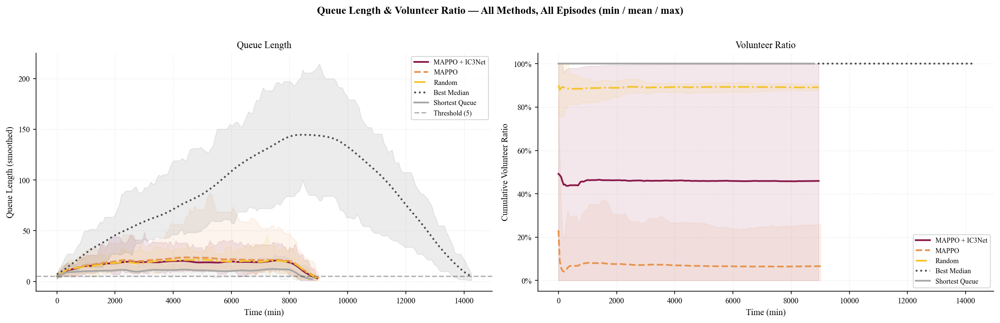

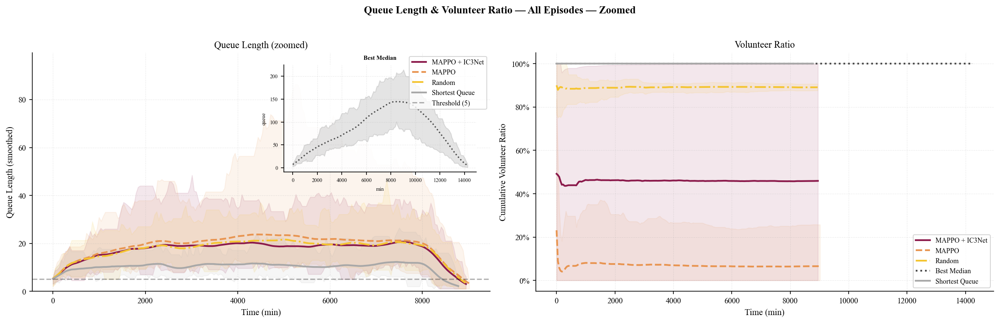

In [37]:
# ============================================================
# FIGURE 7f-2: All Methods Overlay — Queue & Volunteer — All Episodes
# Min/max band + smoothed mean across episodes
# ============================================================

n_methods = len(all_data)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle("Queue Length & Volunteer Ratio — All Methods, All Episodes (min / mean / max)",
             fontweight="bold", y=1.02)

non_bm_max_queue = 0
bm_queue_plot = None  # store for inset in zoomed version

for name, episodes in all_data.items():
    if not episodes or len(episodes) == 0:
        continue
    s = styles[name]

    # ── Queue: resample each episode, then aggregate ──
    all_q_grids = []
    ep_durations = []
    for ep_df in episodes:
        x, y = compute_queue_timeline_minutes(ep_df)
        if len(x) < 2:
            continue
        x_arr = np.array(x)
        x_norm = (x_arr - x_arr.min()) / (x_arr.max() - x_arr.min())
        _, grid_y = resample_to_grid(x_norm, y, N_GRID)
        if not np.all(np.isnan(grid_y)):
            all_q_grids.append(grid_y)
            ep_durations.append(x_arr.max() - x_arr.min())

    if all_q_grids:
        stacked = np.array(all_q_grids)
        mean_q = np.nanmean(stacked, axis=0)
        min_q = np.nanmin(stacked, axis=0)
        max_q = np.nanmax(stacked, axis=0)
        mean_dur = np.mean(ep_durations)
        grid_x = np.linspace(0, mean_dur, N_GRID)
        sw = max(5, N_GRID // 20)
        mean_smooth = smooth(mean_q, sw)

        ax1.fill_between(grid_x, min_q, max_q, alpha=0.10, color=s["color"])
        ax1.plot(grid_x, mean_smooth, color=s["color"], linestyle=s["linestyle"],
                 linewidth=2, label=method_label(name))

        if not _is_best_median(name):
            non_bm_max_queue = max(non_bm_max_queue, float(np.nanmax(max_q)))
        else:
            bm_queue_plot = (grid_x, mean_smooth, min_q, max_q, s)

    # ── Volunteer ratio: resample cumulative ratio per episode ──
    all_v_grids = []
    v_durations = []
    for ep_df in episodes:
        if "task_assignment_type" not in ep_df.columns:
            continue
        df_s = ep_df.sort_values("task_assigned_time").dropna(subset=["task_assigned_time"])
        if len(df_s) < 2:
            continue
        t0 = df_s["task_assigned_time"].min()
        x_min = np.array([calc_minutes_between(t0, t) for t in df_s["task_assigned_time"]])
        is_vol = df_s["task_assignment_type"].str.contains("volunteer", case=False, na=False).astype(int)
        cum_ratio = is_vol.cumsum().values / np.arange(1, len(is_vol) + 1)
        x_norm = (x_min - x_min.min()) / (x_min.max() - x_min.min())
        _, grid_v = resample_to_grid(x_norm, cum_ratio, N_GRID)
        if not np.all(np.isnan(grid_v)):
            all_v_grids.append(grid_v)
            v_durations.append(x_min.max() - x_min.min())

    if all_v_grids:
        v_stacked = np.array(all_v_grids)
        mean_v = np.nanmean(v_stacked, axis=0)
        min_v = np.nanmin(v_stacked, axis=0)
        max_v = np.nanmax(v_stacked, axis=0)
        mean_v_dur = np.mean(v_durations)
        grid_v_x = np.linspace(0, mean_v_dur, N_GRID)

        ax2.fill_between(grid_v_x, min_v, max_v, alpha=0.10, color=s["color"])
        ax2.plot(grid_v_x, mean_v, color=s["color"], linestyle=s["linestyle"],
                 linewidth=2, label=method_label(name))

ax1.axhline(OVERLOAD_THRESHOLD, color="black", linestyle="--", alpha=0.3,
            label=f"Threshold ({OVERLOAD_THRESHOLD})")
ax1.set_xlabel("Time (min)"); ax1.set_ylabel("Queue Length (smoothed)")
ax1.set_title("Queue Length"); ax1.legend(fontsize=8)
ax2.set_xlabel("Time (min)"); ax2.set_ylabel("Cumulative Volunteer Ratio")
ax2.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))
ax2.set_ylim(-0.05, 1.05); ax2.set_title("Volunteer Ratio"); ax2.legend(fontsize=8)
plt.tight_layout()
plt.savefig("queue_volunteer_overlay_all_episodes.pdf", bbox_inches="tight")
plt.show()

# ── Version 2: Zoomed with BM inset ──
if non_bm_max_queue > 0:
    fig2, (ax1z, ax2z) = plt.subplots(1, 2, figsize=(16, 5))
    fig2.suptitle("Queue Length & Volunteer Ratio — All Episodes — Zoomed",
                  fontweight="bold", y=1.02)

    for name, episodes in all_data.items():
        if not episodes:
            continue
        s = styles[name]

        # Queue
        all_q_grids = []
        ep_durations = []
        for ep_df in episodes:
            x, y = compute_queue_timeline_minutes(ep_df)
            if len(x) < 2:
                continue
            x_arr = np.array(x)
            x_norm = (x_arr - x_arr.min()) / (x_arr.max() - x_arr.min())
            _, grid_y = resample_to_grid(x_norm, y, N_GRID)
            if not np.all(np.isnan(grid_y)):
                all_q_grids.append(grid_y)
                ep_durations.append(x_arr.max() - x_arr.min())

        if not all_q_grids:
            continue

        stacked = np.array(all_q_grids)
        mean_q = np.nanmean(stacked, axis=0)
        min_q = np.nanmin(stacked, axis=0)
        max_q = np.nanmax(stacked, axis=0)
        mean_dur = np.mean(ep_durations)
        grid_x = np.linspace(0, mean_dur, N_GRID)
        sw = max(5, N_GRID // 20)
        mean_smooth = smooth(mean_q, sw)

        if not _is_best_median(name):
            ax1z.fill_between(grid_x, min_q, max_q, alpha=0.10, color=s["color"])
            ax1z.plot(grid_x, mean_smooth, color=s["color"], linestyle=s["linestyle"],
                      linewidth=2, label=method_label(name))

        # Volunteer
        all_v_grids = []
        v_durations = []
        for ep_df in episodes:
            if "task_assignment_type" not in ep_df.columns:
                continue
            df_s = ep_df.sort_values("task_assigned_time").dropna(subset=["task_assigned_time"])
            if len(df_s) < 2:
                continue
            t0 = df_s["task_assigned_time"].min()
            x_min = np.array([calc_minutes_between(t0, t) for t in df_s["task_assigned_time"]])
            is_vol = df_s["task_assignment_type"].str.contains("volunteer", case=False, na=False).astype(int)
            cum_ratio = is_vol.cumsum().values / np.arange(1, len(is_vol) + 1)
            x_norm = (x_min - x_min.min()) / (x_min.max() - x_min.min())
            _, grid_v = resample_to_grid(x_norm, cum_ratio, N_GRID)
            if not np.all(np.isnan(grid_v)):
                all_v_grids.append(grid_v)
                v_durations.append(x_min.max() - x_min.min())

        if all_v_grids:
            v_stacked = np.array(all_v_grids)
            mean_v = np.nanmean(v_stacked, axis=0)
            min_v = np.nanmin(v_stacked, axis=0)
            max_v = np.nanmax(v_stacked, axis=0)
            mean_v_dur = np.mean(v_durations)
            grid_v_x = np.linspace(0, mean_v_dur, N_GRID)
            ax2z.fill_between(grid_v_x, min_v, max_v, alpha=0.10, color=s["color"])
            ax2z.plot(grid_v_x, mean_v, color=s["color"], linestyle=s["linestyle"],
                      linewidth=2, label=method_label(name))

    ax1z.set_ylim(0, non_bm_max_queue * 1.15)
    ax1z.axhline(OVERLOAD_THRESHOLD, color="black", linestyle="--", alpha=0.3,
                 label=f"Threshold ({OVERLOAD_THRESHOLD})")
    ax1z.set_xlabel("Time (min)"); ax1z.set_ylabel("Queue Length (smoothed)")
    ax1z.set_title("Queue Length (zoomed)"); ax1z.legend(fontsize=8)

    # BM inset
    if bm_queue_plot:
        inset = ax1z.inset_axes([0.55, 0.50, 0.42, 0.45])
        bx, by, bmin, bmax, bs = bm_queue_plot
        inset.fill_between(bx, bmin, bmax, alpha=0.15, color=bs["color"])
        inset.plot(bx, by, color=bs["color"], linestyle=bs["linestyle"], linewidth=1.5)
        inset.set_title("Best Median", fontsize=7, fontweight="bold")
        inset.tick_params(labelsize=6)
        inset.set_xlabel("min", fontsize=6); inset.set_ylabel("queue", fontsize=6)
        inset.patch.set_alpha(0.9); inset.patch.set_facecolor("white")
        for spine in inset.spines.values():
            spine.set_edgecolor("black"); spine.set_linewidth(0.8)

    ax2z.set_xlabel("Time (min)"); ax2z.set_ylabel("Cumulative Volunteer Ratio")
    ax2z.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))
    ax2z.set_ylim(-0.05, 1.05); ax2z.set_title("Volunteer Ratio"); ax2z.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig("queue_volunteer_overlay_all_episodes_zoomed.pdf", bbox_inches="tight")
    plt.show()

In [38]:
# ============================================================
# Load Gate Activation Data (IC3Net comm only) — multi-seed
# ============================================================
# gate_activations.csv is saved per episode with columns:
#   step, activity, Agent1, Agent2, ...  (1=gate open, 0=closed)
# Multi-seed: pools episodes from every run\'s method-dir.

gate_data = {}  # method_name -> list of DataFrames (one per episode, pooled across runs)
for name in methods:
    ep_gates = []
    seen_dirs = set()
    for run_idx, csv_path in run_map[name]:
        # Derive method dir from CSV paths: .../logs/final_eval/*.csv -> ...
        method_dir = os.path.dirname(os.path.dirname(os.path.dirname(csv_path)))
        if method_dir in seen_dirs:
            continue
        seen_dirs.add(method_dir)
        episodes_dir = os.path.join(method_dir, "episodes")
        if not os.path.isdir(episodes_dir):
            continue
        for ep_name in sorted(os.listdir(episodes_dir)):
            gate_file = os.path.join(episodes_dir, ep_name, "gate_activations.csv")
            if os.path.isfile(gate_file):
                df = pd.read_csv(gate_file)
                df["episode"] = ep_name
                df["run_idx"] = run_idx
                ep_gates.append(df)
    if ep_gates:
        gate_data[name] = ep_gates
        n_runs_with = len({df["run_idx"].iloc[0] for df in ep_gates})
        print(f"{method_label(name)}: {len(ep_gates)} episodes with gate data "
              f"(across {n_runs_with} runs), {len(ep_gates[0].columns)-4} agents")

if not gate_data:
    print("No gate activation data found. Run experiments with updated trainer to generate gate_activations.csv")


No gate activation data found. Run experiments with updated trainer to generate gate_activations.csv


In [39]:
# ============================================================
# FIGURE 9c: Gate Activation Heatmap (Agents x Timesteps, MAPPO + IC3Net only)
# Shows which agents communicate at which moments (last pooled episode).
# Agents grouped by role with separator lines.
# Visuals: grayscale heatmap cells (cmap="Greys"); y-tick labels and right-side
# role labels use the notebook-wide ROLE_COLORS palette (same as FIG 7b).
# ============================================================

# Re-use the project-wide role palette (same as FIG 7b per-resource)
_HEATMAP_ROLE_COLORS = {
    "AML Investigator": "#FFCD00",  # yellow
    "Appraiser":        "#F3965E",  # orange
    "Applicant":        "#AA1555",  # magenta
    "Clerk":            "#5287C6",  # blue
    "Loan Officer":     "#24A793",  # teal
    "Senior Officer":   "#5B2182",  # purple
}
_HEATMAP_FALLBACK = ["#000000", "#444444", "#777777", "#AA4444", "#4444AA"]

if gate_data:
    comm_gate_data = {k: v for k, v in gate_data.items() if "comm" in k}

    if comm_gate_data:
        fig, axes = plt.subplots(1, len(comm_gate_data), figsize=(12, 6), squeeze=False)
        fig.suptitle("Gate Activation Heatmap — Last Episode (MAPPO + IC3Net)", fontweight="bold", y=1.02)

        for idx, (name, ep_list) in enumerate(comm_gate_data.items()):
            ax = axes[0][idx]

            # Use last pooled episode
            last_ep = ep_list[-1]
            agent_cols = [c for c in last_ep.columns
                          if c not in ("step", "activity", "episode", "run_idx")]

            # Group agents by role and sort within groups
            def get_role(agent_name):
                return agent_name.rsplit("-", 1)[0].strip()

            role_order = {}
            for a in agent_cols:
                role = get_role(a)
                if role not in role_order:
                    role_order[role] = []
                role_order[role].append(a)

            # Sort roles alphabetically, agents within role by name
            sorted_agents = []
            role_boundaries = []  # (start_idx, role_name)
            for role in sorted(role_order.keys()):
                role_boundaries.append((len(sorted_agents), role))
                sorted_agents.extend(sorted(role_order[role]))

            # Reorder gate matrix by grouped agents
            gate_matrix = last_ep[sorted_agents].values.T  # (n_agents, n_timesteps)

            # Downsample if too many timesteps
            max_bins = 200
            n_steps = gate_matrix.shape[1]
            bin_size = 1
            if n_steps > max_bins:
                bin_size = n_steps // max_bins
                n_bins = n_steps // bin_size
                gate_matrix = gate_matrix[:, :n_bins * bin_size].reshape(
                    gate_matrix.shape[0], n_bins, bin_size
                ).mean(axis=2)

            # Grayscale heatmap cells (blokjes blijven zwart/wit/grijs)
            im = ax.imshow(gate_matrix, aspect="auto", cmap="Greys", vmin=0, vmax=1,
                           interpolation="nearest")

            # Role-coloured labels using the project palette
            role_colors = {}
            for i_role, role in enumerate(sorted(role_order.keys())):
                if role in _HEATMAP_ROLE_COLORS:
                    role_colors[role] = _HEATMAP_ROLE_COLORS[role]
                else:
                    role_colors[role] = _HEATMAP_FALLBACK[i_role % len(_HEATMAP_FALLBACK)]

            ax.set_yticks(range(len(sorted_agents)))
            short_labels = [a.rsplit("-", 1)[-1] for a in sorted_agents]
            ax.set_yticklabels(short_labels, fontsize=7, family="monospace")

            # Color y-tick labels by role (bold for visibility on white)
            for i_tick, agent in enumerate(sorted_agents):
                role = get_role(agent)
                lab = ax.get_yticklabels()[i_tick]
                lab.set_color(role_colors[role])
                lab.set_fontweight("bold")

            # Draw horizontal separator lines between roles + role labels on the right
            for i_boundary, (start_idx, role) in enumerate(role_boundaries):
                if start_idx > 0:
                    ax.axhline(start_idx - 0.5, color="white", linewidth=2)
                n_in_role = len(role_order[role])
                mid_y = start_idx + n_in_role / 2 - 0.5
                ax.text(1.02, mid_y, role,
                        fontsize=8, va="center", ha="left", color=role_colors[role],
                        fontweight="bold", transform=ax.get_yaxis_transform(), clip_on=False)

            # X-axis: show approximate simulation time
            x_label = "Timestep"
            if bin_size > 1:
                x_label = f"Timestep (bins of {bin_size} steps)"
            ax.set_xlabel(x_label)
            ax.set_title("MAPPO + IC3Net")

            # Colorbar and layout
            cbar = plt.colorbar(im, ax=ax, label="Gate Open Rate", shrink=0.8, pad=0.15)

        plt.tight_layout()
        plt.subplots_adjust(right=0.75)
        plt.savefig("gate_activation_heatmap.pdf", bbox_inches="tight")
        plt.show()
    else:
        print("Skipping: no comm-enabled methods with gate data")
else:
    print("Skipping: no gate activation data available")


Skipping: no gate activation data available


### Not yet available (requires code changes + re-run)

- **Gate activation heatmap** (agents × timesteps): Needs gate decision logging in `communication.py`.
- **Gate activation per activity type**: Needs task-type correlation with gate data.
- **Case-level timeline screenshots**: Generate manually from RETrace Studio (2-3 cases side-by-side with/without communication).

---
## Summary

In [40]:
# ============================================================
# COMBINED SUMMARY TABLE — all §7.2 metrics
# Groups: Process performance | Operational behaviour | Learning efficiency
# ============================================================
def fmt_ms(m, s, pct=False, dec=1):
    """Format mean ± std."""
    if m is None or np.isnan(m):
        return "—"
    if pct:
        return f"{m:.{dec}%} ± {s:.{dec}%}"
    return f"{m:.{dec}f} ± {s:.{dec}f}"

method_names = list(all_data.keys())

rows = []
for name in method_names:
    row = {"Method": method_label(name)}

    # ── §7.2.1 Process performance ──────────────────────────
    pm = process_metrics.get(name, [])
    def p_agg(key):
        v = [m[key] for m in pm if not np.isnan(m.get(key, np.nan))]
        return (np.mean(v), np.std(v)) if v else (np.nan, np.nan)

    ct_m, ct_s = p_agg("avg_cycle_time_min")
    wt_m, wt_s = p_agg("avg_waiting_time_min")
    ut_m, ut_s = p_agg("resource_utilization")
    tp_m, tp_s = p_agg("case_throughput_per_hour")
    fe_m, fe_s = p_agg("flow_efficiency")

    row["Cycle Time (min)"]      = fmt_ms(ct_m, ct_s)
    row["Waiting Time (min)"]    = fmt_ms(wt_m, wt_s)
    row["Utilisation ρ"]         = fmt_ms(ut_m, ut_s, pct=True)
    row["Throughput λ (/hr)"]    = fmt_ms(tp_m, tp_s)
    row["Flow Efficiency η"]     = fmt_ms(fe_m, fe_s, pct=True)

    # ── §7.2.3 Operational behaviour ────────────────────────
    om = operational_metrics.get(name, [])
    def o_agg(key):
        v = [m[key] for m in om if not np.isnan(m.get(key, np.nan))]
        return (np.mean(v), np.std(v)) if v else (np.nan, np.nan)

    ql_m, ql_s = o_agg("avg_queue_length")
    or_m, or_s = o_agg("overload_ratio")
    wf_m, wf_s = o_agg("workload_fairness_cv")
    vr_m, vr_s = o_agg("volunteer_ratio")

    row["Queue Length Q̄"]                    = fmt_ms(ql_m, ql_s, dec=2)
    row[f"Overload OR_{OVERLOAD_THRESHOLD}"] = fmt_ms(or_m, or_s, pct=True)
    row["Fairness WF"]                       = fmt_ms(wf_m, wf_s, dec=3)
    row["Volunteer Ratio VR"]                = fmt_ms(vr_m, vr_s, pct=True)

    # ── §7.2.2 Learning efficiency (only for trainable methods) ──
    if name in learning_metrics and learning_metrics[name]:
        lm = learning_metrics[name]
        if lm.get("convergence_mean") is not None:
            n_conv = lm.get("n_converged", 0)
            n_seeds = lm.get("n_seeds", 0)
            if lm.get("convergence_std") is not None:
                conv_str = f"{lm['convergence_mean']:.1f} ± {lm['convergence_std']:.1f}"
            else:
                conv_str = f"{lm['convergence_mean']:.1f}"
            if n_conv < n_seeds:
                conv_str += f" ({n_conv}/{n_seeds})"
        else:
            conv_str = f"n/a (0/{lm.get('n_seeds', 0)})"

        row["Convergence e*"] = conv_str
        row["AULC"] = (
            f"{lm['aulc_mean']:.1f} ± {lm['aulc_std']:.1f}"
            if not np.isnan(lm.get("aulc_mean", np.nan)) else "—"
        )
        row["CV_final"] = (
            f"{lm['cv_final']:.3f}"
            if not np.isnan(lm.get("cv_final", np.nan)) else "—"
        )
    else:
        row["Convergence e*"] = "—"
        row["AULC"]           = "—"
        row["CV_final"]       = "—"

    rows.append(row)

df_combined = pd.DataFrame(rows).set_index("Method")

# ── Column groups ─────────────────────────────────────────────────
proc_cols  = ["Cycle Time (min)", "Waiting Time (min)", "Utilisation ρ",
              "Throughput λ (/hr)", "Flow Efficiency η"]
oper_cols  = ["Queue Length Q̄", f"Overload OR_{OVERLOAD_THRESHOLD}",
              "Fairness WF", "Volunteer Ratio VR"]
learn_cols = ["Convergence e*", "AULC", "CV_final"]

# ── Combined display ──────────────────────────────────────────────
print(f"\n{'='*130}")
print(f"  Combined Results Summary — all §7.2 metrics  ({time_label}; aggregated over {len(RESOLVED_DIRS)} seed(s))")
print(f"{'='*130}")
display(df_combined)

# ── Per-group sub-tables ──────────────────────────────────────────
print(f"\n{'='*100}")
print("  Process Performance Metrics (§7.2.1)")
print(f"{'='*100}")
display(df_combined[proc_cols])

print(f"\n{'='*100}")
print("  Operational Behaviour Metrics (§7.2.3)")
print(f"{'='*100}")
display(df_combined[oper_cols])

print(f"\n{'='*100}")
print("  Learning Efficiency Metrics (§7.2.2, MARL methods only)")
print(f"{'='*100}")
learn_df = df_combined[learn_cols]
learn_df = learn_df[~(learn_df == "—").all(axis=1)]  # drop rows with no learning data
display(learn_df)



  Combined Results Summary — all §7.2 metrics  (working hours (07:00-15:00); aggregated over 5 seed(s))


,Cycle Time (min),Waiting Time (min),Utilisation ρ,Throughput λ (/hr),Flow Efficiency η,Queue Length Q̄,Overload OR_5,Fairness WF,Volunteer Ratio VR,Convergence e*,AULC,CV_final
Method,,,,,,,,,,,,
MAPPO + IC3Net,641.8 ± 96.5,64.2 ± 15.0,9.1% ± 0.5%,1.2 ± 0.0,57.3% ± 5.4%,0.76 ± 0.15,3.2% ± 1.6%,1.511 ± 0.037,45.9% ± 40.1%,10.0 ± 0.0 (4/5),-29658.5 ± 6410.8,0.545
MAPPO,718.7 ± 178.6,77.2 ± 28.4,9.1% ± 0.6%,1.2 ± 0.0,52.7% ± 7.7%,0.92 ± 0.27,4.7% ± 3.0%,1.504 ± 0.042,6.6% ± 9.0%,10.0 ± 0.0,-36114.1 ± 423.6,0.040
Random,657.6 ± 77.8,67.5 ± 11.6,9.2% ± 0.6%,1.2 ± 0.0,56.2% ± 4.5%,0.80 ± 0.14,3.5% ± 1.7%,1.501 ± 0.038,89.1% ± 0.7%,—,—,—
Best Median,4247.7 ± 667.3,804.9 ± 123.5,11.5% ± 0.7%,0.8 ± 0.1,12.9% ± 2.1%,10.20 ± 1.45,45.0% ± 2.8%,1.547 ± 0.017,100.0% ± 0.0%,—,—,—
Shortest Queue,360.0 ± 35.1,18.2 ± 4.8,9.2% ± 0.5%,1.3 ± 0.0,94.7% ± 4.9%,0.18 ± 0.04,0.1% ± 0.3%,1.509 ± 0.034,100.0% ± 0.0%,—,—,—



  Process Performance Metrics (§7.2.1)


,Cycle Time (min),Waiting Time (min),Utilisation ρ,Throughput λ (/hr),Flow Efficiency η
Method,,,,,
MAPPO + IC3Net,641.8 ± 96.5,64.2 ± 15.0,9.1% ± 0.5%,1.2 ± 0.0,57.3% ± 5.4%
MAPPO,718.7 ± 178.6,77.2 ± 28.4,9.1% ± 0.6%,1.2 ± 0.0,52.7% ± 7.7%
Random,657.6 ± 77.8,67.5 ± 11.6,9.2% ± 0.6%,1.2 ± 0.0,56.2% ± 4.5%
Best Median,4247.7 ± 667.3,804.9 ± 123.5,11.5% ± 0.7%,0.8 ± 0.1,12.9% ± 2.1%
Shortest Queue,360.0 ± 35.1,18.2 ± 4.8,9.2% ± 0.5%,1.3 ± 0.0,94.7% ± 4.9%



  Operational Behaviour Metrics (§7.2.3)


,Queue Length Q̄,Overload OR_5,Fairness WF,Volunteer Ratio VR
Method,,,,
MAPPO + IC3Net,0.76 ± 0.15,3.2% ± 1.6%,1.511 ± 0.037,45.9% ± 40.1%
MAPPO,0.92 ± 0.27,4.7% ± 3.0%,1.504 ± 0.042,6.6% ± 9.0%
Random,0.80 ± 0.14,3.5% ± 1.7%,1.501 ± 0.038,89.1% ± 0.7%
Best Median,10.20 ± 1.45,45.0% ± 2.8%,1.547 ± 0.017,100.0% ± 0.0%
Shortest Queue,0.18 ± 0.04,0.1% ± 0.3%,1.509 ± 0.034,100.0% ± 0.0%



  Learning Efficiency Metrics (§7.2.2, MARL methods only)


,Convergence e*,AULC,CV_final
Method,,,
MAPPO + IC3Net,10.0 ± 0.0 (4/5),-29658.5 ± 6410.8,0.545
MAPPO,10.0 ± 0.0,-36114.1 ± 423.6,0.040
